# Project description

You've done beautifully in the Practicum course, and you've been offered an internship in the analytical department at Yandex.Afisha. Your first task is to help optimize marketing expenses.

###### You have:

   * Server logs with data on Yandex.Afisha visits from June 2017 through May 2018
   * Dump file with all orders for the period
   * Marketing expenses statistics
   
   
###### You are going to study:
   * How people use the product
   * When they start to buy
   * How much money each customer brings
   * When they pay off
   

# Initialization

# Step 1. Download the data and prepare it for analysis


Store the data on visits, orders, and expenses in variables. Optimize the data for analysis. Make sure each column contains the correct data type.


In [1]:
# Loading all the libraries

import pandas as pd
import numpy as np
from scipy import stats as st
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from pandas import Series, DataFrame
from matplotlib import pyplot as plt
import matplotlib.colors as mcolors
import datetime
from datetime import timedelta
import plotly.express as px
import plotly.graph_objects as go

import warnings
warnings.filterwarnings('ignore')
import plotly.express as px


In [2]:
try:
    visits = pd.read_csv('visits_log_us.csv')
    orders = pd.read_csv('orders_log_us.csv')
    costs = pd.read_csv('costs_us.csv')
except:    
    visits = pd.read_csv('/datasets/visits_log_us.csv')
    orders = pd.read_csv('/datasets/orders_log_us.csv')
    costs = pd.read_csv('/datasets/costs_us.csv')
finally:
    print('Try to read files')
       
visits.head()

Try to read files


,Device,End Ts,Source Id,Start Ts,Uid
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168


# Data description

The project contains the following DataFrame:

The visits table (server logs with data on website visits):
   * Uid — user's unique identifier 
   * Device — user's device 
   * Start Ts — session start date and time 
   * End Ts — session end date and time 
   * Source Id — identifier of the ad source the user came from 
   
   
All dates in this table are in YYYY-MM-DD format.



The orders table (data on orders): 
   * Uid — unique identifier of the user making an order 
   * Buy Ts — order date and time 
   * Revenue — Yandex.Afisha's revenue from the order
   
   

The costs table (data on marketing expenses): 
   * source_id — ad source identifier 
   * dt — date 
   * costs — expenses on this ad source on this day
   
   

In [3]:
# To know the number of columns and rows in the DataFrame
visits.shape

(359400, 5)

In [4]:
# Get information about the DataFrame
visits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   Device     359400 non-null  object
 1   End Ts     359400 non-null  object
 2   Source Id  359400 non-null  int64 
 3   Start Ts   359400 non-null  object
 4   Uid        359400 non-null  uint64
dtypes: int64(1), object(3), uint64(1)
memory usage: 13.7+ MB


In [5]:
# Check data type of the DataFrame
visits.dtypes

Device       object
End Ts       object
Source Id     int64
Start Ts     object
Uid          uint64
dtype: object

In [6]:
# To get information about statistical character of the DataFrame
visits.describe()

,Source Id,Uid
count,359400.000000,3.594000e+05
mean,3.750515,9.202557e+18
std,1.917116,5.298433e+18
min,1.000000,1.186350e+13
25%,3.000000,4.613407e+18
50%,4.000000,9.227413e+18
75%,5.000000,1.372824e+19
max,10.000000,1.844668e+19


In [7]:
# Checking duplicates in the DataFrame
visits.duplicated().sum()

0

In [8]:
# To confirm the missing values of the DataFrame
visits.isna().sum()

Device       0
End Ts       0
Source Id    0
Start Ts     0
Uid          0
dtype: int64

In [9]:
# To get the percentile information of the columns in the dataframe
visits.isnull().sum()*100/len(visits)

Device       0.0
End Ts       0.0
Source Id    0.0
Start Ts     0.0
Uid          0.0
dtype: float64

In [10]:
# Print a sample of DataFrame for gamess
visits.head(10)

,Device,End Ts,Source Id,Start Ts,Uid
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168
5,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387
6,desktop,2018-01-30 12:09:00,1,2018-01-30 11:13:00,6661610529277171451
7,touch,2017-11-05 15:15:00,3,2017-11-05 15:14:00,11423865690854540312
8,desktop,2017-07-19 10:44:00,3,2017-07-19 10:41:00,2987360259350925644
9,desktop,2017-11-08 13:43:00,5,2017-11-08 13:42:00,1289240080042562063


In [11]:
# To know the number of columns and rows in the DataFrame
orders.shape

(50415, 3)

In [12]:
# Get information about the DataFrame
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Buy Ts   50415 non-null  object 
 1   Revenue  50415 non-null  float64
 2   Uid      50415 non-null  uint64 
dtypes: float64(1), object(1), uint64(1)
memory usage: 1.2+ MB


In [13]:
# Check data type of the DataFrame
orders.dtypes

Buy Ts      object
Revenue    float64
Uid         uint64
dtype: object

In [14]:
# To get information about statistical character of the DataFrame
orders.describe()

,Revenue,Uid
count,50415.000000,5.041500e+04
mean,4.999647,9.098161e+18
std,21.818359,5.285742e+18
min,0.000000,3.135781e+14
25%,1.220000,4.533567e+18
50%,2.500000,9.102274e+18
75%,4.890000,1.368290e+19
max,2633.280000,1.844617e+19


In [15]:
# Checking duplicates in the DataFrame
orders.duplicated().sum()

0

In [16]:
# To confirm the missing values of the DataFrame
orders.isna().sum()

Buy Ts     0
Revenue    0
Uid        0
dtype: int64

In [17]:
# To get the percentile information of the columns in the dataframe
orders.isnull().sum()*100/len(orders)

Buy Ts     0.0
Revenue    0.0
Uid        0.0
dtype: float64

In [18]:
# Print a sample of DataFrame for gamess
orders.head(10)

,Buy Ts,Revenue,Uid
0,2017-06-01 00:10:00,17.00,10329302124590727494
1,2017-06-01 00:25:00,0.55,11627257723692907447
2,2017-06-01 00:27:00,0.37,17903680561304213844
3,2017-06-01 00:29:00,0.55,16109239769442553005
4,2017-06-01 07:58:00,0.37,14200605875248379450
5,2017-06-01 08:43:00,0.18,10402394430196413321
6,2017-06-01 08:54:00,1.83,12464626743129688638
7,2017-06-01 09:22:00,1.22,3644482766749211722
8,2017-06-01 09:22:00,3.30,17542070709969841479
9,2017-06-01 09:23:00,0.37,1074355127080856382


In [19]:
# To know the number of columns and rows in the DataFrame
costs.shape

(2542, 3)

In [20]:
# Get information about the DataFrame
costs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2542 entries, 0 to 2541
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   source_id  2542 non-null   int64  
 1   dt         2542 non-null   object 
 2   costs      2542 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 59.7+ KB


In [21]:
# Check data type of the DataFrame
costs.dtypes

source_id      int64
dt            object
costs        float64
dtype: object

In [22]:
# To get information about statistical character of the DataFrame
costs.describe()

,source_id,costs
count,2542.000000,2542.000000
mean,4.857199,129.477427
std,3.181581,156.296628
min,1.000000,0.540000
25%,2.000000,21.945000
50%,4.000000,77.295000
75%,9.000000,170.065000
max,10.000000,1788.280000


In [23]:
# Checking duplicates in the DataFrame
costs.duplicated().sum()

0

In [24]:
# To confirm the missing values of the DataFrame
costs.isna().sum()

source_id    0
dt           0
costs        0
dtype: int64

In [25]:
# To get the percentile information of the columns in the dataframe
costs.isnull().sum()*100/len(costs)

source_id    0.0
dt           0.0
costs        0.0
dtype: float64

In [26]:
# Print a sample of DataFrame for gamess
costs.head(10)

,source_id,dt,costs
0,1,2017-06-01,75.20
1,1,2017-06-02,62.25
2,1,2017-06-03,36.53
3,1,2017-06-04,55.00
4,1,2017-06-05,57.08
5,1,2017-06-06,40.39
6,1,2017-06-07,40.59
7,1,2017-06-08,56.63
8,1,2017-06-09,40.16
9,1,2017-06-10,43.24


###### Conclusion

* The DataFrame visits has 359,400 rows and 5 columns. It has object, int64 and uint64 data types.
* The DataFrame orders has 50,415 rows and 3 columns. It has object, float64 and uint64 data types.
* The DataFrame costs has 2,542 rows and 3 columns. It has object, int64 and float64 data types.
* It is confirmed that in the three DataFrames, there are no duplicates and missing values.
* The date and time data types should be converted to the right data type.
* The column names of visits and orders DataFrames needs to be fixed (convert to lower case). 


# Data Preprocessing

In [27]:
# Get information about the DataFrame
visits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   Device     359400 non-null  object
 1   End Ts     359400 non-null  object
 2   Source Id  359400 non-null  int64 
 3   Start Ts   359400 non-null  object
 4   Uid        359400 non-null  uint64
dtypes: int64(1), object(3), uint64(1)
memory usage: 13.7+ MB


In [28]:
# To check whether column's name are written in appropriate way
visits.columns

Index(['Device', 'End Ts', 'Source Id', 'Start Ts', 'Uid'], dtype='object')

In [29]:
# To convert the columns' names into lower case
visits.columns= visits.columns.str.strip().str.lower()

In [30]:
# To confirm if the columns' names are converted into the lower case
visits.columns

Index(['device', 'end ts', 'source id', 'start ts', 'uid'], dtype='object')

In [31]:
# To convert data type from object into datetime
visits['end ts'] =  pd.to_datetime(visits['end ts'], format='%Y-%m-%d %H:%M:%S')

In [32]:
# To convert data type from object into datetime
visits['start ts'] =  pd.to_datetime(visits['start ts'], format='%Y-%m-%d %H:%M:%S')

In [33]:
# Renaming columns in the DataFrame
visits.rename(columns = {'end ts':'end_ts', 'start ts':'start_ts', 'source id':'source_id'}, inplace = True)


In [34]:
# Get information about the DataFrame
visits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   device     359400 non-null  object        
 1   end_ts     359400 non-null  datetime64[ns]
 2   source_id  359400 non-null  int64         
 3   start_ts   359400 non-null  datetime64[ns]
 4   uid        359400 non-null  uint64        
dtypes: datetime64[ns](2), int64(1), object(1), uint64(1)
memory usage: 13.7+ MB


In [35]:
# To check if there are unique values
visits['device'].unique()

array(['touch', 'desktop'], dtype=object)

In [36]:
# To check if there are unique values
visits['end_ts'].unique()

array(['2017-12-20T17:38:00.000000000', '2018-02-19T17:21:00.000000000',
       '2017-07-01T01:54:00.000000000', ...,
       '2018-03-03T10:12:19.000000000', '2017-11-02T10:12:19.000000000',
       '2017-09-10T13:13:19.000000000'], dtype='datetime64[ns]')

In [37]:
# To check if there are unique values
visits['source_id'].unique()

array([ 4,  2,  5,  9,  3,  1, 10,  7,  6])

In [38]:
# To check if there are unique values
visits['start_ts'].unique()

array(['2017-12-20T17:20:00.000000000', '2018-02-19T16:53:00.000000000',
       '2017-07-01T01:54:00.000000000', ...,
       '2017-06-08T07:49:00.000000000', '2018-01-25T17:38:00.000000000',
       '2017-09-10T13:13:00.000000000'], dtype='datetime64[ns]')

In [39]:
# To check if there are unique values
visits['uid'].unique()

array([16879256277535980062,   104060357244891740,  7459035603376831527,
       ..., 11102751930812818282,   272012551460639309,
        3266363999948772866], dtype=uint64)

In [40]:
# Statistical infirmation of the data
visits.describe()

,source_id,uid
count,359400.000000,3.594000e+05
mean,3.750515,9.202557e+18
std,1.917116,5.298433e+18
min,1.000000,1.186350e+13
25%,3.000000,4.613407e+18
50%,4.000000,9.227413e+18
75%,5.000000,1.372824e+19
max,10.000000,1.844668e+19


In [41]:
# Get information about the DataFrame
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Buy Ts   50415 non-null  object 
 1   Revenue  50415 non-null  float64
 2   Uid      50415 non-null  uint64 
dtypes: float64(1), object(1), uint64(1)
memory usage: 1.2+ MB


In [42]:
# To check whether column's name are written in appropriate way
orders.columns

Index(['Buy Ts', 'Revenue', 'Uid'], dtype='object')

In [43]:
# To convert the columns' names into lower case
orders.columns= orders.columns.str.strip().str.lower()

In [44]:
# To confirm if the columns' names are converted into the lower case
orders.columns

Index(['buy ts', 'revenue', 'uid'], dtype='object')

In [45]:
# Renaming columns in the DataFrame
orders.columns = orders.columns.str.replace('buy ts', 'buy_ts')


In [46]:
# To convert data type from object into datetime
orders['buy_ts'] =  pd.to_datetime(orders['buy_ts'], format='%Y-%m-%d %H:%M:%S')

In [47]:
# Get information about the DataFrame
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   buy_ts   50415 non-null  datetime64[ns]
 1   revenue  50415 non-null  float64       
 2   uid      50415 non-null  uint64        
dtypes: datetime64[ns](1), float64(1), uint64(1)
memory usage: 1.2 MB


In [48]:
# To check if there are unique values
orders['buy_ts'].unique()

array(['2017-06-01T00:10:00.000000000', '2017-06-01T00:25:00.000000000',
       '2017-06-01T00:27:00.000000000', ...,
       '2018-05-31T23:54:00.000000000', '2018-05-31T23:56:00.000000000',
       '2018-06-01T00:02:00.000000000'], dtype='datetime64[ns]')

In [49]:
# To check if there are unique values
orders['revenue'].unique()

array([ 17.  ,   0.55,   0.37, ..., 290.58, 120.51,  92.89])

In [50]:
# To check if there are unique values
orders['uid'].unique()

array([10329302124590727494, 11627257723692907447, 17903680561304213844,
       ...,  1786462140797698849,  3993697860786194247,
          83872787173869366], dtype=uint64)

In [51]:
# Statistical information about the data
orders.describe()

,revenue,uid
count,50415.000000,5.041500e+04
mean,4.999647,9.098161e+18
std,21.818359,5.285742e+18
min,0.000000,3.135781e+14
25%,1.220000,4.533567e+18
50%,2.500000,9.102274e+18
75%,4.890000,1.368290e+19
max,2633.280000,1.844617e+19


In [52]:
# Get information about the DataFrame
costs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2542 entries, 0 to 2541
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   source_id  2542 non-null   int64  
 1   dt         2542 non-null   object 
 2   costs      2542 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 59.7+ KB


In [53]:
# To check whether column's name are written in appropriate way
costs.columns

Index(['source_id', 'dt', 'costs'], dtype='object')

In [54]:
# To convert data type from object into datetime
costs['dt'] =  pd.to_datetime(costs['dt'], format='%Y-%m-%d %H:%M:%S')

In [55]:
# Get information about the DataFrame
costs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2542 entries, 0 to 2541
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   source_id  2542 non-null   int64         
 1   dt         2542 non-null   datetime64[ns]
 2   costs      2542 non-null   float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 59.7 KB


In [56]:
# To check if there are unique values
costs['source_id'].unique()

array([ 1,  2,  3,  4,  5,  9, 10])

In [57]:
# To check if there are unique values
costs['dt'].unique()

array(['2017-06-01T00:00:00.000000000', '2017-06-02T00:00:00.000000000',
       '2017-06-03T00:00:00.000000000', '2017-06-04T00:00:00.000000000',
       '2017-06-05T00:00:00.000000000', '2017-06-06T00:00:00.000000000',
       '2017-06-07T00:00:00.000000000', '2017-06-08T00:00:00.000000000',
       '2017-06-09T00:00:00.000000000', '2017-06-10T00:00:00.000000000',
       '2017-06-11T00:00:00.000000000', '2017-06-12T00:00:00.000000000',
       '2017-06-13T00:00:00.000000000', '2017-06-14T00:00:00.000000000',
       '2017-06-15T00:00:00.000000000', '2017-06-16T00:00:00.000000000',
       '2017-06-17T00:00:00.000000000', '2017-06-18T00:00:00.000000000',
       '2017-06-19T00:00:00.000000000', '2017-06-20T00:00:00.000000000',
       '2017-06-21T00:00:00.000000000', '2017-06-22T00:00:00.000000000',
       '2017-06-23T00:00:00.000000000', '2017-06-24T00:00:00.000000000',
       '2017-06-25T00:00:00.000000000', '2017-06-26T00:00:00.000000000',
       '2017-06-27T00:00:00.000000000', '2017-06-28

In [58]:
# To check if there are unique values
costs['costs'].unique()

array([75.2 , 62.25, 36.53, ..., 11.32, 33.15, 17.6 ])

In [59]:
# Statistical information about the data
costs.describe()

,source_id,costs
count,2542.000000,2542.000000
mean,4.857199,129.477427
std,3.181581,156.296628
min,1.000000,0.540000
25%,2.000000,21.945000
50%,4.000000,77.295000
75%,9.000000,170.065000
max,10.000000,1788.280000


# Step 2. Make reports and calculate metrics:

###### Product

     * How many people use it every day, week, and month?
     * How many sessions are there per day? (One user might have more than one session.)
     * What is the length of each session?
     * What's the user retention rate?
     
     
###### Sales

      * When do people start buying? (In KPI analysis, we're usually interested in knowing the time that elapses between registration and conversion — when the user becomes a customer. For example, if registration and the first purchase occur on the same day, the user might fall into category Conversion 0d. If the first purchase happens the next day, it will be Conversion 1d. You can use any approach that lets you compare the conversions of different cohorts, so that you can determine which cohort, or marketing channel, is most effective.)
      * How many orders do they make during a given period of time? 
      * What is the average purchase size?
      * How much money do they bring? (LTV)
      
      
###### Marketing

      * How much money was spent? Overall/per source/over time
      * How much did customer acquisition from each of the sources cost?
      * How worthwhile where the investments? (ROI)
      
      
Plot graphs to display how these metrics differ for various devices and ad sources and how they change in time.

###### Make reports and calculate metrics:

Product
 * How many people use it every day, week, and month?
 * How many sessions are there per day? (One user might have more than one session.)
 * What is the length of each session?
 * What's the user retention rate?

###### How many people use it every day, week, and month?

In [60]:
# To calculate weekly and monthly activity, we'll first create separate columns for year, month, and week values.
# visits['session_year']  = visits['start_ts'].dt.isocalendar().year
# visits['session_month'] = visits['start_ts'].dt.month
# visits['session_week']  = visits['start_ts'].dt.isocalendar().week
# visits['session_date'] = visits['start_ts'].dt.date


In [61]:
visits['session_year']  = visits['start_ts'].astype('datetime64[Y]')
visits['session_month'] = visits['start_ts'].astype('datetime64[M]')
visits['session_week']  = visits['start_ts'].astype('datetime64[W]')
visits['session_date'] = visits['start_ts'].astype('datetime64[D]')


In [62]:
print(visits.head()) 

    device              end_ts  source_id            start_ts  \
0    touch 2017-12-20 17:38:00          4 2017-12-20 17:20:00   
1  desktop 2018-02-19 17:21:00          2 2018-02-19 16:53:00   
2    touch 2017-07-01 01:54:00          5 2017-07-01 01:54:00   
3  desktop 2018-05-20 11:23:00          9 2018-05-20 10:59:00   
4  desktop 2017-12-27 14:06:00          3 2017-12-27 14:06:00   

                    uid session_year session_month session_week session_date  
0  16879256277535980062   2017-01-01    2017-12-01   2017-12-14   2017-12-20  
1    104060357244891740   2018-01-01    2018-02-01   2018-02-15   2018-02-19  
2   7459035603376831527   2017-01-01    2017-07-01   2017-06-29   2017-07-01  
3  16174680259334210214   2018-01-01    2018-05-01   2018-05-17   2018-05-20  
4   9969694820036681168   2017-01-01    2017-12-01   2017-12-21   2017-12-27  


In [63]:
# Calculate metrics and group the data by session date, week and month and find the means:
dau_visits = visits.groupby('session_date').agg({'uid': 'nunique'}).mean()
wau_visits = visits.groupby(['session_year', 'session_week']).agg({'uid': 'nunique'}).mean()
mau_visits = visits.groupby(['session_year', 'session_month']).agg({'uid': 'nunique'}).mean()

In [64]:
# Daily, weekly and monthly active users
print(int(dau_visits))
print(int(wau_visits)) 
print(int(mau_visits))

907
5621
23228


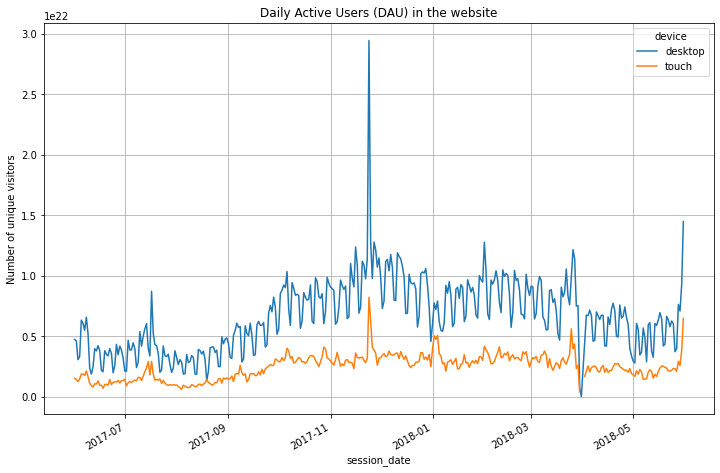

In [65]:
visits.pivot_table(index = 'session_date', columns = 'device', values = 'uid', aggfunc = 'sum').plot(grid = True, figsize = (12,8))
plt.title('Daily Active Users (DAU) in the website')
plt.ylabel('Number of unique visitors')
plt.show()

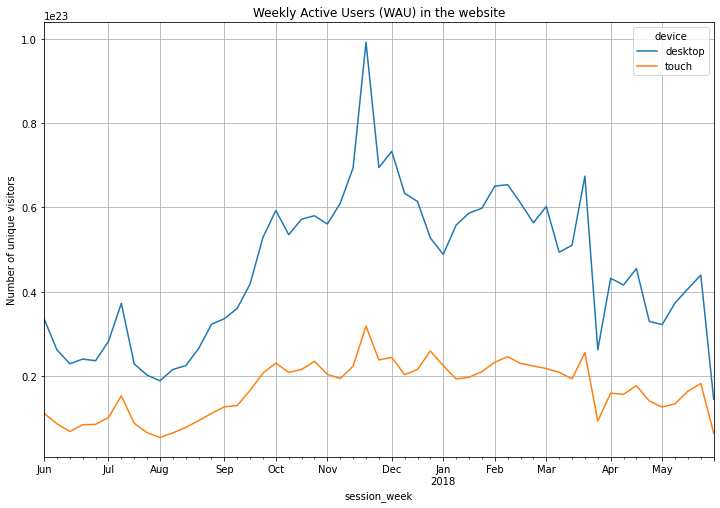

In [66]:
visits.pivot_table(index = 'session_week', columns = 'device', values = 'uid', aggfunc = 'sum').plot(grid = True, figsize = (12,8))
plt.title('Weekly Active Users (WAU) in the website')
plt.ylabel('Number of unique visitors')
plt.show()

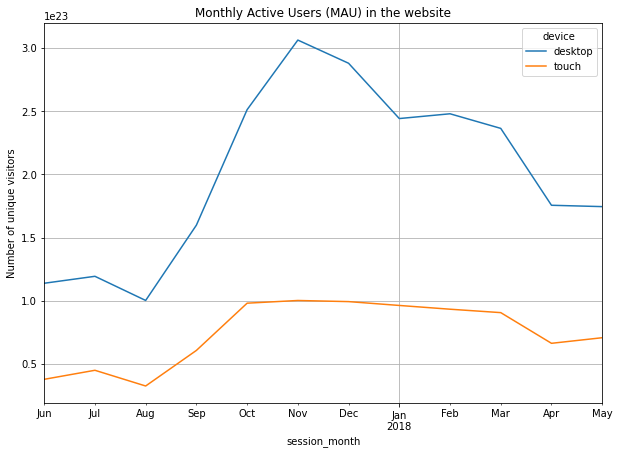

In [67]:
visits.pivot_table(index = 'session_month', columns = 'device', values = 'uid', aggfunc = 'sum').plot(grid = True, figsize = (10,7))
plt.title('Monthly Active Users (MAU) in the website')
plt.ylabel('Number of unique visitors')
plt.show()


In [68]:
dau_graph = visits.groupby(visits['session_date'])['uid'].nunique().reset_index()
fig = px.line(dau_graph, x = 'session_date', y = 'uid', title = 'Daily Active Users (DAU)')

fig.show()

In [69]:
daw_graph = visits.groupby(visits['session_week'])['uid'].nunique().reset_index()
fig = px.line(daw_graph, x = 'session_week', y = 'uid', title = 'Weekly Active Users (WAU)')
fig.show()

In [70]:
dam_graph = visits.groupby(visits['session_month'])['uid'].nunique().reset_index()
fig = px.line(dam_graph, x = 'session_month', y = 'uid', title = 'Monthly Active Users (MAU)')
fig.show()

###### Conclusion

Between November and December there were maximum number of visitors, may be because of the holidays like Thanks Giving and Christmas. Between June and August the number of visitors were few may be because of summer many people focus on tourism.

Visited were focusing more on desktops than on touches.

###### How many sessions are there per day? (One user might have more than one session.)

In [71]:
# To find the number of sessions per day
sessions_per_user = visits.groupby(['session_date']).agg({'uid':'count'})
print(sessions_per_user)

               uid
session_date      
2017-06-01     664
2017-06-02     658
2017-06-03     477
2017-06-04     510
2017-06-05     893
...            ...
2018-05-27     672
2018-05-28    1156
2018-05-29    1035
2018-05-30    1410
2018-05-31    2256

[364 rows x 1 columns]


In [72]:
sessions_per_user = visits.groupby('session_date').agg({'uid': ['count','nunique']})
sessions_per_user.columns = ['uid', 'number_users']
sessions_per_user['sessions_per_user'] = sessions_per_user['uid'] / sessions_per_user['number_users']
sessions_per_user.head()

,uid,number_users,sessions_per_user
session_date,,,
2017-06-01,664,605,1.097521
2017-06-02,658,608,1.082237
2017-06-03,477,445,1.071910
2017-06-04,510,476,1.071429
2017-06-05,893,820,1.089024


In [73]:
# The average sessions per day 
average_sessions_per_user = sessions_per_user.mean()
average_sessions_per_user

uid                  987.362637
number_users         907.991758
sessions_per_user      1.082170
dtype: float64

In [74]:
average_sessions_per_user['uid'] = int(average_sessions_per_user['uid'])
average_sessions_per_user['number_users'] = int(average_sessions_per_user['number_users'])
average_sessions_per_user['sessions_per_user'] = int(average_sessions_per_user['sessions_per_user'])
average_sessions_per_user

uid                  987.0
number_users         907.0
sessions_per_user      1.0
dtype: float64

The average sessions per day per user is 987.

In [75]:
sessions_per_user_week = visits.groupby('session_week').agg({'uid': ['count','nunique']})
sessions_per_user_week.columns = ['uid', 'number_users']
sessions_per_user_week['sessions_per_user_week'] = sessions_per_user['uid'] / sessions_per_user['number_users']
sessions_per_user_week.head()

,uid,number_users,sessions_per_user_week
session_week,,,
2017-06-01,4865,4082,1.097521
2017-06-08,3813,3311,1.081797
2017-06-15,3255,2844,1.059130
2017-06-22,3509,3079,1.057728
2017-06-29,3538,3055,1.080586


In [76]:
# The average sessions per week 
average_sessions_per_user_week = sessions_per_user_week.mean()
average_sessions_per_user_week

uid                       6781.132075
number_users              5724.415094
sessions_per_user_week       1.087315
dtype: float64

In [77]:
average_sessions_per_user_week['uid'] = int(average_sessions_per_user_week['uid'])
average_sessions_per_user_week['number_users'] = int(average_sessions_per_user_week['number_users'])
average_sessions_per_user_week['sessions_per_user_week'] = int(average_sessions_per_user_week['sessions_per_user_week'])
average_sessions_per_user_week

uid                       6781.0
number_users              5724.0
sessions_per_user_week       1.0
dtype: float64

In [78]:
sessions_per_user_month = visits.groupby('session_month').agg({'uid': ['count','nunique']})
sessions_per_user_month.columns = ['uid', 'number_users']
sessions_per_user_month['sessions_per_user_month'] = sessions_per_user['uid'] / sessions_per_user['number_users']
sessions_per_user_month.head()

,uid,number_users,sessions_per_user_month
session_month,,,
2017-06-01,16505,13259,1.097521
2017-07-01,17828,14183,1.083102
2017-08-01,14355,11631,1.068293
2017-09-01,23907,18975,1.089161
2017-10-01,37903,29692,1.055425


In [79]:
# The average sessions per month 
average_sessions_per_user_month = sessions_per_user_month.mean()
average_sessions_per_user_month

uid                        29950.000000
number_users               23228.416667
sessions_per_user_month        1.087386
dtype: float64

In [80]:
average_sessions_per_user_month['uid'] = int(average_sessions_per_user_month['uid'])
average_sessions_per_user_month['number_users'] = int(average_sessions_per_user_month['number_users'])
average_sessions_per_user_month['sessions_per_user_month'] = int(average_sessions_per_user_month['sessions_per_user_month'])
average_sessions_per_user_month

uid                        29950.0
number_users               23228.0
sessions_per_user_month        1.0
dtype: float64

###### Conclusion

    * The average sessions per day per user is 987.
    * The average number of visitors in Yandex.Afisha in a day was 907. Around Summer the number of vistors get lower, may be many people are focusing on tourism. Around November and December the Yandex.Afisha visitors go highest, may be these time full of holidays and people looking to shop for the holidays and for gifts.
    * The average sessions per week per user is 6781.
    * The average number of visitors in a week was 5724. The figure shows there are one time visitors only that is why the number gets less.
    * The average sessions per month per user is 29,950.
    * The average number of visitors in a month was 23,228. Totally, the number of visitors in a year is good amount, this shows there are new visitors every time. 

###### What is the length of each session?

In [81]:
# To find the length of each sessions
visits['session_duration_sec'] = (visits['end_ts'] - visits['start_ts']).dt.seconds
print(visits['session_duration_sec'].sample(10))

344367    4380
212849     240
329034      60
229562     180
58133       60
273233     120
108914     300
210324     120
15646       60
310536       0
Name: session_duration_sec, dtype: int64


In [82]:
# To find the length of each sessions
visits['session_duration_min'] = ((visits['end_ts'] - visits['start_ts']).dt.seconds)/60
print(visits['session_duration_min'].sample(10))

4996      17.0
241076    16.0
74464     37.0
11895      1.0
16579     12.0
161909     0.0
202831    18.0
133532    12.0
17368     24.0
210624    37.0
Name: session_duration_min, dtype: float64


In [83]:
# To find the statistical data
visits['session_duration_sec'].describe()

count    359400.000000
mean        643.506489
std        1016.334786
min           0.000000
25%         120.000000
50%         300.000000
75%         840.000000
max       84480.000000
Name: session_duration_sec, dtype: float64

In [84]:
visits['session_duration_min'].describe()

count    359400.000000
mean         10.725108
std          16.938913
min           0.000000
25%           2.000000
50%           5.000000
75%          14.000000
max        1408.000000
Name: session_duration_min, dtype: float64

In [85]:
# To find the average session length, we need to use the mode, rather than mean or median
# asl = average session length
asl = visits['session_duration_sec'].mode()
print(asl)

0    60
dtype: int64


In [86]:
# To find the average session length, we need to use the mode, rather than mean or median
# asl = average session length
asl = visits['session_duration_min'].mode()
print(asl)

0    1.0
dtype: float64


The session duration per second is from 0 to 84,480 which is from 0 to 1408 minutes, but the average session length (asl) is 60 seconds which is 1 minute.

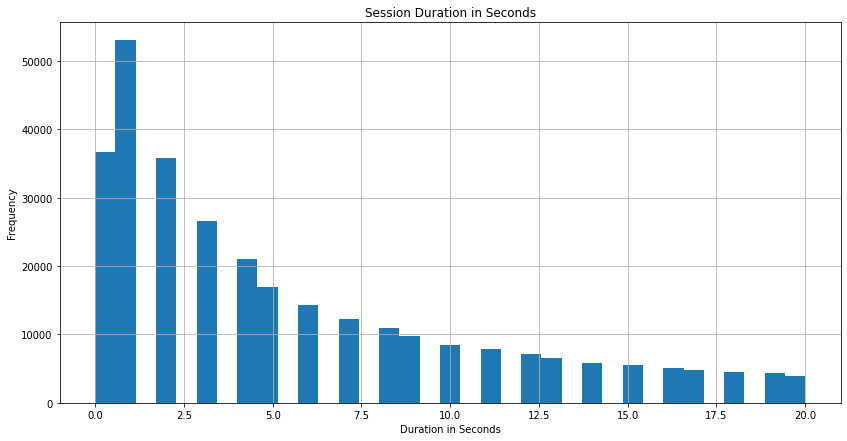

count    359400.000000
mean        643.506489
std        1016.334786
min           0.000000
25%         120.000000
50%         300.000000
75%         840.000000
max       84480.000000
Name: session_duration_sec, dtype: float64

In [87]:
visits['session_duration_min'].hist(bins= 35, range = (0, 20), figsize = (14,7))
plt.title('Session Duration in Seconds')
plt.xlabel('Duration in Seconds')
plt.ylabel('Frequency')
plt.show()
print('')
visits['session_duration_sec'].describe()

In [88]:
visits.describe()

,source_id,uid,session_duration_sec,session_duration_min
count,359400.000000,3.594000e+05,359400.000000,359400.000000
mean,3.750515,9.202557e+18,643.506489,10.725108
std,1.917116,5.298433e+18,1016.334786,16.938913
min,1.000000,1.186350e+13,0.000000,0.000000
25%,3.000000,4.613407e+18,120.000000,2.000000
50%,4.000000,9.227413e+18,300.000000,5.000000
75%,5.000000,1.372824e+19,840.000000,14.000000
max,10.000000,1.844668e+19,84480.000000,1408.000000


###### Conclusion

    * The session duration per second is from 0 to 84,480 which is from 0 to 1408 minutes, but the average session length (asl) is 60 seconds which is 1 minute.
    * The average session duration per second is 643.5.
    * The average session duration per minute is 10.7.
    * Since the session per second has abnormalities, I decided to take session per minute and the difference can be seen from the graphs.
    * The graphs skewed to the right direction, as the time increase the value falls down.

###### What's the user retention rate?

In [89]:
# Store data in the first activity date
first_activity_date = visits.groupby(['uid'])['start_ts'].min()
first_activity_date.name = 'first_activity_date'
visits = visits.join(first_activity_date, on = 'uid')
print(visits.head(10))

    device              end_ts  source_id            start_ts  \
0    touch 2017-12-20 17:38:00          4 2017-12-20 17:20:00   
1  desktop 2018-02-19 17:21:00          2 2018-02-19 16:53:00   
2    touch 2017-07-01 01:54:00          5 2017-07-01 01:54:00   
3  desktop 2018-05-20 11:23:00          9 2018-05-20 10:59:00   
4  desktop 2017-12-27 14:06:00          3 2017-12-27 14:06:00   
5  desktop 2017-09-03 21:36:00          5 2017-09-03 21:35:00   
6  desktop 2018-01-30 12:09:00          1 2018-01-30 11:13:00   
7    touch 2017-11-05 15:15:00          3 2017-11-05 15:14:00   
8  desktop 2017-07-19 10:44:00          3 2017-07-19 10:41:00   
9  desktop 2017-11-08 13:43:00          5 2017-11-08 13:42:00   

                    uid session_year session_month session_week session_date  \
0  16879256277535980062   2017-01-01    2017-12-01   2017-12-14   2017-12-20   
1    104060357244891740   2018-01-01    2018-02-01   2018-02-15   2018-02-19   
2   7459035603376831527   2017-01-01    2017

In [90]:
visits['first_activity_month'] = visits['first_activity_date'].astype('datetime64[M]')
visits['activity_month'] = visits['start_ts'].astype("datetime64[M]")
visits.head(10)

,device,end_ts,source_id,start_ts,uid,session_year,session_month,session_week,session_date,session_duration_sec,session_duration_min,first_activity_date,first_activity_month,activity_month
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017-01-01,2017-12-01,2017-12-14,2017-12-20,1080,18.0,2017-12-20 17:20:00,2017-12-01,2017-12-01
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018-01-01,2018-02-01,2018-02-15,2018-02-19,1680,28.0,2018-02-19 16:53:00,2018-02-01,2018-02-01
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017-01-01,2017-07-01,2017-06-29,2017-07-01,0,0.0,2017-07-01 01:54:00,2017-07-01,2017-07-01
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-01-01,2018-05-01,2018-05-17,2018-05-20,1440,24.0,2018-03-09 20:05:00,2018-03-01,2018-05-01
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017-01-01,2017-12-01,2017-12-21,2017-12-27,0,0.0,2017-12-27 14:06:00,2017-12-01,2017-12-01
5,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,2017-01-01,2017-09-01,2017-08-31,2017-09-03,60,1.0,2017-09-03 21:35:00,2017-09-01,2017-09-01
6,desktop,2018-01-30 12:09:00,1,2018-01-30 11:13:00,6661610529277171451,2018-01-01,2018-01-01,2018-01-25,2018-01-30,3360,56.0,2017-06-29 09:00:00,2017-06-01,2018-01-01
7,touch,2017-11-05 15:15:00,3,2017-11-05 15:14:00,11423865690854540312,2017-01-01,2017-11-01,2017-11-02,2017-11-05,60,1.0,2017-11-05 15:14:00,2017-11-01,2017-11-01
8,desktop,2017-07-19 10:44:00,3,2017-07-19 10:41:00,2987360259350925644,2017-01-01,2017-07-01,2017-07-13,2017-07-19,180,3.0,2017-07-19 10:41:00,2017-07-01,2017-07-01
9,desktop,2017-11-08 13:43:00,5,2017-11-08 13:42:00,1289240080042562063,2017-01-01,2017-11-01,2017-11-02,2017-11-08,60,1.0,2017-11-08 13:42:00,2017-11-01,2017-11-01


In [91]:
visits['activity_month'].head(10)

0   2017-12-01
1   2018-02-01
2   2017-07-01
3   2018-05-01
4   2017-12-01
5   2017-09-01
6   2018-01-01
7   2017-11-01
8   2017-07-01
9   2017-11-01
Name: activity_month, dtype: datetime64[ns]

In [92]:
# # Calculate user lifetime within the cohort for each row of the DataFrame.
visits['cohort_lifetime'] = ( visits['activity_month'] - visits['first_activity_month'] ) 
visits['cohort_lifetime'] = (visits[ 'cohort_lifetime' ] / np.timedelta64(1, 'M')).round().astype(int)
visits.head()

,device,end_ts,source_id,start_ts,uid,session_year,session_month,session_week,session_date,session_duration_sec,session_duration_min,first_activity_date,first_activity_month,activity_month,cohort_lifetime
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017-01-01,2017-12-01,2017-12-14,2017-12-20,1080,18.0,2017-12-20 17:20:00,2017-12-01,2017-12-01,0
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018-01-01,2018-02-01,2018-02-15,2018-02-19,1680,28.0,2018-02-19 16:53:00,2018-02-01,2018-02-01,0
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017-01-01,2017-07-01,2017-06-29,2017-07-01,0,0.0,2017-07-01 01:54:00,2017-07-01,2017-07-01,0
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-01-01,2018-05-01,2018-05-17,2018-05-20,1440,24.0,2018-03-09 20:05:00,2018-03-01,2018-05-01,2
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017-01-01,2017-12-01,2017-12-21,2017-12-27,0,0.0,2017-12-27 14:06:00,2017-12-01,2017-12-01,0


In [93]:
# # Group the data by cohort and lifetime and find the number of active users at a certain lifetime week for each cohor
cohorts = visits.groupby(['first_activity_month','cohort_lifetime']).agg({'uid':'nunique'}).reset_index()
cohorts.head(10)

,first_activity_month,cohort_lifetime,uid
0,2017-06-01,0,13259
1,2017-06-01,1,1043
2,2017-06-01,2,713
3,2017-06-01,3,814
4,2017-06-01,4,909
5,2017-06-01,5,947
6,2017-06-01,6,809
7,2017-06-01,7,766
8,2017-06-01,8,694
9,2017-06-01,9,674


In [94]:
# To find the initial number of users in the cohort by looking at the 0th week.
initial_users_count = cohorts[cohorts['cohort_lifetime'] == 0][['first_activity_month','uid']]
initial_users_count.head(10)

,first_activity_month,uid
0,2017-06-01,13259
12,2017-07-01,13140
23,2017-08-01,10181
33,2017-09-01,16704
42,2017-10-01,25977
50,2017-11-01,27248
57,2017-12-01,25268
63,2018-01-01,22624
68,2018-02-01,22197
72,2018-03-01,20589


In [95]:
# To rename the uid column as cohort_users
initial_users_count = initial_users_count.rename(columns={'uid':'cohort_users'})
initial_users_count.head(10)

,first_activity_month,cohort_users
0,2017-06-01,13259
12,2017-07-01,13140
23,2017-08-01,10181
33,2017-09-01,16704
42,2017-10-01,25977
50,2017-11-01,27248
57,2017-12-01,25268
63,2018-01-01,22624
68,2018-02-01,22197
72,2018-03-01,20589


In [96]:
# Join the data on cohorts with the initial number of users in the cohort
cohorts = cohorts.merge(initial_users_count,on=['first_activity_month'])
cohorts.head(10)

,first_activity_month,cohort_lifetime,uid,cohort_users
0,2017-06-01,0,13259,13259
1,2017-06-01,1,1043,13259
2,2017-06-01,2,713,13259
3,2017-06-01,3,814,13259
4,2017-06-01,4,909,13259
5,2017-06-01,5,947,13259
6,2017-06-01,6,809,13259
7,2017-06-01,7,766,13259
8,2017-06-01,8,694,13259
9,2017-06-01,9,674,13259


In [97]:
# To calculate the retention rate, divide the number of active users in each week by the initial number of u
cohorts['retention'] = cohorts['uid']/cohorts['cohort_users']

In [98]:
# To compile a pivot table
retention_pivot = cohorts.pivot_table(
            index='first_activity_month',
            columns='cohort_lifetime',
            values='retention',
            aggfunc='sum')
retention_pivot

cohort_lifetime,0,1,2,3,4,5,6,7,8,9,10,11
first_activity_month,,,,,,,,,,,,
2017-06-01,1.0,0.078664,0.053775,0.061392,0.068557,0.071423,0.061015,0.057772,0.052342,0.050833,0.040652,0.044951
2017-07-01,1.0,0.056088,0.051294,0.056164,0.058219,0.048174,0.045358,0.045738,0.038813,0.028615,0.027473,NaN
2017-08-01,1.0,0.076908,0.062862,0.062764,0.050093,0.044004,0.036342,0.039485,0.027895,0.026029,NaN,NaN
2017-09-01,1.0,0.085489,0.069205,0.050706,0.039392,0.037835,0.035860,0.024186,0.022809,NaN,NaN,NaN
2017-10-01,1.0,0.078608,0.052239,0.038958,0.034261,0.032221,0.021365,0.020364,NaN,NaN,NaN,NaN
2017-11-01,1.0,0.078281,0.044113,0.038682,0.033727,0.023415,0.021800,NaN,NaN,NaN,NaN,NaN
2017-12-01,1.0,0.055802,0.037993,0.031107,0.020263,0.019036,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-01,1.0,0.059715,0.039339,0.024973,0.020244,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-02-01,1.0,0.057080,0.025454,0.020093,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [99]:
print(retention_pivot.head(10))

cohort_lifetime        0         1         2         3         4         5   \
first_activity_month                                                          
2017-06-01            1.0  0.078664  0.053775  0.061392  0.068557  0.071423   
2017-07-01            1.0  0.056088  0.051294  0.056164  0.058219  0.048174   
2017-08-01            1.0  0.076908  0.062862  0.062764  0.050093  0.044004   
2017-09-01            1.0  0.085489  0.069205  0.050706  0.039392  0.037835   
2017-10-01            1.0  0.078608  0.052239  0.038958  0.034261  0.032221   
2017-11-01            1.0  0.078281  0.044113  0.038682  0.033727  0.023415   
2017-12-01            1.0  0.055802  0.037993  0.031107  0.020263  0.019036   
2018-01-01            1.0  0.059715  0.039339  0.024973  0.020244       NaN   
2018-02-01            1.0  0.057080  0.025454  0.020093       NaN       NaN   
2018-03-01            1.0  0.041818  0.027053       NaN       NaN       NaN   

cohort_lifetime             6         7         8  

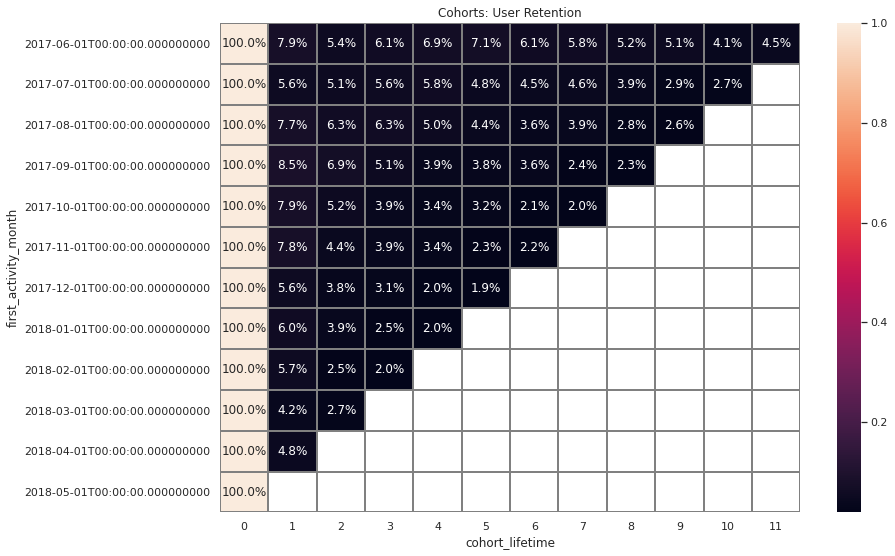

In [100]:
sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('Cohorts: User Retention')
sns.heatmap(retention_pivot, annot=True, fmt='.1%', linewidths=1, linecolor='gray')
plt.show()

* The cohort has None visitors after their first vsit on May 2018.
* On April 2018 the cohort back after one month.
* The highest cohort is on June 2017. It goes upto month 11.

###### Sales

    * When do people start buying? (In KPI analysis, we're usually interested in knowing the time that elapses between registration and conversion — when the user becomes a customer. For example, if registration and the first purchase occur on the same day, the user might fall into category Conversion 0d. If the first purchase happens the next day, it will be Conversion 1d. You can use any approach that lets you compare the conversions of different cohorts, so that you can determine which cohort, or marketing channel, is most effective.)
    
    * How many orders do they make during a given period of time?
    
    * What is the average purchase size?
    
    * How much money do they bring? (LTV)

######  When do people start buying?

In [101]:
# Looking at the data
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   buy_ts   50415 non-null  datetime64[ns]
 1   revenue  50415 non-null  float64       
 2   uid      50415 non-null  uint64        
dtypes: datetime64[ns](1), float64(1), uint64(1)
memory usage: 1.2 MB


In [102]:
# To examine the distribution of order dates.
orders['buy_ts'].describe() 

count                   50415
unique                  45991
top       2018-05-31 10:13:00
freq                        9
first     2017-06-01 00:10:00
last      2018-06-01 00:02:00
Name: buy_ts, dtype: object

The first purchase was made on June 1, 2017, and the last one on June 1, 2018. 

In [103]:
# To capture the months from the dates in the tables of orders
orders['order_month'] = orders['buy_ts'].astype('datetime64[M]')

In [104]:
first_orders = orders.groupby('uid').agg({'buy_ts': 'min'}).reset_index()
first_orders.columns = ['uid', 'first_order_month']
first_orders.head() 


,uid,first_order_month
0,313578113262317,2018-01-03 21:51:00
1,1575281904278712,2017-06-03 10:13:00
2,2429014661409475,2017-10-11 18:33:00
3,2464366381792757,2018-01-28 15:54:00
4,2551852515556206,2017-11-24 10:14:00


In [105]:
# To calculate the number of new customers (n_buyers) for each month
cohort_sizes = first_orders.groupby('first_order_month').agg({'uid': 'nunique'}).reset_index()
cohort_sizes.columns = ['first_order_month', 'n_buyers']
cohort_sizes.head() 

,first_order_month,n_buyers
0,2017-06-01 00:10:00,1
1,2017-06-01 00:25:00,1
2,2017-06-01 00:27:00,1
3,2017-06-01 00:29:00,1
4,2017-06-01 07:58:00,1


In [106]:
# To add customers' first-purchase months to the table of orders
orders_ = pd.merge(orders,first_orders, on='uid')
orders_.head(10) 

,buy_ts,revenue,uid,order_month,first_order_month
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01,2017-06-01 00:10:00
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01,2017-06-01 00:25:00
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01,2017-06-01 00:27:00
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01,2017-06-01 00:29:00
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01,2017-06-01 07:58:00
5,2017-06-01 08:43:00,0.18,10402394430196413321,2017-06-01,2017-06-01 08:43:00
6,2017-06-01 08:54:00,1.83,12464626743129688638,2017-06-01,2017-06-01 08:54:00
7,2017-06-05 14:30:00,7.33,12464626743129688638,2017-06-01,2017-06-01 08:54:00
8,2017-06-01 09:22:00,1.22,3644482766749211722,2017-06-01,2017-06-01 09:22:00
9,2017-06-02 12:44:00,0.85,3644482766749211722,2017-06-01,2017-06-01 09:22:00


In [107]:
# Merging visits and orders DataFrames 
visits_orders_merge = visits.merge(orders_, on='uid')
visits_orders_merge.head()

,device,end_ts,source_id,start_ts,uid,session_year,session_month,session_week,session_date,session_duration_sec,session_duration_min,first_activity_date,first_activity_month,activity_month,cohort_lifetime,buy_ts,revenue,order_month,first_order_month
0,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-01-01,2018-05-01,2018-05-17,2018-05-20,1440,24.0,2018-03-09 20:05:00,2018-03-01,2018-05-01,2,2018-03-09 20:25:00,2.33,2018-03-01,2018-03-09 20:25:00
1,desktop,2018-03-09 20:33:00,4,2018-03-09 20:05:00,16174680259334210214,2018-01-01,2018-03-01,2018-03-08,2018-03-09,1680,28.0,2018-03-09 20:05:00,2018-03-01,2018-03-01,0,2018-03-09 20:25:00,2.33,2018-03-01,2018-03-09 20:25:00
2,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,2017-01-01,2017-09-01,2017-08-31,2017-09-03,60,1.0,2017-09-03 21:35:00,2017-09-01,2017-09-01,0,2017-09-04 12:46:00,2.44,2017-09-01,2017-09-04 12:46:00
3,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,2017-01-01,2017-09-01,2017-08-31,2017-09-03,60,1.0,2017-09-03 21:35:00,2017-09-01,2017-09-01,0,2017-10-28 00:01:00,1.53,2017-10-01,2017-09-04 12:46:00
4,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,2017-01-01,2017-09-01,2017-08-31,2017-09-03,60,1.0,2017-09-03 21:35:00,2017-09-01,2017-09-01,0,2017-10-28 19:16:00,1.53,2017-10-01,2017-09-04 12:46:00


In [108]:
# To get the time elapsed between first visiting and first ordering
visits_orders_merge['ordering_time'] = visits_orders_merge['first_order_month'] - visits_orders_merge['first_activity_date']
visits_orders_merge.head()


,device,end_ts,source_id,start_ts,uid,session_year,session_month,session_week,session_date,session_duration_sec,session_duration_min,first_activity_date,first_activity_month,activity_month,cohort_lifetime,buy_ts,revenue,order_month,first_order_month,ordering_time
0,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-01-01,2018-05-01,2018-05-17,2018-05-20,1440,24.0,2018-03-09 20:05:00,2018-03-01,2018-05-01,2,2018-03-09 20:25:00,2.33,2018-03-01,2018-03-09 20:25:00,0 days 00:20:00
1,desktop,2018-03-09 20:33:00,4,2018-03-09 20:05:00,16174680259334210214,2018-01-01,2018-03-01,2018-03-08,2018-03-09,1680,28.0,2018-03-09 20:05:00,2018-03-01,2018-03-01,0,2018-03-09 20:25:00,2.33,2018-03-01,2018-03-09 20:25:00,0 days 00:20:00
2,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,2017-01-01,2017-09-01,2017-08-31,2017-09-03,60,1.0,2017-09-03 21:35:00,2017-09-01,2017-09-01,0,2017-09-04 12:46:00,2.44,2017-09-01,2017-09-04 12:46:00,0 days 15:11:00
3,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,2017-01-01,2017-09-01,2017-08-31,2017-09-03,60,1.0,2017-09-03 21:35:00,2017-09-01,2017-09-01,0,2017-10-28 00:01:00,1.53,2017-10-01,2017-09-04 12:46:00,0 days 15:11:00
4,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,2017-01-01,2017-09-01,2017-08-31,2017-09-03,60,1.0,2017-09-03 21:35:00,2017-09-01,2017-09-01,0,2017-10-28 19:16:00,1.53,2017-10-01,2017-09-04 12:46:00,0 days 15:11:00


In [109]:
# Statistical information of the data frame
visits_orders_merge['ordering_time'].describe()


count                        761807
mean     17 days 15:37:02.129909544
std      42 days 08:51:00.569695410
min                 0 days 00:00:00
25%                 0 days 00:17:00
50%                 1 days 23:49:00
75%                 8 days 21:07:00
max               363 days 07:04:00
Name: ordering_time, dtype: object

In [110]:
visits_orders_merge['ordering_time_second'] = visits_orders_merge['ordering_time'].dt.total_seconds()

In [111]:
visits_orders_merge.head(10)

,device,end_ts,source_id,start_ts,uid,session_year,session_month,session_week,session_date,session_duration_sec,...,first_activity_date,first_activity_month,activity_month,cohort_lifetime,buy_ts,revenue,order_month,first_order_month,ordering_time,ordering_time_second
0,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-01-01,2018-05-01,2018-05-17,2018-05-20,1440,...,2018-03-09 20:05:00,2018-03-01,2018-05-01,2,2018-03-09 20:25:00,2.33,2018-03-01,2018-03-09 20:25:00,0 days 00:20:00,1200.0
1,desktop,2018-03-09 20:33:00,4,2018-03-09 20:05:00,16174680259334210214,2018-01-01,2018-03-01,2018-03-08,2018-03-09,1680,...,2018-03-09 20:05:00,2018-03-01,2018-03-01,0,2018-03-09 20:25:00,2.33,2018-03-01,2018-03-09 20:25:00,0 days 00:20:00,1200.0
2,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,2017-01-01,2017-09-01,2017-08-31,2017-09-03,60,...,2017-09-03 21:35:00,2017-09-01,2017-09-01,0,2017-09-04 12:46:00,2.44,2017-09-01,2017-09-04 12:46:00,0 days 15:11:00,54660.0
3,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,2017-01-01,2017-09-01,2017-08-31,2017-09-03,60,...,2017-09-03 21:35:00,2017-09-01,2017-09-01,0,2017-10-28 00:01:00,1.53,2017-10-01,2017-09-04 12:46:00,0 days 15:11:00,54660.0
4,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,2017-01-01,2017-09-01,2017-08-31,2017-09-03,60,...,2017-09-03 21:35:00,2017-09-01,2017-09-01,0,2017-10-28 19:16:00,1.53,2017-10-01,2017-09-04 12:46:00,0 days 15:11:00,54660.0
5,desktop,2017-10-27 16:02:00,3,2017-10-27 15:20:00,16007536194108375387,2017-01-01,2017-10-01,2017-10-26,2017-10-27,2520,...,2017-09-03 21:35:00,2017-09-01,2017-10-01,1,2017-09-04 12:46:00,2.44,2017-09-01,2017-09-04 12:46:00,0 days 15:11:00,54660.0
6,desktop,2017-10-27 16:02:00,3,2017-10-27 15:20:00,16007536194108375387,2017-01-01,2017-10-01,2017-10-26,2017-10-27,2520,...,2017-09-03 21:35:00,2017-09-01,2017-10-01,1,2017-10-28 00:01:00,1.53,2017-10-01,2017-09-04 12:46:00,0 days 15:11:00,54660.0
7,desktop,2017-10-27 16:02:00,3,2017-10-27 15:20:00,16007536194108375387,2017-01-01,2017-10-01,2017-10-26,2017-10-27,2520,...,2017-09-03 21:35:00,2017-09-01,2017-10-01,1,2017-10-28 19:16:00,1.53,2017-10-01,2017-09-04 12:46:00,0 days 15:11:00,54660.0
8,desktop,2017-09-04 17:56:00,4,2017-09-04 17:37:00,16007536194108375387,2017-01-01,2017-09-01,2017-08-31,2017-09-04,1140,...,2017-09-03 21:35:00,2017-09-01,2017-09-01,0,2017-09-04 12:46:00,2.44,2017-09-01,2017-09-04 12:46:00,0 days 15:11:00,54660.0
9,desktop,2017-09-04 17:56:00,4,2017-09-04 17:37:00,16007536194108375387,2017-01-01,2017-09-01,2017-08-31,2017-09-04,1140,...,2017-09-03 21:35:00,2017-09-01,2017-09-01,0,2017-10-28 00:01:00,1.53,2017-10-01,2017-09-04 12:46:00,0 days 15:11:00,54660.0


In [112]:
visits_orders_merge['ordering_time_second'].describe()

count    7.618070e+05
mean     1.525022e+06
std      3.660661e+06
min      0.000000e+00
25%      1.020000e+03
50%      1.721400e+05
75%      7.672200e+05
max      3.138864e+07
Name: ordering_time_second, dtype: float64

In [113]:
visits_orders_merge['cohort_lifetime'].describe()

count    761807.000000
mean          4.233515
std           3.208069
min           0.000000
25%           1.000000
50%           4.000000
75%           7.000000
max          11.000000
Name: cohort_lifetime, dtype: float64

In [114]:
(visits_orders_merge['ordering_time_second']==0).mean()

0.11824648500210683

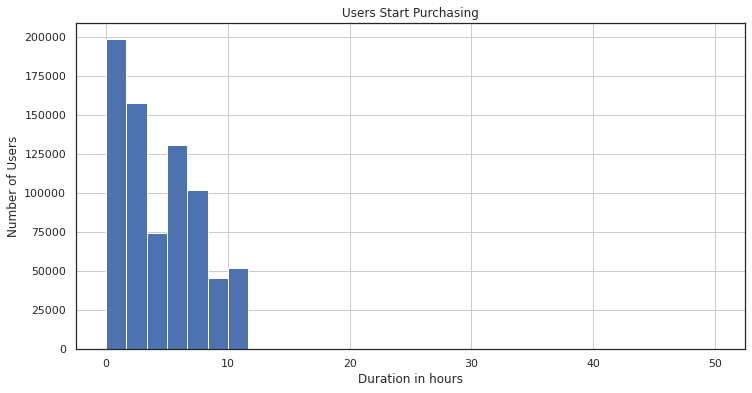

In [115]:
visits_orders_merge['cohort_lifetime'].hist(bins=30, range = (0, 50), figsize = (12,6))
plt.title('Users Start Purchasing')
plt.xlabel('Duration in hours')
plt.ylabel('Number of Users')
plt.show()

###### Conclusion

    * The ordering time ranges from 0 to 363 days.
    * The average ordering time is 17 days.
    * At zero day the ordering time was 0.118 hour
    * The minimum cohort lifrtime is 0.
    * The maximum cohort lifrtime is 18.
    * The average cohort lifrtime is 52.
    * The graph skewed to the right.
    
    


###### How many orders do they make during a given period of time?

In [116]:
# To calculate daily, weekly and monthly order activities, we'll first create separate columns for year, month, week and day values.

orders['order_year']  = orders['buy_ts'].astype('datetime64[Y]')
orders['order_month'] = orders['buy_ts'].astype('datetime64[M]')
orders['order_week']  = orders['buy_ts'].astype('datetime64[D]')
orders['order_date'] = orders['buy_ts'].astype('datetime64[D]')
orders.sample(10)


,buy_ts,revenue,uid,order_month,order_year,order_week,order_date
48125,2018-05-20 15:30:00,3.05,5997787213861987718,2018-05-01,2018-01-01,2018-05-20,2018-05-20
26545,2017-12-27 21:43:00,1.22,12334801802595037997,2017-12-01,2017-01-01,2017-12-27,2017-12-27
30805,2018-01-24 13:37:00,3.67,11266413307209991218,2018-01-01,2018-01-01,2018-01-24,2018-01-24
48026,2018-05-19 15:46:00,0.37,11403955090248468161,2018-05-01,2018-01-01,2018-05-19,2018-05-19
517,2017-06-06 08:50:00,1.53,6062757441245044157,2017-06-01,2017-01-01,2017-06-06,2017-06-06
47361,2018-05-15 17:22:00,7.33,4633685633558698733,2018-05-01,2018-01-01,2018-05-15,2018-05-15
13896,2017-10-21 14:30:00,0.98,1791654805185770845,2017-10-01,2017-01-01,2017-10-21,2017-10-21
6855,2017-09-05 09:22:00,2.93,11371846661300230134,2017-09-01,2017-01-01,2017-09-05,2017-09-05
6747,2017-09-03 20:25:00,4.28,15059085660282520922,2017-09-01,2017-01-01,2017-09-03,2017-09-03
26472,2017-12-27 15:49:00,8.33,1056247910853326627,2017-12-01,2017-01-01,2017-12-27,2017-12-27


In [117]:
# Order made by year
orders_per_year = orders.groupby(by = ['order_year'])['uid'].count()
orders_per_year

order_year
2017-01-01    27467
2018-01-01    22948
Name: uid, dtype: int64

In [118]:
# Order made by month
orders_per_month = orders.groupby(by = ['order_year', 'order_month'])['uid'].count()
orders_per_month.head(15)

order_year  order_month
2017-01-01  2017-06-01     2354
            2017-07-01     2363
            2017-08-01     1807
            2017-09-01     3387
            2017-10-01     5679
            2017-11-01     5659
            2017-12-01     6218
2018-01-01  2018-01-01     4721
            2018-02-01     5281
            2018-03-01     5326
            2018-04-01     3273
            2018-05-01     4346
            2018-06-01        1
Name: uid, dtype: int64

In [119]:
# Order made by week
orders_per_week = orders.groupby(by = ['order_year', 'order_month', 'order_week'])['uid'].count()
orders_per_week

order_year  order_month  order_week
2017-01-01  2017-06-01   2017-06-01     96
                         2017-06-02    111
                         2017-06-03     67
                         2017-06-04     66
                         2017-06-05    161
                                      ... 
2018-01-01  2018-05-01   2018-05-28    188
                         2018-05-29    189
                         2018-05-30    208
                         2018-05-31    610
            2018-06-01   2018-06-01      1
Name: uid, Length: 364, dtype: int64

In [120]:
# Order made by day
orders_per_day = orders.groupby(by = ['order_year', 'order_month', 'order_week', 'order_date'])['uid'].count()
orders_per_day

order_year  order_month  order_week  order_date
2017-01-01  2017-06-01   2017-06-01  2017-06-01     96
                         2017-06-02  2017-06-02    111
                         2017-06-03  2017-06-03     67
                         2017-06-04  2017-06-04     66
                         2017-06-05  2017-06-05    161
                                                  ... 
2018-01-01  2018-05-01   2018-05-28  2018-05-28    188
                         2018-05-29  2018-05-29    189
                         2018-05-30  2018-05-30    208
                         2018-05-31  2018-05-31    610
            2018-06-01   2018-06-01  2018-06-01      1
Name: uid, Length: 364, dtype: int64

In [121]:
# Order made by day
orders_per_day = orders.groupby(by = ['order_date'])['uid'].count()
orders_per_day

order_date
2017-06-01     96
2017-06-02    111
2017-06-03     67
2017-06-04     66
2017-06-05    161
             ... 
2018-05-28    188
2018-05-29    189
2018-05-30    208
2018-05-31    610
2018-06-01      1
Name: uid, Length: 364, dtype: int64

In [122]:
orders_per_day.describe()

count    364.000000
mean     138.502747
std       76.858480
min        1.000000
25%       82.750000
50%      136.000000
75%      177.000000
max      814.000000
Name: uid, dtype: float64

In [123]:
orders_per_year.describe()

count        2.000000
mean     25207.500000
std       3195.415544
min      22948.000000
25%      24077.750000
50%      25207.500000
75%      26337.250000
max      27467.000000
Name: uid, dtype: float64

In [124]:
orders_per_month.describe()

count      13.000000
mean     3878.076923
std      1858.113401
min         1.000000
25%      2363.000000
50%      4346.000000
75%      5326.000000
max      6218.000000
Name: uid, dtype: float64

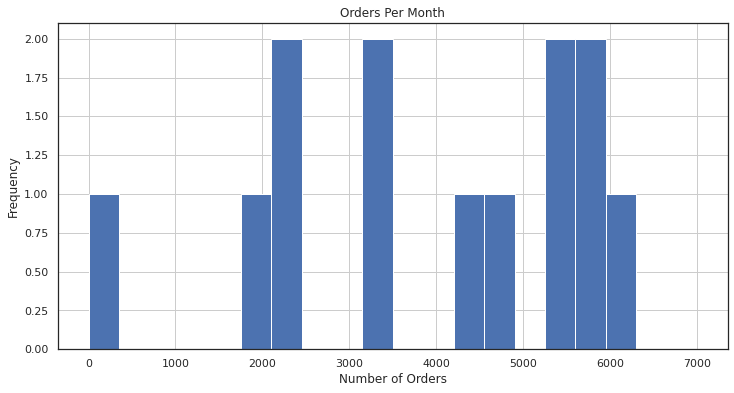

In [125]:
orders_per_month.hist(bins = 20, range = (0, 7000), figsize = (12,6))
plt.title('Orders Per Month')
plt.xlabel('Number of Orders')
plt.ylabel('Frequency')
plt.show()

In [126]:
orders_per_week.describe()

count    364.000000
mean     138.502747
std       76.858480
min        1.000000
25%       82.750000
50%      136.000000
75%      177.000000
max      814.000000
Name: uid, dtype: float64

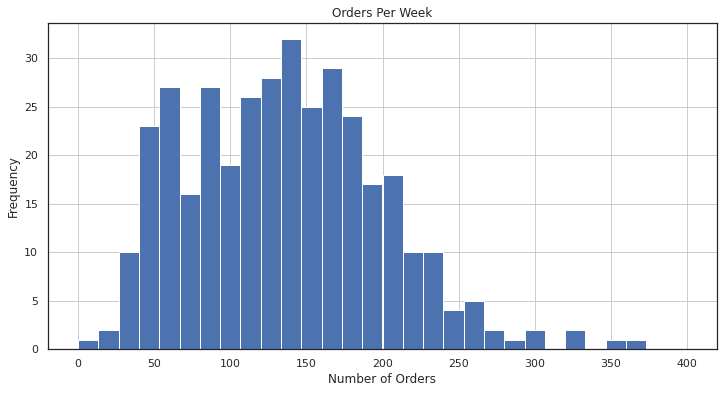

In [127]:
# Orders per week
orders_per_week.hist(bins = 30, range = (0, 400), figsize = (12,6))
plt.title('Orders Per Week')
plt.xlabel('Number of Orders')
plt.ylabel('Frequency')
plt.show()

In [128]:
orders_per_day.describe()

count    364.000000
mean     138.502747
std       76.858480
min        1.000000
25%       82.750000
50%      136.000000
75%      177.000000
max      814.000000
Name: uid, dtype: float64

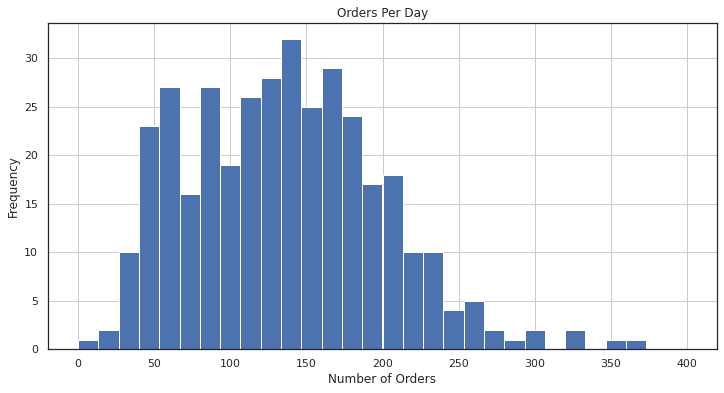

In [129]:
# Orders per day
orders_per_day.hist(bins = 30, range = (0, 400), figsize = (12,6))
plt.title('Orders Per Day')
plt.xlabel('Number of Orders')
plt.ylabel('Frequency')
plt.show()

In [130]:
# The information about orders DataFrame
orders.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   buy_ts       50415 non-null  datetime64[ns]
 1   revenue      50415 non-null  float64       
 2   uid          50415 non-null  uint64        
 3   order_month  50415 non-null  datetime64[ns]
 4   order_year   50415 non-null  datetime64[ns]
 5   order_week   50415 non-null  datetime64[ns]
 6   order_date   50415 non-null  datetime64[ns]
dtypes: datetime64[ns](5), float64(1), uint64(1)
memory usage: 2.7 MB


In [131]:
# Sample data of the DataFrame
orders.head(10)

,buy_ts,revenue,uid,order_month,order_year,order_week,order_date
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01,2017-01-01,2017-06-01,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01,2017-01-01,2017-06-01,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01,2017-01-01,2017-06-01,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01,2017-01-01,2017-06-01,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01,2017-01-01,2017-06-01,2017-06-01
5,2017-06-01 08:43:00,0.18,10402394430196413321,2017-06-01,2017-01-01,2017-06-01,2017-06-01
6,2017-06-01 08:54:00,1.83,12464626743129688638,2017-06-01,2017-01-01,2017-06-01,2017-06-01
7,2017-06-01 09:22:00,1.22,3644482766749211722,2017-06-01,2017-01-01,2017-06-01,2017-06-01
8,2017-06-01 09:22:00,3.30,17542070709969841479,2017-06-01,2017-01-01,2017-06-01,2017-06-01
9,2017-06-01 09:23:00,0.37,1074355127080856382,2017-06-01,2017-01-01,2017-06-01,2017-06-01


In [132]:
# To examine the distribution of order dates
orders['buy_ts'].describe()

count                   50415
unique                  45991
top       2018-05-31 10:13:00
freq                        9
first     2017-06-01 00:10:00
last      2018-06-01 00:02:00
Name: buy_ts, dtype: object

In [133]:
# To make monthly cohorts
orders['order_month'] = orders['buy_ts'].astype('datetime64[M]')
orders.head(10)


,buy_ts,revenue,uid,order_month,order_year,order_week,order_date
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01,2017-01-01,2017-06-01,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01,2017-01-01,2017-06-01,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01,2017-01-01,2017-06-01,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01,2017-01-01,2017-06-01,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01,2017-01-01,2017-06-01,2017-06-01
5,2017-06-01 08:43:00,0.18,10402394430196413321,2017-06-01,2017-01-01,2017-06-01,2017-06-01
6,2017-06-01 08:54:00,1.83,12464626743129688638,2017-06-01,2017-01-01,2017-06-01,2017-06-01
7,2017-06-01 09:22:00,1.22,3644482766749211722,2017-06-01,2017-01-01,2017-06-01,2017-06-01
8,2017-06-01 09:22:00,3.30,17542070709969841479,2017-06-01,2017-01-01,2017-06-01,2017-06-01
9,2017-06-01 09:23:00,0.37,1074355127080856382,2017-06-01,2017-01-01,2017-06-01,2017-06-01


In [134]:
# To retrieve the month of each customer's first purchase
first_orders = orders.groupby('uid').agg({'order_month': 'min'}).reset_index()
first_orders.columns = ['uid', 'first_order_month']
first_orders.sample(10) 

,uid,first_order_month
19898,10054137217567409130,2017-09-01
7452,3770154602523079532,2017-11-01
6746,3416488149675947012,2017-11-01
27254,13765924657838424957,2018-03-01
35463,17899077652925005086,2017-11-01
27345,13814197265633596413,2017-09-01
18216,9226362944924270642,2018-05-01
24866,12564832763133018922,2018-04-01
33370,16843178989506685995,2018-05-01
8179,4129150002499067964,2018-04-01


In [135]:
orders['order_month_activity'] = orders['order_date'].astype('datetime64[M]')

In [136]:
orders.head(10)

,buy_ts,revenue,uid,order_month,order_year,order_week,order_date,order_month_activity
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
5,2017-06-01 08:43:00,0.18,10402394430196413321,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
6,2017-06-01 08:54:00,1.83,12464626743129688638,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
7,2017-06-01 09:22:00,1.22,3644482766749211722,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
8,2017-06-01 09:22:00,3.30,17542070709969841479,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
9,2017-06-01 09:23:00,0.37,1074355127080856382,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01


In [137]:
# To calculate the number of new customers (n_buyers) for each month
cohort_sizes = first_orders.groupby('first_order_month').agg({'uid': 'nunique'}).reset_index()
cohort_sizes.columns = ['first_order_month', 'uid']
cohort_sizes.head() 

,first_order_month,uid
0,2017-06-01,2023
1,2017-07-01,1923
2,2017-08-01,1370
3,2017-09-01,2581
4,2017-10-01,4340


In [138]:
# Build cohorts and add customers' first-purchase months to the table of orders
orders_ = pd.merge(orders,first_orders, on='uid')
orders_.head(10) 

,buy_ts,revenue,uid,order_month,order_year,order_week,order_date,order_month_activity,first_order_month
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
5,2017-06-01 08:43:00,0.18,10402394430196413321,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
6,2017-06-01 08:54:00,1.83,12464626743129688638,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
7,2017-06-05 14:30:00,7.33,12464626743129688638,2017-06-01,2017-01-01,2017-06-05,2017-06-05,2017-06-01,2017-06-01
8,2017-06-01 09:22:00,1.22,3644482766749211722,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
9,2017-06-02 12:44:00,0.85,3644482766749211722,2017-06-01,2017-01-01,2017-06-02,2017-06-02,2017-06-01,2017-06-01


In [139]:
orders_['order_life_time'] = orders_['order_month_activity'] - orders_['first_order_month'] 
orders_['order_life_time'] = orders_['order_life_time'] / np.timedelta64(1, 'm')
orders_['order_life_time'] = orders_['order_life_time'].round().astype('int')
orders_['order_life_time'].sample(10)

4740          0
46035         0
20815         0
1287      87840
2341          0
29422         0
5234     437760
48535         0
18475         0
44329     87840
Name: order_life_time, dtype: int64

In [140]:
orders_.head(10)

,buy_ts,revenue,uid,order_month,order_year,order_week,order_date,order_month_activity,first_order_month,order_life_time
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01,0
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01,0
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01,0
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01,0
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01,0
5,2017-06-01 08:43:00,0.18,10402394430196413321,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01,0
6,2017-06-01 08:54:00,1.83,12464626743129688638,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01,0
7,2017-06-05 14:30:00,7.33,12464626743129688638,2017-06-01,2017-01-01,2017-06-05,2017-06-05,2017-06-01,2017-06-01,0
8,2017-06-01 09:22:00,1.22,3644482766749211722,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01,0
9,2017-06-02 12:44:00,0.85,3644482766749211722,2017-06-01,2017-01-01,2017-06-02,2017-06-02,2017-06-01,2017-06-01,0


In [141]:
# Now I'll group the table of orders by month of first purchase and month of purchase and sum up the revenue. 
# I'll set the index to the default using the reset_index() method.
cohorts = orders_.groupby(['first_order_month','order_month_activity']).agg({'revenue': 'sum'}).reset_index()
cohorts.head(10) 

,first_order_month,order_month_activity,revenue
0,2017-06-01,2017-06-01,9557.49
1,2017-06-01,2017-07-01,981.82
2,2017-06-01,2017-08-01,885.34
3,2017-06-01,2017-09-01,1931.30
4,2017-06-01,2017-10-01,2068.58
5,2017-06-01,2017-11-01,1487.92
6,2017-06-01,2017-12-01,1922.74
7,2017-06-01,2018-01-01,1176.56
8,2017-06-01,2018-02-01,1119.15
9,2017-06-01,2018-03-01,1225.51


In [142]:
cohorts['revenue_per_user'] = cohorts['revenue'] / orders_['uid']
cohorts.head(10)

,first_order_month,order_month_activity,revenue,revenue_per_user
0,2017-06-01,2017-06-01,9557.49,9.252794e-16
1,2017-06-01,2017-07-01,981.82,8.444123e-17
2,2017-06-01,2017-08-01,885.34,4.945017e-17
3,2017-06-01,2017-09-01,1931.30,1.198877e-16
4,2017-06-01,2017-10-01,2068.58,1.456684e-16
5,2017-06-01,2017-11-01,1487.92,1.430363e-16
6,2017-06-01,2017-12-01,1922.74,1.542557e-16
7,2017-06-01,2018-01-01,1176.56,9.439192e-17
8,2017-06-01,2018-02-01,1119.15,3.070806e-16
9,2017-06-01,2018-03-01,1225.51,3.362645e-16


In [143]:
# Add data on how many users made their first purchases in each month to the cohorts table.
report = pd.merge(cohort_sizes, cohorts, on = 'first_order_month')
report.head(10) 

,first_order_month,uid,order_month_activity,revenue,revenue_per_user
0,2017-06-01,2023,2017-06-01,9557.49,9.252794e-16
1,2017-06-01,2023,2017-07-01,981.82,8.444123e-17
2,2017-06-01,2023,2017-08-01,885.34,4.945017e-17
3,2017-06-01,2023,2017-09-01,1931.30,1.198877e-16
4,2017-06-01,2023,2017-10-01,2068.58,1.456684e-16
5,2017-06-01,2023,2017-11-01,1487.92,1.430363e-16
6,2017-06-01,2023,2017-12-01,1922.74,1.542557e-16
7,2017-06-01,2023,2018-01-01,1176.56,9.439192e-17
8,2017-06-01,2023,2018-02-01,1119.15,3.070806e-16
9,2017-06-01,2023,2018-03-01,1225.51,3.362645e-16


In [144]:
# Calculate number of orders per customer.
report['customers_per_buyers'] = report['revenue']/report['uid']
report['customers_per_buyers']


0     4.724414
1     0.485329
2     0.437637
3     0.954671
4     1.022531
        ...   
74    0.315559
75    4.657597
76    0.531599
77    4.660562
78    3.420000
Name: customers_per_buyers, Length: 79, dtype: float64

In [145]:
report ['average_revenue'] = report['revenue'].mean()
report ['average_revenue']

0     3190.597468
1     3190.597468
2     3190.597468
3     3190.597468
4     3190.597468
         ...     
74    3190.597468
75    3190.597468
76    3190.597468
77    3190.597468
78    3190.597468
Name: average_revenue, Length: 79, dtype: float64

In [146]:
report['customers_per_buyers'].mean()

1.1496394920238058

In [147]:
report.head()

,first_order_month,uid,order_month_activity,revenue,revenue_per_user,customers_per_buyers,average_revenue
0,2017-06-01,2023,2017-06-01,9557.49,9.252794e-16,4.724414,3190.597468
1,2017-06-01,2023,2017-07-01,981.82,8.444123e-17,0.485329,3190.597468
2,2017-06-01,2023,2017-08-01,885.34,4.945017e-17,0.437637,3190.597468
3,2017-06-01,2023,2017-09-01,1931.30,1.198877e-16,0.954671,3190.597468
4,2017-06-01,2023,2017-10-01,2068.58,1.456684e-16,1.022531,3190.597468


In [148]:
# To calculate cohort's life time
report['age'] = (report['order_month_activity'] - report['first_order_month']) / np.timedelta64(1, 'M')
report['age'] = report['age'].round().astype('int')
report.head(10) 

,first_order_month,uid,order_month_activity,revenue,revenue_per_user,customers_per_buyers,average_revenue,age
0,2017-06-01,2023,2017-06-01,9557.49,9.252794e-16,4.724414,3190.597468,0
1,2017-06-01,2023,2017-07-01,981.82,8.444123e-17,0.485329,3190.597468,1
2,2017-06-01,2023,2017-08-01,885.34,4.945017e-17,0.437637,3190.597468,2
3,2017-06-01,2023,2017-09-01,1931.30,1.198877e-16,0.954671,3190.597468,3
4,2017-06-01,2023,2017-10-01,2068.58,1.456684e-16,1.022531,3190.597468,4
5,2017-06-01,2023,2017-11-01,1487.92,1.430363e-16,0.735502,3190.597468,5
6,2017-06-01,2023,2017-12-01,1922.74,1.542557e-16,0.950440,3190.597468,6
7,2017-06-01,2023,2018-01-01,1176.56,9.439192e-17,0.581592,3190.597468,7
8,2017-06-01,2023,2018-02-01,1119.15,3.070806e-16,0.553213,3190.597468,8
9,2017-06-01,2023,2018-03-01,1225.51,3.362645e-16,0.605788,3190.597468,9


In [149]:
report.describe()

,uid,revenue,revenue_per_user,customers_per_buyers,average_revenue,age
count,79.000000,79.000000,7.900000e+01,79.000000,79.000000,79.000000
mean,2804.455696,3190.597468,8.276804e-16,1.149639,3190.597468,3.620253
std,1113.140174,5392.641642,1.476298e-15,1.718082,0.000000,2.953936
min,1.000000,3.420000,9.384048e-19,0.053879,3190.597468,0.000000
25%,1923.000000,491.365000,1.148666e-16,0.185992,3190.597468,1.000000
50%,2581.000000,1015.980000,1.871349e-16,0.391277,3190.597468,3.000000
75%,4081.000000,1866.795000,4.267999e-16,0.830299,3190.597468,6.000000
max,4383.000000,21716.200000,5.958651e-15,6.010218,3190.597468,11.000000


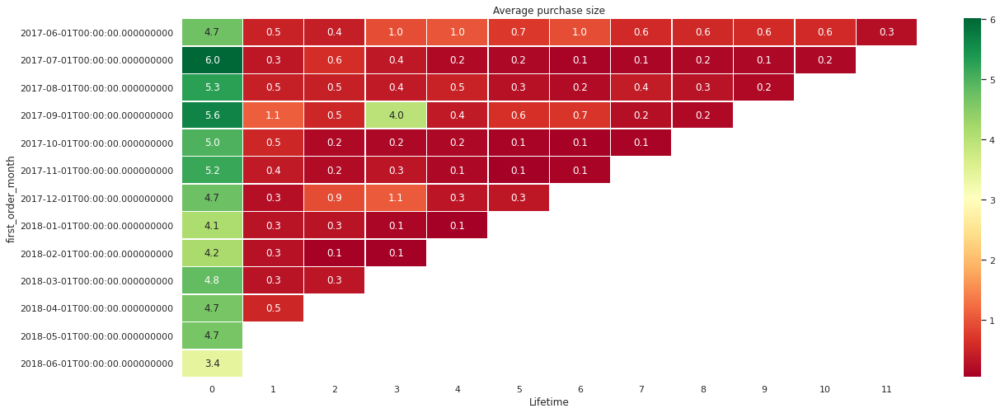

In [150]:
report_pivot_revenue = report.pivot_table(index='first_order_month', columns='age', 
                                           values='customers_per_buyers', aggfunc='mean')
# report_pivot_revenue = report_pivot_revenue/n_buyers
plt.figure(figsize=(20, 8))
plt.title('Average purchase size')
sns.heatmap(report_pivot_revenue, annot=True, fmt=".1f", linewidths=.5, cmap = 'RdYlGn')
plt.xlabel('Lifetime')
plt.show()

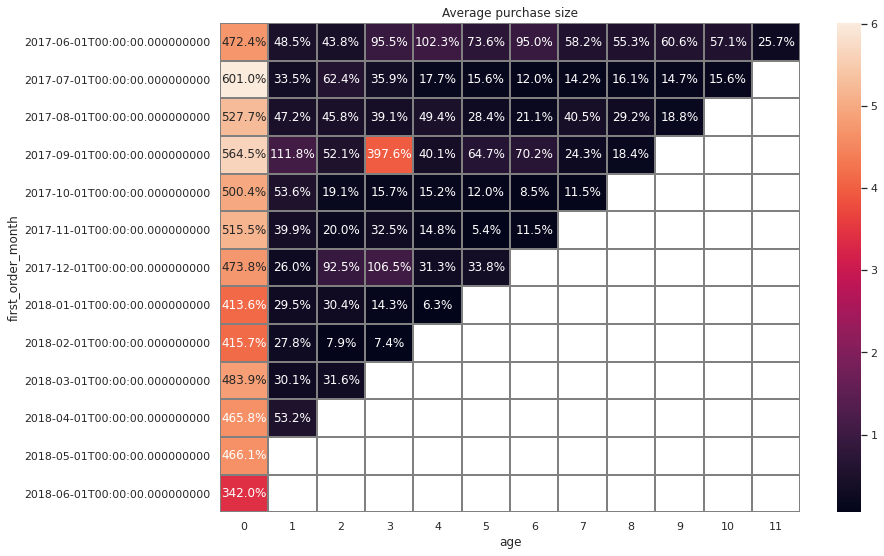

In [151]:
sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('Average purchase size')
sns.heatmap(report_pivot_revenue, annot=True, fmt='.1%', linewidths=1, linecolor='gray')
plt.show()

###### Conclusion

    * In 2017, 27,467 orders made where as in 2018, 22,948 orders made. There was more orders in 2017 than 2018.
    * The orders per month ranged from 1 to 6218 and the average order per month was 3878.
    * The orders per week ranged from 1 to 1894 and the average order per week was 800.
    * The orders per day ranged from 1 to 814 and the average order per day was 138.
    * The average revenue is 3190.
    * The average customers per buyers is 1.15.

###### What is the average purchase size?

In [152]:
# The information about orders DataFrame
orders.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   buy_ts                50415 non-null  datetime64[ns]
 1   revenue               50415 non-null  float64       
 2   uid                   50415 non-null  uint64        
 3   order_month           50415 non-null  datetime64[ns]
 4   order_year            50415 non-null  datetime64[ns]
 5   order_week            50415 non-null  datetime64[ns]
 6   order_date            50415 non-null  datetime64[ns]
 7   order_month_activity  50415 non-null  datetime64[ns]
dtypes: datetime64[ns](6), float64(1), uint64(1)
memory usage: 3.1 MB


In [153]:
# Sample data of the DataFrame
orders.head(10)

,buy_ts,revenue,uid,order_month,order_year,order_week,order_date,order_month_activity
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
5,2017-06-01 08:43:00,0.18,10402394430196413321,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
6,2017-06-01 08:54:00,1.83,12464626743129688638,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
7,2017-06-01 09:22:00,1.22,3644482766749211722,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
8,2017-06-01 09:22:00,3.30,17542070709969841479,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
9,2017-06-01 09:23:00,0.37,1074355127080856382,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01


In [154]:
# To examine the distribution of order dates
orders['buy_ts'].describe()

count                   50415
unique                  45991
top       2018-05-31 10:13:00
freq                        9
first     2017-06-01 00:10:00
last      2018-06-01 00:02:00
Name: buy_ts, dtype: object

In [155]:
# To make monthly cohorts
orders['order_month'] = orders['buy_ts'].astype('datetime64[M]')
orders.head(10)


,buy_ts,revenue,uid,order_month,order_year,order_week,order_date,order_month_activity
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
5,2017-06-01 08:43:00,0.18,10402394430196413321,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
6,2017-06-01 08:54:00,1.83,12464626743129688638,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
7,2017-06-01 09:22:00,1.22,3644482766749211722,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
8,2017-06-01 09:22:00,3.30,17542070709969841479,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
9,2017-06-01 09:23:00,0.37,1074355127080856382,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01


In [156]:
# To retrieve the month of each customer's first purchase
first_orders = orders.groupby('uid').agg({'order_month': 'min'}).reset_index()
first_orders.columns = ['uid', 'first_order_month']
first_orders.sample(10) 

,uid,first_order_month
1490,745110943593938635,2018-02-01
28352,14312112355827005152,2018-05-01
7424,3756939472712452711,2018-02-01
16572,8323346319825169427,2018-03-01
35709,18018577757878062837,2018-02-01
21298,10779110528134285836,2017-09-01
1040,510329245794559190,2018-02-01
9624,4867777926673111197,2017-10-01
24277,12280396779247617294,2018-03-01
11549,5789876908107979132,2018-01-01


In [157]:
orders['order_month_activity'] = orders['order_date'].astype('datetime64[M]')

In [158]:
# To calculate the number of new customers (n_buyers) for each month
cohort_sizes = first_orders.groupby('first_order_month').agg({'uid': 'nunique'}).reset_index()
cohort_sizes.columns = ['first_order_month', 'uid']
cohort_sizes.head() 

,first_order_month,uid
0,2017-06-01,2023
1,2017-07-01,1923
2,2017-08-01,1370
3,2017-09-01,2581
4,2017-10-01,4340


In [159]:
# Build cohorts and add customers' first-purchase months to the table of orders
orders_ = pd.merge(orders,first_orders, on='uid')
orders_.head(10) 

,buy_ts,revenue,uid,order_month,order_year,order_week,order_date,order_month_activity,first_order_month
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
5,2017-06-01 08:43:00,0.18,10402394430196413321,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
6,2017-06-01 08:54:00,1.83,12464626743129688638,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
7,2017-06-05 14:30:00,7.33,12464626743129688638,2017-06-01,2017-01-01,2017-06-05,2017-06-05,2017-06-01,2017-06-01
8,2017-06-01 09:22:00,1.22,3644482766749211722,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
9,2017-06-02 12:44:00,0.85,3644482766749211722,2017-06-01,2017-01-01,2017-06-02,2017-06-02,2017-06-01,2017-06-01


In [160]:
# Now I'll group the table of orders by month of first purchase and month of purchase and sum up the revenue. 
# I'll set the index to the default using the reset_index() method.
cohorts = orders_.groupby(['first_order_month','order_month_activity']).agg({'revenue': 'sum'}).reset_index()
cohorts.head() 

,first_order_month,order_month_activity,revenue
0,2017-06-01,2017-06-01,9557.49
1,2017-06-01,2017-07-01,981.82
2,2017-06-01,2017-08-01,885.34
3,2017-06-01,2017-09-01,1931.30
4,2017-06-01,2017-10-01,2068.58


In [161]:
cohorts['revenue_per_user'] = cohorts['revenue'] / orders_['uid']
cohorts.head(10)

,first_order_month,order_month_activity,revenue,revenue_per_user
0,2017-06-01,2017-06-01,9557.49,9.252794e-16
1,2017-06-01,2017-07-01,981.82,8.444123e-17
2,2017-06-01,2017-08-01,885.34,4.945017e-17
3,2017-06-01,2017-09-01,1931.30,1.198877e-16
4,2017-06-01,2017-10-01,2068.58,1.456684e-16
5,2017-06-01,2017-11-01,1487.92,1.430363e-16
6,2017-06-01,2017-12-01,1922.74,1.542557e-16
7,2017-06-01,2018-01-01,1176.56,9.439192e-17
8,2017-06-01,2018-02-01,1119.15,3.070806e-16
9,2017-06-01,2018-03-01,1225.51,3.362645e-16


In [162]:
# Add data on how many users made their first purchases in each month to the cohorts table.
report = pd.merge(cohort_sizes, cohorts, on = 'first_order_month')
report.head(10) 

,first_order_month,uid,order_month_activity,revenue,revenue_per_user
0,2017-06-01,2023,2017-06-01,9557.49,9.252794e-16
1,2017-06-01,2023,2017-07-01,981.82,8.444123e-17
2,2017-06-01,2023,2017-08-01,885.34,4.945017e-17
3,2017-06-01,2023,2017-09-01,1931.30,1.198877e-16
4,2017-06-01,2023,2017-10-01,2068.58,1.456684e-16
5,2017-06-01,2023,2017-11-01,1487.92,1.430363e-16
6,2017-06-01,2023,2017-12-01,1922.74,1.542557e-16
7,2017-06-01,2023,2018-01-01,1176.56,9.439192e-17
8,2017-06-01,2023,2018-02-01,1119.15,3.070806e-16
9,2017-06-01,2023,2018-03-01,1225.51,3.362645e-16


In [163]:
# To calculate cohort's life time
report['age'] = (report['order_month_activity'] - report['first_order_month']) / np.timedelta64(1, 'M')
report['age'] = report['age'].round().astype('int')
report.head(10) 

,first_order_month,uid,order_month_activity,revenue,revenue_per_user,age
0,2017-06-01,2023,2017-06-01,9557.49,9.252794e-16,0
1,2017-06-01,2023,2017-07-01,981.82,8.444123e-17,1
2,2017-06-01,2023,2017-08-01,885.34,4.945017e-17,2
3,2017-06-01,2023,2017-09-01,1931.30,1.198877e-16,3
4,2017-06-01,2023,2017-10-01,2068.58,1.456684e-16,4
5,2017-06-01,2023,2017-11-01,1487.92,1.430363e-16,5
6,2017-06-01,2023,2017-12-01,1922.74,1.542557e-16,6
7,2017-06-01,2023,2018-01-01,1176.56,9.439192e-17,7
8,2017-06-01,2023,2018-02-01,1119.15,3.070806e-16,8
9,2017-06-01,2023,2018-03-01,1225.51,3.362645e-16,9


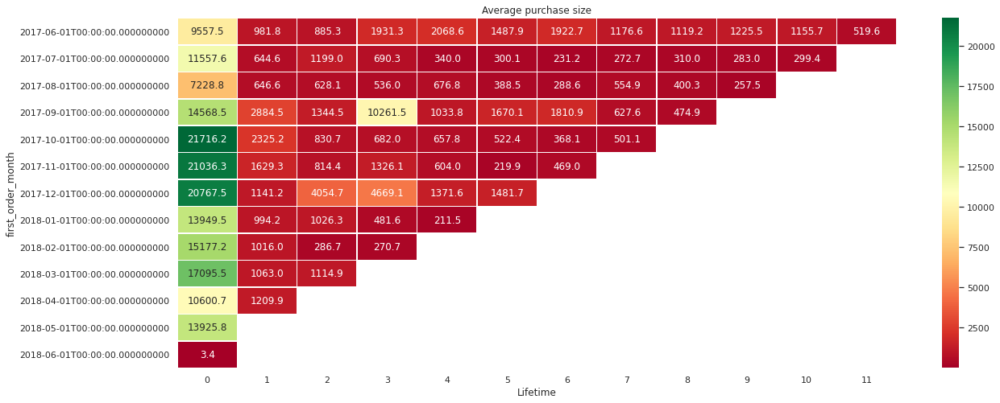

In [164]:
# report['first_order_month'] = report['first_order_month'].dt.strftime('%Y-%m-%d')
report_pivot_revenue = report.pivot_table(index='first_order_month', columns='age', values='revenue', aggfunc='mean')
plt.figure(figsize=(20, 8))
plt.title('Average purchase size')
sns.heatmap(report_pivot_revenue, annot=True, fmt=".1f", linewidths=.5, cmap = 'RdYlGn')
plt.xlabel('Lifetime')
plt.show()


In [165]:
report.describe()

,uid,revenue,revenue_per_user,age
count,79.000000,79.000000,7.900000e+01,79.000000
mean,2804.455696,3190.597468,8.276804e-16,3.620253
std,1113.140174,5392.641642,1.476298e-15,2.953936
min,1.000000,3.420000,9.384048e-19,0.000000
25%,1923.000000,491.365000,1.148666e-16,1.000000
50%,2581.000000,1015.980000,1.871349e-16,3.000000
75%,4081.000000,1866.795000,4.267999e-16,6.000000
max,4383.000000,21716.200000,5.958651e-15,11.000000


In [166]:
total_revenue = report.revenue.sum()
total_revenue

252057.19999999934

In [167]:
# Average order revenue
average_order_revenue = orders['revenue'].mean()
average_order_revenue

4.999646930477041

In [168]:
# Average order revenue
sum_order_revenue = orders['revenue'].sum()
sum_order_revenue

252057.19999999998

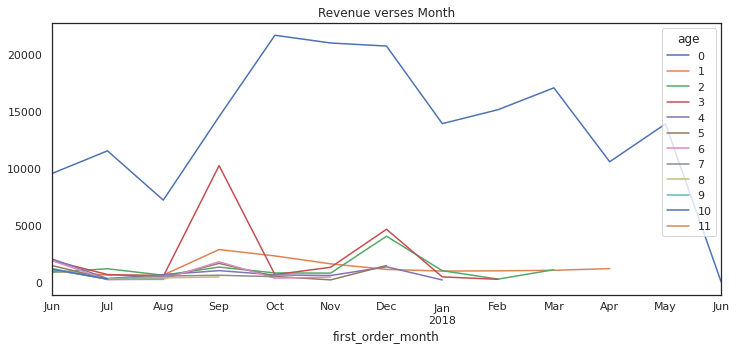

In [169]:
report_pivot_revenue.plot(figsize = (12,5))
plt.title('Revenue verses Month')
plt.show()

As month increases revenue decreases.

In [170]:
revenue_cohort = report.groupby(['order_month_activity']).agg({'revenue':'mean'})

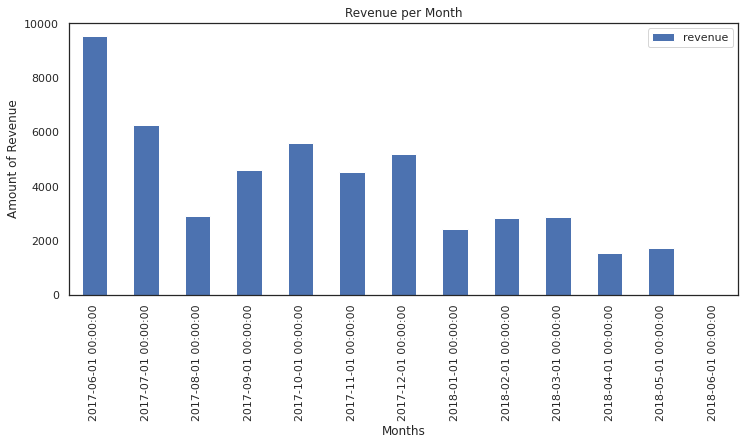

In [171]:
revenue_cohort.plot(kind = 'bar', figsize = (12,5))
plt.title('Revenue per Month')
plt.xlabel('Months')
plt.ylabel('Amount of Revenue')
plt.show()

###### How much money do they bring? (LTV)

In [172]:
# Number of orderor buyers by year cohort
orders_per_year = orders.groupby(by = ['order_year'])['uid'].count()
orders_per_year

order_year
2017-01-01    27467
2018-01-01    22948
Name: uid, dtype: int64

In [173]:
# Number of orderor buyers by month cohort
orders_per_month = orders.groupby(by = ['order_year', 'order_month'])['uid'].count()
orders_per_month.head(15)

order_year  order_month
2017-01-01  2017-06-01     2354
            2017-07-01     2363
            2017-08-01     1807
            2017-09-01     3387
            2017-10-01     5679
            2017-11-01     5659
            2017-12-01     6218
2018-01-01  2018-01-01     4721
            2018-02-01     5281
            2018-03-01     5326
            2018-04-01     3273
            2018-05-01     4346
            2018-06-01        1
Name: uid, dtype: int64

In [174]:
# Number of orderor buyers by week cohort
orders_per_week = orders.groupby(by = ['order_year', 'order_month', 'order_week'])['uid'].count()
orders_per_week

order_year  order_month  order_week
2017-01-01  2017-06-01   2017-06-01     96
                         2017-06-02    111
                         2017-06-03     67
                         2017-06-04     66
                         2017-06-05    161
                                      ... 
2018-01-01  2018-05-01   2018-05-28    188
                         2018-05-29    189
                         2018-05-30    208
                         2018-05-31    610
            2018-06-01   2018-06-01      1
Name: uid, Length: 364, dtype: int64

In [175]:
# Number of order or buyers by day cohort
orders_per_day = orders.groupby(by = ['order_year', 'order_month', 'order_week', 'order_date'])['uid'].count()
orders_per_day

order_year  order_month  order_week  order_date
2017-01-01  2017-06-01   2017-06-01  2017-06-01     96
                         2017-06-02  2017-06-02    111
                         2017-06-03  2017-06-03     67
                         2017-06-04  2017-06-04     66
                         2017-06-05  2017-06-05    161
                                                  ... 
2018-01-01  2018-05-01   2018-05-28  2018-05-28    188
                         2018-05-29  2018-05-29    189
                         2018-05-30  2018-05-30    208
                         2018-05-31  2018-05-31    610
            2018-06-01   2018-06-01  2018-06-01      1
Name: uid, Length: 364, dtype: int64

In [176]:
orders_per_day = orders.groupby(by = ['order_year', 'order_month', 'order_week', 'order_date'])['uid'].sum()
orders_per_day

order_year  order_month  order_week  order_date
2017-01-01  2017-06-01   2017-06-01  2017-06-01    9.295087e+20
                         2017-06-02  2017-06-02    1.021041e+21
                         2017-06-03  2017-06-03    4.827417e+20
                         2017-06-04  2017-06-04    5.633746e+20
                         2017-06-05  2017-06-05    1.411573e+21
                                                       ...     
2018-01-01  2018-05-01   2018-05-28  2018-05-28    1.759721e+21
                         2018-05-29  2018-05-29    1.806599e+21
                         2018-05-30  2018-05-30    1.827137e+21
                         2018-05-31  2018-05-31    5.670846e+21
            2018-06-01   2018-06-01  2018-06-01    8.387279e+16
Name: uid, Length: 364, dtype: float64

In [177]:
# The information about orders DataFrame
orders.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   buy_ts                50415 non-null  datetime64[ns]
 1   revenue               50415 non-null  float64       
 2   uid                   50415 non-null  uint64        
 3   order_month           50415 non-null  datetime64[ns]
 4   order_year            50415 non-null  datetime64[ns]
 5   order_week            50415 non-null  datetime64[ns]
 6   order_date            50415 non-null  datetime64[ns]
 7   order_month_activity  50415 non-null  datetime64[ns]
dtypes: datetime64[ns](6), float64(1), uint64(1)
memory usage: 3.1 MB


In [178]:
# To make monthly cohorts
orders['order_month'] = orders['buy_ts'].astype('datetime64[M]')
orders.head(10)

,buy_ts,revenue,uid,order_month,order_year,order_week,order_date,order_month_activity
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
5,2017-06-01 08:43:00,0.18,10402394430196413321,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
6,2017-06-01 08:54:00,1.83,12464626743129688638,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
7,2017-06-01 09:22:00,1.22,3644482766749211722,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
8,2017-06-01 09:22:00,3.30,17542070709969841479,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
9,2017-06-01 09:23:00,0.37,1074355127080856382,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01


In [179]:
# To retrieve the month of each customer's first purchase
first_orders = orders.groupby('uid').agg({'order_month': 'min'}).reset_index()
first_orders.columns = ['uid', 'first_order_month']
first_orders.sample(10) 

,uid,first_order_month
16238,8144845361644338783,2018-01-01
29926,15080953154373505386,2018-04-01
19459,9838362521225865443,2017-10-01
11234,5638530648258910668,2017-10-01
26220,13229483923156777423,2017-11-01
22472,11348843922373535003,2017-09-01
2560,1316004728126751649,2017-10-01
31416,15854392578508828030,2018-05-01
10489,5279452589520088734,2018-01-01
32428,16375671170237749472,2017-08-01


In [180]:
orders['order_month_activity'] = orders['order_date'].astype('datetime64[M]')

In [181]:
# To calculate the number of new customers (n_buyers) for each month
cohort_sizes = first_orders.groupby('first_order_month').agg({'uid': 'nunique'}).reset_index()
cohort_sizes.columns = ['first_order_month', 'uid']
cohort_sizes.head()

,first_order_month,uid
0,2017-06-01,2023
1,2017-07-01,1923
2,2017-08-01,1370
3,2017-09-01,2581
4,2017-10-01,4340


In [182]:
# Build cohorts and add customers' first-purchase months to the table of orders
orders_ = pd.merge(orders,first_orders, on='uid')
orders_.head(10) 

,buy_ts,revenue,uid,order_month,order_year,order_week,order_date,order_month_activity,first_order_month
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
5,2017-06-01 08:43:00,0.18,10402394430196413321,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
6,2017-06-01 08:54:00,1.83,12464626743129688638,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
7,2017-06-05 14:30:00,7.33,12464626743129688638,2017-06-01,2017-01-01,2017-06-05,2017-06-05,2017-06-01,2017-06-01
8,2017-06-01 09:22:00,1.22,3644482766749211722,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
9,2017-06-02 12:44:00,0.85,3644482766749211722,2017-06-01,2017-01-01,2017-06-02,2017-06-02,2017-06-01,2017-06-01


In [183]:
# Now I'll group the table of orders by month of first purchase and month of purchase and sum up the revenue. 
# I'll set the index to the default using the reset_index() method.
cohorts = orders_.groupby(['first_order_month','order_month_activity']).agg({'revenue': 'sum'}).reset_index()
cohorts.head() 

,first_order_month,order_month_activity,revenue
0,2017-06-01,2017-06-01,9557.49
1,2017-06-01,2017-07-01,981.82
2,2017-06-01,2017-08-01,885.34
3,2017-06-01,2017-09-01,1931.30
4,2017-06-01,2017-10-01,2068.58


In [184]:
cohorts['revenue_per_user'] = cohorts['revenue'] / orders_['uid']
cohorts.head(10)

,first_order_month,order_month_activity,revenue,revenue_per_user
0,2017-06-01,2017-06-01,9557.49,9.252794e-16
1,2017-06-01,2017-07-01,981.82,8.444123e-17
2,2017-06-01,2017-08-01,885.34,4.945017e-17
3,2017-06-01,2017-09-01,1931.30,1.198877e-16
4,2017-06-01,2017-10-01,2068.58,1.456684e-16
5,2017-06-01,2017-11-01,1487.92,1.430363e-16
6,2017-06-01,2017-12-01,1922.74,1.542557e-16
7,2017-06-01,2018-01-01,1176.56,9.439192e-17
8,2017-06-01,2018-02-01,1119.15,3.070806e-16
9,2017-06-01,2018-03-01,1225.51,3.362645e-16


In [185]:
# Add data on how many users made their first purchases in each month to the cohorts table.
report = pd.merge(cohort_sizes, cohorts, on = 'first_order_month')
report.head(10) 

,first_order_month,uid,order_month_activity,revenue,revenue_per_user
0,2017-06-01,2023,2017-06-01,9557.49,9.252794e-16
1,2017-06-01,2023,2017-07-01,981.82,8.444123e-17
2,2017-06-01,2023,2017-08-01,885.34,4.945017e-17
3,2017-06-01,2023,2017-09-01,1931.30,1.198877e-16
4,2017-06-01,2023,2017-10-01,2068.58,1.456684e-16
5,2017-06-01,2023,2017-11-01,1487.92,1.430363e-16
6,2017-06-01,2023,2017-12-01,1922.74,1.542557e-16
7,2017-06-01,2023,2018-01-01,1176.56,9.439192e-17
8,2017-06-01,2023,2018-02-01,1119.15,3.070806e-16
9,2017-06-01,2023,2018-03-01,1225.51,3.362645e-16


In [186]:
# To calculate cohort's life time
report['age'] = (report['order_month_activity'] - report['first_order_month']) / np.timedelta64(1, 'M')
report['age'] = report['age'].round().astype('int')
report.head(10) 

,first_order_month,uid,order_month_activity,revenue,revenue_per_user,age
0,2017-06-01,2023,2017-06-01,9557.49,9.252794e-16,0
1,2017-06-01,2023,2017-07-01,981.82,8.444123e-17,1
2,2017-06-01,2023,2017-08-01,885.34,4.945017e-17,2
3,2017-06-01,2023,2017-09-01,1931.30,1.198877e-16,3
4,2017-06-01,2023,2017-10-01,2068.58,1.456684e-16,4
5,2017-06-01,2023,2017-11-01,1487.92,1.430363e-16,5
6,2017-06-01,2023,2017-12-01,1922.74,1.542557e-16,6
7,2017-06-01,2023,2018-01-01,1176.56,9.439192e-17,7
8,2017-06-01,2023,2018-02-01,1119.15,3.070806e-16,8
9,2017-06-01,2023,2018-03-01,1225.51,3.362645e-16,9


In [187]:
# Calculation revenue for each customer
cohorts['revenue_per_user'] = cohorts['revenue'] / orders_['uid']
cohorts.head(10)

,first_order_month,order_month_activity,revenue,revenue_per_user
0,2017-06-01,2017-06-01,9557.49,9.252794e-16
1,2017-06-01,2017-07-01,981.82,8.444123e-17
2,2017-06-01,2017-08-01,885.34,4.945017e-17
3,2017-06-01,2017-09-01,1931.30,1.198877e-16
4,2017-06-01,2017-10-01,2068.58,1.456684e-16
5,2017-06-01,2017-11-01,1487.92,1.430363e-16
6,2017-06-01,2017-12-01,1922.74,1.542557e-16
7,2017-06-01,2018-01-01,1176.56,9.439192e-17
8,2017-06-01,2018-02-01,1119.15,3.070806e-16
9,2017-06-01,2018-03-01,1225.51,3.362645e-16


In [188]:
margin_rate = 0.5 # Assume marigin rate is 0.4

report['gp'] = report['revenue'] * margin_rate
report['gp']

0     4778.745
1      490.910
2      442.670
3      965.650
4     1034.290
        ...   
74     557.435
75    5300.345
76     604.960
77    6962.880
78       1.710
Name: gp, Length: 79, dtype: float64

In [189]:
# Calculate LTV. Let's divide the cohort's gross profit for each month by the total number of users in each cohort
report['ltv'] = report['gp'] / report['uid']
report['ltv']

0     2.362207
1     0.242664
2     0.218819
3     0.477336
4     0.511265
        ...   
74    0.157780
75    2.328798
76    0.265800
77    2.330281
78    1.710000
Name: ltv, Length: 79, dtype: float64

In [190]:
# Visualize the cohorts as a pivot table
output = report.pivot_table(
    index='first_order_month', columns='age', values='ltv', aggfunc='mean'
).round()

output.fillna('') 

age,0,1,2,3,4,5,6,7,8,9,10,11
first_order_month,,,,,,,,,,,,
2017-06-01,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2017-07-01,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,
2017-08-01,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,,
2017-09-01,3.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,,,
2017-10-01,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,,,,
2017-11-01,3.0,0.0,0.0,0.0,0.0,0.0,0.0,,,,,
2017-12-01,2.0,0.0,0.0,1.0,0.0,0.0,,,,,,
2018-01-01,2.0,0.0,0.0,0.0,0.0,,,,,,,
2018-02-01,2.0,0.0,0.0,0.0,,,,,,,,


In [191]:
ltv_20170601 = output.loc['2017-06-01'].sum()
ltv_20170601 

3.0

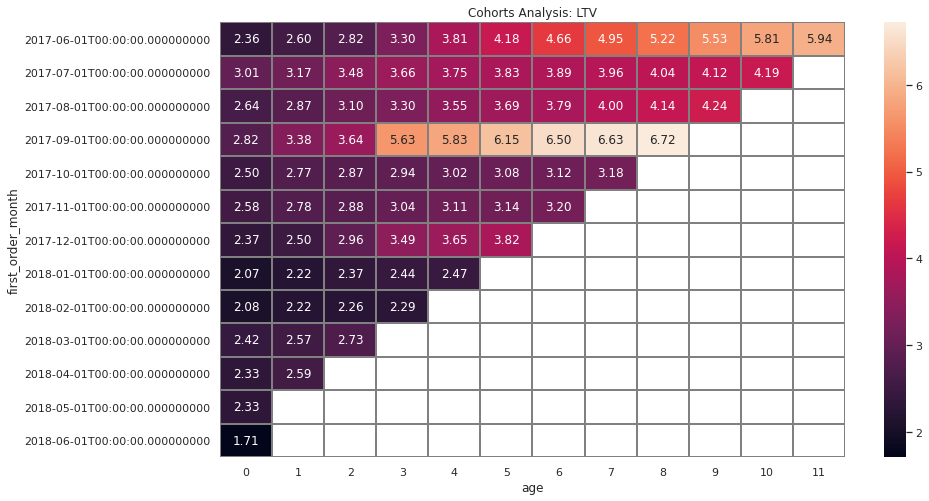

In [192]:
report_heatmap = report.pivot_table(
    index='first_order_month', 
    columns='age', 
    values='ltv', 
    aggfunc='mean').cumsum(axis=1)

plt.figure(figsize=(14, 8))
plt.title('Cohorts Analysis: LTV')
sns.heatmap(report_heatmap, annot=True, fmt='.2f', linewidths=1, linecolor='gray')
plt.show()

###### Conclusion

    * On average, each customer from the first cohort brought $2 in revenue over their one year liftetime.
    * As it is seen from the heatmap on September 2017 cohort was succesful.
    * Cohort decrease from month to month.
    


In [193]:
# Find the time of the first purchase of each customer 
first_orders = orders.groupby('uid').agg({'buy_ts': 'min'}).reset_index()
first_orders.columns = ['uid', 'first_order_ts']
first_orders['first_order_month'] = first_orders['first_order_ts'].astype('datetime64[M]')

In [194]:
cohort_sizes = first_orders.groupby('first_order_month').agg({'uid': 'nunique'}).reset_index()
cohort_sizes.rename(columns={'uid': 'n_buyers'}, inplace=True)

cohorts = pd.merge(orders, first_orders, how='inner', on='uid')\
            .groupby(['first_order_month', 'order_month'])\
            .agg({'revenue': 'sum'}).reset_index()


In [195]:
cohorts['age_month'] = ((cohorts['order_month'] - cohorts['first_order_month']) / np.timedelta64(1,'M')).round()
cohorts.columns = ['first_order_month', 'order_month', 'revenue', 'age_month']

cohorts_report = pd.merge(cohort_sizes, cohorts, on = 'first_order_month')
cohorts_report['rev_per_buyer'] = cohorts_report['revenue'] / cohorts_report['n_buyers']

In [196]:
cohorts_age = cohorts_report.pivot_table(
    index='first_order_month', 
    columns='age_month', 
    values='rev_per_buyer', 
    aggfunc='sum'
).cumsum(axis=1)

cohorts_age.round(2).fillna('')

age_month,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0
first_order_month,,,,,,,,,,,,
2017-06-01,4.72,5.21,5.65,6.6,7.62,8.36,9.31,9.89,10.45,11.05,11.62,11.88
2017-07-01,6.01,6.35,6.97,7.33,7.5,7.66,7.78,7.92,8.08,8.23,8.39,
2017-08-01,5.28,5.75,6.21,6.6,7.09,7.38,7.59,7.99,8.28,8.47,,
2017-09-01,5.64,6.76,7.28,11.26,11.66,12.31,13.01,13.25,13.44,,,
2017-10-01,5.00,5.54,5.73,5.89,6.04,6.16,6.24,6.36,,,,
2017-11-01,5.15,5.55,5.75,6.08,6.23,6.28,6.4,,,,,
2017-12-01,4.74,5.0,5.92,6.99,7.3,7.64,,,,,,
2018-01-01,4.14,4.43,4.73,4.88,4.94,,,,,,,
2018-02-01,4.16,4.44,4.51,4.59,,,,,,,,


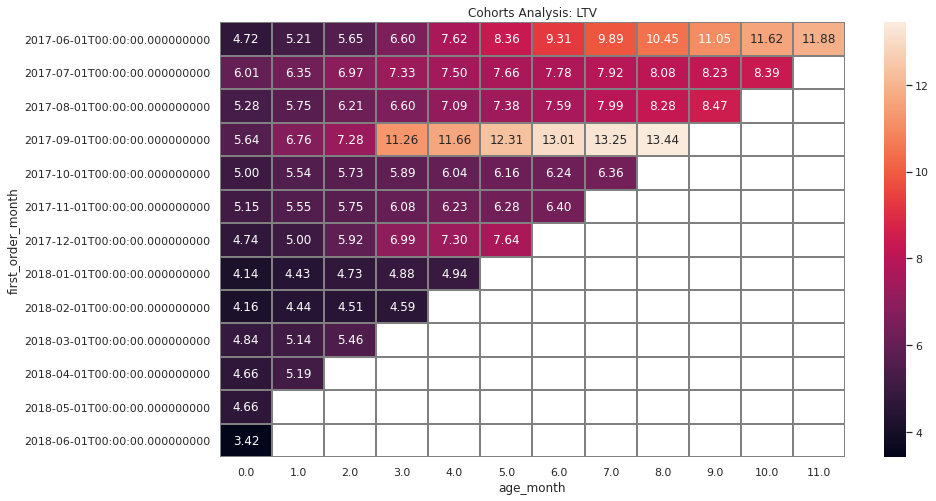

In [197]:
plt.figure(figsize=(14, 8))
plt.title('Cohorts Analysis: LTV')
sns.heatmap(cohorts_age, annot=True, fmt='.2f', linewidths=1, linecolor='gray')
plt.show()

###### Marketing

    * How much money was spent? Overall/per source/over time
    
    * How much did customer acquisition from each of the sources cost?
    
    *How worthwhile where the investments? (ROI)
    
Plot graphs to display how these metrics differ for various devices and ad sources and how they change in time.

###### How much money was spent? Overall/per source/over time

In [198]:
# General information about the DataFrame
costs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2542 entries, 0 to 2541
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   source_id  2542 non-null   int64         
 1   dt         2542 non-null   datetime64[ns]
 2   costs      2542 non-null   float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 59.7 KB


In [199]:
# Statistical information about the DataFrame
costs.describe()

,source_id,costs
count,2542.000000,2542.000000
mean,4.857199,129.477427
std,3.181581,156.296628
min,1.000000,0.540000
25%,2.000000,21.945000
50%,4.000000,77.295000
75%,9.000000,170.065000
max,10.000000,1788.280000


In [200]:
# Sample of the DataFrame
costs.head(10)

,source_id,dt,costs
0,1,2017-06-01,75.20
1,1,2017-06-02,62.25
2,1,2017-06-03,36.53
3,1,2017-06-04,55.00
4,1,2017-06-05,57.08
5,1,2017-06-06,40.39
6,1,2017-06-07,40.59
7,1,2017-06-08,56.63
8,1,2017-06-09,40.16
9,1,2017-06-10,43.24


In [201]:
# To calculate total amout of money spent
total_costs = format(costs['costs'].sum())
total_costs

'329131.62'

In [202]:
orders['order_month'] = orders['order_date'].astype('datetime64[M]')
costs['month'] = costs['dt'].dt.month

In [203]:
# calculating the costs per month
costs['month'] = costs['dt'].astype('datetime64[M]')
monthly_costs = costs.groupby('month').sum()
# monthly_costs = costs.groupby(['source_id'])['costs'].sum().reset_index()
monthly_costs.head() 

,source_id,costs
month,,
2017-06-01,1020,18015.00
2017-07-01,1054,18240.59
2017-08-01,1054,14790.54
2017-09-01,1020,24368.91
2017-10-01,1054,36322.88


In [204]:
#Let's see what how it's split across sources
costs_per_source = costs.groupby(['source_id'])['costs'].sum().reset_index()
costs_per_source.head(15)

,source_id,costs
0,1,20833.27
1,2,42806.04
2,3,141321.63
3,4,61073.60
4,5,51757.10
5,9,5517.49
6,10,5822.49


In [205]:
costs['month'] = costs['dt'].astype('datetime64[M]')
costs_per_month = costs.groupby(['month','source_id']).agg({'costs': 'sum'})
costs_per_month.head(10)

costs
month      source_id         
2017-06-01 1          1125.61
           2          2427.38
           3          7731.65
           4          3514.80
           5          2616.12
           9           285.22
           10          314.22
2017-07-01 1          1072.88
           2          2333.11
           3          7674.37

In [206]:
# The distribution of costs with respect to time
fig = px.line(costs, x = 'dt', y = 'costs', color = 'source_id')
fig.show()

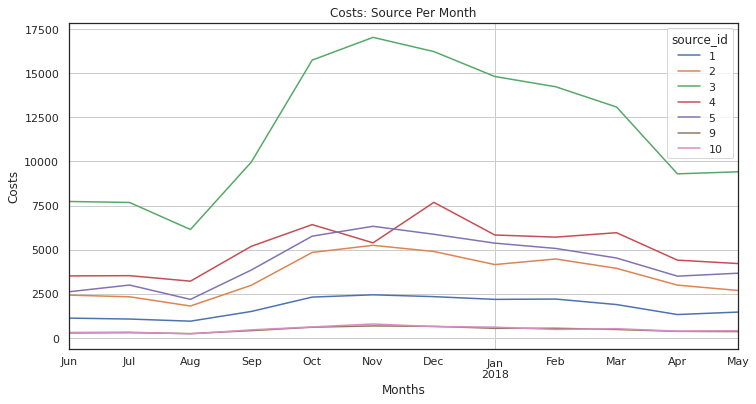

In [207]:
costs_per_month.pivot_table(index = ['month'],columns = 'source_id', values = 'costs',aggfunc = 'mean').plot(grid = True, figsize = (12, 6))
plt.title('Costs: Source Per Month')
plt.ylabel('Costs')
plt.xlabel('Months')
plt.show()


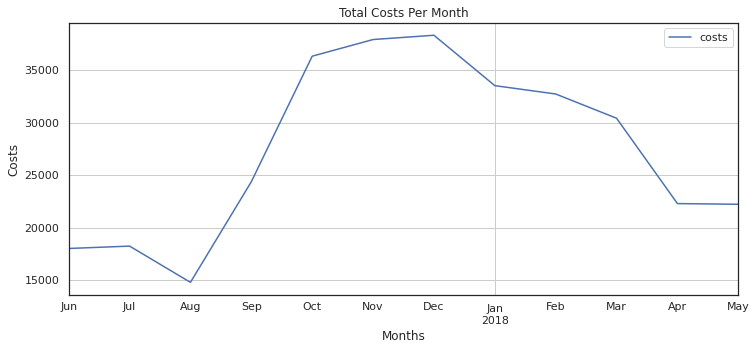

In [208]:
monthly_costs.pivot_table(index = ['month'], values = 'costs',aggfunc = 'mean').plot(grid = True, 
                                                                                     figsize = (12, 5))
plt.title('Total Costs Per Month')
plt.ylabel('Costs')
plt.xlabel('Months')
plt.show()


###### Conclusion

    * Total costs is 329,131.62
    * CAC is 8.9
    * LTV is 40.94
    * More expences was made between November 2017 and January 2018 and less expenses was made between June 2017 and September 2017 as well as between May 2018 and June 2018. 
    * Total costs per month is maximum between October to December 2017

###### How much did customer acquisition from each of the sources cost?

In [209]:
orders['buy_ts'] = pd.to_datetime(orders['buy_ts'])
costs['dt'] = pd.to_datetime(costs['dt'])

orders['order_month'] = orders['buy_ts'].astype('datetime64[M]')
costs['month'] = costs['dt'].astype('datetime64[M]')

first_orders = orders.groupby('uid').agg({'order_month': 'min'}).reset_index()
first_orders.columns = ['uid', 'first_order_month']

cohort_sizes = (
    first_orders.groupby('first_order_month')
    .agg({'uid': 'nunique'})
    .reset_index()
)
cohort_sizes.columns = ['first_order_month', 'n_buyers']

margin_rate = 0.4

orders_ = pd.merge(orders, first_orders, on='uid')
cohorts = (
    orders_.groupby(['first_order_month', 'order_month'])
    .agg({'revenue': 'sum'})
    .reset_index()
)
report = pd.merge(cohort_sizes, cohorts, on='first_order_month')

report['gp'] = report['revenue'] * margin_rate
report['age'] = (
    report['order_month'] - report['first_order_month']
) / np.timedelta64(1, 'M')
report['age'] = report['age'].round().astype('int')

report['ltv'] = report['gp'] / report['n_buyers']

result = report.pivot_table(
    index='first_order_month', columns='age', values='ltv', aggfunc='mean'
).round()

result = result.fillna('')

monthly_costs = costs.groupby('month').sum() # calculate monthly costs
report_ = pd.merge(report, monthly_costs, left_on='first_order_month', right_on='month') # add monthly costs to the cohort report
report_['cac'] = report_['costs'] / report_['n_buyers'] # calculate CAC
print(report_)

   first_order_month  n_buyers order_month   revenue        gp  age       ltv  \
0         2017-06-01      2023  2017-06-01   9557.49  3822.996    0  1.889766   
1         2017-06-01      2023  2017-07-01    981.82   392.728    1  0.194131   
2         2017-06-01      2023  2017-08-01    885.34   354.136    2  0.175055   
3         2017-06-01      2023  2017-09-01   1931.30   772.520    3  0.381869   
4         2017-06-01      2023  2017-10-01   2068.58   827.432    4  0.409012   
..               ...       ...         ...       ...       ...  ...       ...   
73        2018-03-01      3533  2018-04-01   1063.05   425.220    1  0.120357   
74        2018-03-01      3533  2018-05-01   1114.87   445.948    2  0.126224   
75        2018-04-01      2276  2018-04-01  10600.69  4240.276    0  1.863039   
76        2018-04-01      2276  2018-05-01   1209.92   483.968    1  0.212640   
77        2018-05-01      2988  2018-05-01  13925.76  5570.304    0  1.864225   

    source_id     costs    

In [210]:
# CAC for each source
report_['cac']

0     8.905091
1     8.905091
2     8.905091
3     8.905091
4     8.905091
        ...   
73    8.608907
74    8.608907
75    9.793225
76    9.793225
77    7.437841
Name: cac, Length: 78, dtype: float64

In [211]:
costs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2542 entries, 0 to 2541
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   source_id  2542 non-null   int64         
 1   dt         2542 non-null   datetime64[ns]
 2   costs      2542 non-null   float64       
 3   month      2542 non-null   datetime64[ns]
dtypes: datetime64[ns](2), float64(1), int64(1)
memory usage: 79.6 KB


In [212]:
# Grouping costs by month and sum of costs
monthly_costs = costs.groupby('month')['costs'].sum()
monthly_costs.head()

month
2017-06-01    18015.00
2017-07-01    18240.59
2017-08-01    14790.54
2017-09-01    24368.91
2017-10-01    36322.88
Name: costs, dtype: float64

In [213]:
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   buy_ts                50415 non-null  datetime64[ns]
 1   revenue               50415 non-null  float64       
 2   uid                   50415 non-null  uint64        
 3   order_month           50415 non-null  datetime64[ns]
 4   order_year            50415 non-null  datetime64[ns]
 5   order_week            50415 non-null  datetime64[ns]
 6   order_date            50415 non-null  datetime64[ns]
 7   order_month_activity  50415 non-null  datetime64[ns]
dtypes: datetime64[ns](6), float64(1), uint64(1)
memory usage: 3.1 MB


In [214]:
monthly_orders = orders.groupby('order_month').agg({'uid': 'nunique'})
monthly_orders

,uid
order_month,
2017-06-01,2023
2017-07-01,1984
2017-08-01,1472
2017-09-01,2750
2017-10-01,4675
2017-11-01,4547
2017-12-01,4942
2018-01-01,3898
2018-02-01,4258


In [215]:
# monthly_orders.rename(columns={'uid':'n_buyers', 'source_id': 'source_id'})

In [216]:
# merge(indexes are true)
orders_costs = pd.merge(monthly_orders, monthly_costs, left_index=True, right_index=True)
orders_costs

,uid,costs
2017-06-01,2023,18015.00
2017-07-01,1984,18240.59
2017-08-01,1472,14790.54
2017-09-01,2750,24368.91
2017-10-01,4675,36322.88
2017-11-01,4547,37907.88
2017-12-01,4942,38315.35
2018-01-01,3898,33518.52
2018-02-01,4258,32723.03
2018-03-01,4181,30415.27


In [217]:
# Calculate cac
orders_costs['cac'] = orders_costs['costs'] / orders_costs['uid']
orders_costs['cac']

2017-06-01     8.905091
2017-07-01     9.193846
2017-08-01    10.047921
2017-09-01     8.861422
2017-10-01     7.769600
2017-11-01     8.336899
2017-12-01     7.753005
2018-01-01     8.598902
2018-02-01     7.685070
2018-03-01     7.274640
2018-04-01     8.122952
2018-05-01     6.270957
Name: cac, dtype: float64

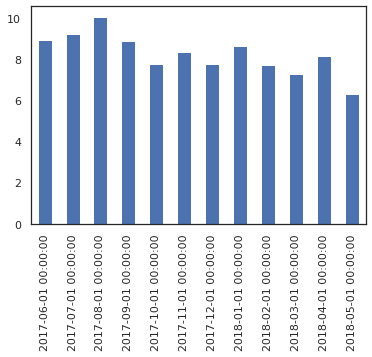

In [218]:
# plot a graph by month
orders_costs['cac'].plot(kind = 'bar', x = 'order_month', y = 'cac')
plt.show()

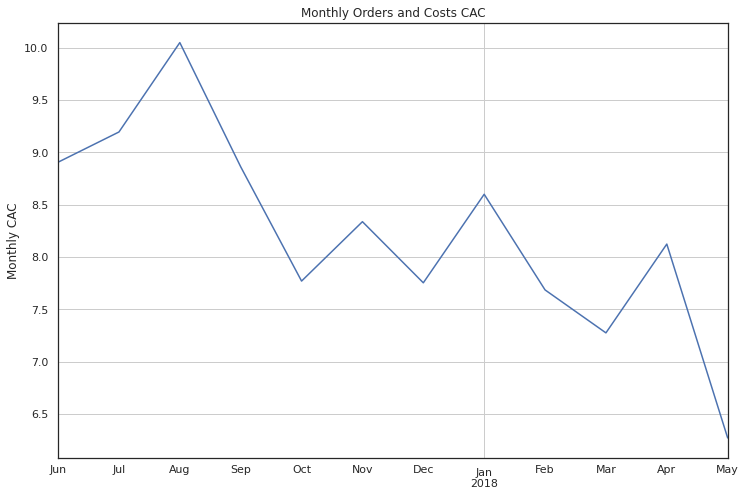

In [219]:
# plot a graph by month
orders_costs['cac'].plot(grid = True, figsize = (12,8))
plt.title('Monthly Orders and Costs CAC')
plt.ylabel('Monthly CAC')
plt.show()

In [220]:
visits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 15 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   device                359400 non-null  object        
 1   end_ts                359400 non-null  datetime64[ns]
 2   source_id             359400 non-null  int64         
 3   start_ts              359400 non-null  datetime64[ns]
 4   uid                   359400 non-null  uint64        
 5   session_year          359400 non-null  datetime64[ns]
 6   session_month         359400 non-null  datetime64[ns]
 7   session_week          359400 non-null  datetime64[ns]
 8   session_date          359400 non-null  datetime64[ns]
 9   session_duration_sec  359400 non-null  int64         
 10  session_duration_min  359400 non-null  float64       
 11  first_activity_date   359400 non-null  datetime64[ns]
 12  first_activity_month  359400 non-null  datetime64[ns]
 13 

In [221]:
# find first source per user in visits
visits_uid = visits[['source_id', 'first_activity_month', 'uid']]
visits_uid.head()

,source_id,first_activity_month,uid
0,4,2017-12-01,16879256277535980062
1,2,2018-02-01,104060357244891740
2,5,2017-07-01,7459035603376831527
3,9,2018-03-01,16174680259334210214
4,3,2017-12-01,9969694820036681168


In [222]:
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   buy_ts                50415 non-null  datetime64[ns]
 1   revenue               50415 non-null  float64       
 2   uid                   50415 non-null  uint64        
 3   order_month           50415 non-null  datetime64[ns]
 4   order_year            50415 non-null  datetime64[ns]
 5   order_week            50415 non-null  datetime64[ns]
 6   order_date            50415 non-null  datetime64[ns]
 7   order_month_activity  50415 non-null  datetime64[ns]
dtypes: datetime64[ns](6), float64(1), uint64(1)
memory usage: 3.1 MB


In [223]:
# find first order month and first order day in orders
orders_first_order = orders[['order_date', 'order_month', 'uid', 'revenue']]
orders_first_order.head()

,order_date,order_month,uid,revenue
0,2017-06-01,2017-06-01,10329302124590727494,17.00
1,2017-06-01,2017-06-01,11627257723692907447,0.55
2,2017-06-01,2017-06-01,17903680561304213844,0.37
3,2017-06-01,2017-06-01,16109239769442553005,0.55
4,2017-06-01,2017-06-01,14200605875248379450,0.37


In [224]:
# merge tables
# visits_orders_uid = pd.merge(visits_uid, orders_uid, left_index=True, right_index=True)
visits_orders_uid = pd.merge(visits_uid, orders_first_order, on='uid')
visits_orders_uid

,source_id,first_activity_month,uid,order_date,order_month,revenue
0,9,2018-03-01,16174680259334210214,2018-03-09,2018-03-01,2.33
1,4,2018-03-01,16174680259334210214,2018-03-09,2018-03-01,2.33
2,5,2017-09-01,16007536194108375387,2017-09-04,2017-09-01,2.44
3,5,2017-09-01,16007536194108375387,2017-10-28,2017-10-01,1.53
4,5,2017-09-01,16007536194108375387,2017-10-28,2017-10-01,1.53
...,...,...,...,...,...,...
761802,3,2017-12-01,6752020629696526518,2017-12-04,2017-12-01,4.15
761803,4,2017-11-01,11750532881998794555,2017-11-20,2017-11-01,3.67
761804,4,2017-11-01,11202626539189016002,2017-11-29,2017-11-01,3.05
761805,10,2018-04-01,12734910664455613822,2018-04-23,2018-04-01,0.49


In [225]:
costs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2542 entries, 0 to 2541
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   source_id  2542 non-null   int64         
 1   dt         2542 non-null   datetime64[ns]
 2   costs      2542 non-null   float64       
 3   month      2542 non-null   datetime64[ns]
dtypes: datetime64[ns](2), float64(1), int64(1)
memory usage: 79.6 KB


In [226]:
# Group new table by source id and first order day  and count uid
visits_by_source = (visits_orders_uid.groupby(['source_id', 'order_date', 'revenue'], as_index=False).agg({'uid': 'count'}))
visits_by_source.head()

,source_id,order_date,revenue,uid
0,1,2017-06-01,0.15,1
1,1,2017-06-01,0.24,5
2,1,2017-06-01,0.37,3
3,1,2017-06-01,0.61,30
4,1,2017-06-01,0.73,9


In [227]:
# merge with costs (left using source id and first order day and right using source id and costs day.

visits_costs_merge = pd.merge(visits_by_source, costs, left_on=['source_id', 'order_date'], 
                              right_on=['source_id', 'dt'])
visits_costs_merge

,source_id,order_date,revenue,uid,dt,costs,month
0,1,2017-06-01,0.15,1,2017-06-01,75.2,2017-06-01
1,1,2017-06-01,0.24,5,2017-06-01,75.2,2017-06-01
2,1,2017-06-01,0.37,3,2017-06-01,75.2,2017-06-01
3,1,2017-06-01,0.61,30,2017-06-01,75.2,2017-06-01
4,1,2017-06-01,0.73,9,2017-06-01,75.2,2017-06-01
...,...,...,...,...,...,...,...
65683,10,2018-05-31,18.33,2,2018-05-31,17.6,2018-05-01
65684,10,2018-05-31,19.55,1,2018-05-31,17.6,2018-05-01
65685,10,2018-05-31,22.00,3,2018-05-31,17.6,2018-05-01
65686,10,2018-05-31,24.44,1,2018-05-31,17.6,2018-05-01


In [228]:
# calculate cac per source
visits_costs_merge['cac'] = visits_costs_merge['costs'] / visits_costs_merge['uid']
visits_costs_merge['cac']

0        75.200000
1        15.040000
2        25.066667
3         2.506667
4         8.355556
           ...    
65683     8.800000
65684    17.600000
65685     5.866667
65686    17.600000
65687     8.800000
Name: cac, Length: 65688, dtype: float64

In [229]:
# plot a graph by month per source
visits_costs_merge_pivot= visits_costs_merge.pivot_table(
    index='month', 
    columns='source_id', 
    values='cac', 
    aggfunc='mean')


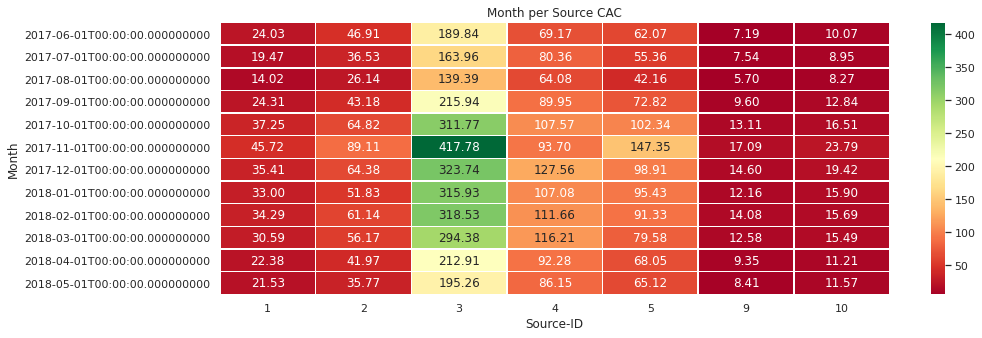

In [230]:
plt.figure(figsize=(15, 5))
plt.title('Month per Source CAC')
sns.heatmap(visits_costs_merge_pivot, annot=True, fmt=".2f", linewidths=.5, cmap = 'RdYlGn')
plt.xlabel('Source-ID')
plt.ylabel('Month')
plt.show()

###### How worthwhile where the investments? (ROI)

In [231]:
visits_costs_merge['roi'] = (visits_costs_merge['revenue'] - visits_costs_merge['costs'])*100/visits_costs_merge['costs']
visits_costs_merge['roi']

0       -99.800532
1       -99.680851
2       -99.507979
3       -99.188830
4       -99.029255
           ...    
65683     4.147727
65684    11.079545
65685    25.000000
65686    38.863636
65687    45.852273
Name: roi, Length: 65688, dtype: float64

In [232]:
visits_costs_merge

,source_id,order_date,revenue,uid,dt,costs,month,cac,roi
0,1,2017-06-01,0.15,1,2017-06-01,75.2,2017-06-01,75.200000,-99.800532
1,1,2017-06-01,0.24,5,2017-06-01,75.2,2017-06-01,15.040000,-99.680851
2,1,2017-06-01,0.37,3,2017-06-01,75.2,2017-06-01,25.066667,-99.507979
3,1,2017-06-01,0.61,30,2017-06-01,75.2,2017-06-01,2.506667,-99.188830
4,1,2017-06-01,0.73,9,2017-06-01,75.2,2017-06-01,8.355556,-99.029255
...,...,...,...,...,...,...,...,...,...
65683,10,2018-05-31,18.33,2,2018-05-31,17.6,2018-05-01,8.800000,4.147727
65684,10,2018-05-31,19.55,1,2018-05-31,17.6,2018-05-01,17.600000,11.079545
65685,10,2018-05-31,22.00,3,2018-05-31,17.6,2018-05-01,5.866667,25.000000
65686,10,2018-05-31,24.44,1,2018-05-31,17.6,2018-05-01,17.600000,38.863636


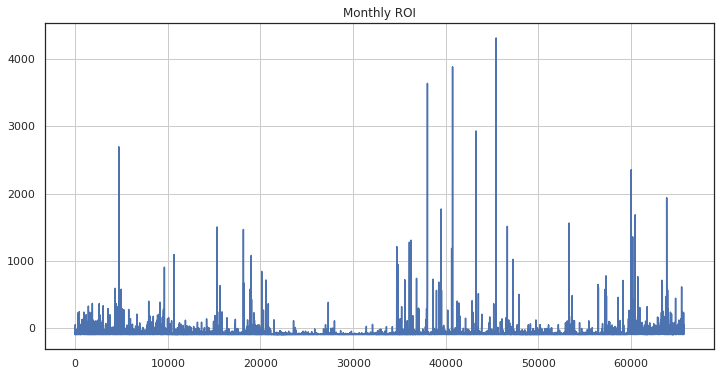

In [233]:
visits_costs_merge['roi'].plot(grid = True, figsize = (12,6))
plt.title('Monthly ROI')        
plt.show()

In [234]:
# ROI for each source
orders['buy_ts'] = pd.to_datetime(orders['buy_ts'])
costs['dt'] = pd.to_datetime(costs['dt'])

orders['order_month'] = orders['buy_ts'].astype('datetime64[M]')
costs['month'] = costs['dt'].astype('datetime64[M]')

first_orders = orders.groupby('uid').agg({'order_month': 'min'}).reset_index()
first_orders.columns = ['uid', 'first_order_month']

cohort_sizes = (
    first_orders.groupby('first_order_month')
    .agg({'uid': 'nunique'})
    .reset_index()
)
cohort_sizes.columns = ['first_order_month', 'n_buyers']

margin_rate = 0.4

orders_ = pd.merge(orders, first_orders, on='uid')
cohorts = (
    orders_.groupby(['first_order_month', 'order_month'])
    .agg({'revenue': 'sum'})
    .reset_index()
)
report = pd.merge(cohort_sizes, cohorts, on='first_order_month')

report['gp'] = report['revenue'] * margin_rate
report['age'] = (
    report['order_month'] - report['first_order_month']
) / np.timedelta64(1, 'M')
report['age'] = report['age'].round().astype('int')

report['ltv'] = report['gp'] / report['n_buyers']

result = report.pivot_table(
    index='first_order_month', columns='age', values='ltv', aggfunc='mean'
).round()

result = result.fillna('')

monthly_costs = costs.groupby('month').sum() # calculate monthly costs
report_ = pd.merge(report, monthly_costs, left_on='first_order_month', right_on='month') # add monthly costs to the cohort report
report_['cac'] = report_['costs'] / report_['n_buyers'] # calculate CAC
# report_['roi'] = report_['ltv'] / report_['cac'] # calculate ROI
report_['roi'] = (report_['revenue'] - report_['costs']) * 100 / report_['costs'] # calculate ROI
print(report_)

print('Revenue total:', (report_['revenue'].sum()).round(2))
print('Costs total:', (report_['costs'].sum()).round(2))

   first_order_month  n_buyers order_month   revenue        gp  age       ltv  \
0         2017-06-01      2023  2017-06-01   9557.49  3822.996    0  1.889766   
1         2017-06-01      2023  2017-07-01    981.82   392.728    1  0.194131   
2         2017-06-01      2023  2017-08-01    885.34   354.136    2  0.175055   
3         2017-06-01      2023  2017-09-01   1931.30   772.520    3  0.381869   
4         2017-06-01      2023  2017-10-01   2068.58   827.432    4  0.409012   
..               ...       ...         ...       ...       ...  ...       ...   
73        2018-03-01      3533  2018-04-01   1063.05   425.220    1  0.120357   
74        2018-03-01      3533  2018-05-01   1114.87   445.948    2  0.126224   
75        2018-04-01      2276  2018-04-01  10600.69  4240.276    0  1.863039   
76        2018-04-01      2276  2018-05-01   1209.92   483.968    1  0.212640   
77        2018-05-01      2988  2018-05-01  13925.76  5570.304    0  1.864225   

    source_id     costs    

In [235]:
# ROI for each source
report_['roi']

0    -46.947044
1    -94.549986
2    -95.085540
3    -89.279489
4    -88.517458
        ...    
73   -96.504881
74   -96.334506
75   -52.440624
76   -94.571765
77   -37.339854
Name: roi, Length: 78, dtype: float64

In [236]:
orders['buy_ts'] = pd.to_datetime(orders['buy_ts'])
costs['dt'] = pd.to_datetime(costs['dt'])

orders['order_month'] = orders['buy_ts'].astype('datetime64[M]')
costs['month'] = costs['dt'].astype('datetime64[M]')

first_orders = orders.groupby('uid').agg({'order_month': 'min'}).reset_index()
first_orders.columns = ['uid', 'first_order_month']

cohort_sizes = (
    first_orders.groupby('first_order_month')
    .agg({'uid': 'nunique'})
    .reset_index()
)
cohort_sizes.columns = ['first_order_month', 'n_buyers']

margin_rate = 0.4

orders_ = pd.merge(orders, first_orders, on='uid')
cohorts = (
    orders_.groupby(['first_order_month', 'order_month'])
    .agg({'revenue': 'sum'})
    .reset_index()
)
report = pd.merge(cohort_sizes, cohorts, on='first_order_month')

report['gp'] = report['revenue'] * margin_rate
report['age'] = (
    report['order_month'] - report['first_order_month']
) / np.timedelta64(1, 'M')
report['age'] = report['age'].round().astype('int')

report['ltv'] = report['gp'] / report['n_buyers']

result = report.pivot_table(
    index='first_order_month', columns='age', values='ltv', aggfunc='mean'
).round()

result = result.fillna('')

monthly_costs = costs.groupby('month').sum() # calculate monthly costs
report_ = pd.merge(report, monthly_costs, left_on='first_order_month', right_on='month') # add monthly costs to the cohort report
report_['cac'] = report_['costs'] / report_['n_buyers'] # calculate CAC
report_['roi'] = (report_['revenue'] - report_['costs']) * 100 / report_['costs'] # calculate ROI

output = report_.pivot_table(
    index='first_order_month', columns='age', values='roi', aggfunc='mean') # form a new pivot table

# print the pivot table with the cumulative ROMI calculated

print(output.cumsum(axis=1).round(2).fillna(''))
# print(output.fillna(''))

age                   0       1       2       3       4       5       6   \
first_order_month                                                          
2017-06-01        -46.95  -141.5 -236.58 -325.86 -414.38 -506.12 -595.45   
2017-07-01        -36.64  -133.1 -226.53 -322.75 -420.88 -519.24 -617.97   
2017-08-01        -51.13 -146.75 -242.51 -338.88 -434.31 -531.68 -629.73   
2017-09-01        -40.22 -128.38 -222.86 -280.75 -376.51 -469.66 -562.23   
2017-10-01        -40.21 -133.81 -231.53 -329.65 -427.84  -526.4 -625.39   
2017-11-01        -44.51 -140.21 -238.06 -334.56 -432.97 -532.39 -631.15   
2017-12-01        -45.80 -142.82 -232.24 -320.05 -416.47  -512.6           
2018-01-01        -58.38 -155.42 -252.35 -350.92 -450.29                   
2018-02-01        -53.62 -150.51 -249.64 -348.81                           
2018-03-01        -43.79  -140.3 -236.63                                   
2018-04-01        -52.44 -147.01                                           
2018-05-01  

In [237]:
output = report_.pivot_table(
    index='first_order_month', columns='age', values='roi', aggfunc='mean') # form a new pivot table

# print the pivot table with the cumulative ROMI calculated

print(output.cumsum(axis=1).round(2).fillna(''))
# print(output.fillna(''))

age                   0       1       2       3       4       5       6   \
first_order_month                                                          
2017-06-01        -46.95  -141.5 -236.58 -325.86 -414.38 -506.12 -595.45   
2017-07-01        -36.64  -133.1 -226.53 -322.75 -420.88 -519.24 -617.97   
2017-08-01        -51.13 -146.75 -242.51 -338.88 -434.31 -531.68 -629.73   
2017-09-01        -40.22 -128.38 -222.86 -280.75 -376.51 -469.66 -562.23   
2017-10-01        -40.21 -133.81 -231.53 -329.65 -427.84  -526.4 -625.39   
2017-11-01        -44.51 -140.21 -238.06 -334.56 -432.97 -532.39 -631.15   
2017-12-01        -45.80 -142.82 -232.24 -320.05 -416.47  -512.6           
2018-01-01        -58.38 -155.42 -252.35 -350.92 -450.29                   
2018-02-01        -53.62 -150.51 -249.64 -348.81                           
2018-03-01        -43.79  -140.3 -236.63                                   
2018-04-01        -52.44 -147.01                                           
2018-05-01  

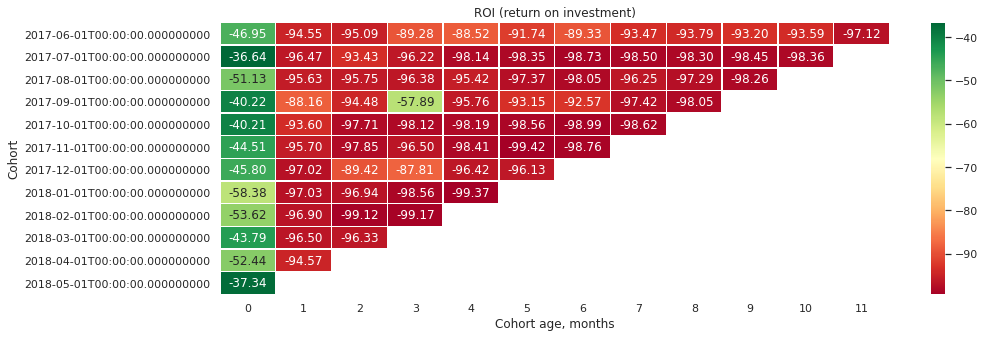

In [238]:
plt.figure(figsize=(15, 5))
plt.title('ROI (return on investment)')
sns.heatmap(output, annot=True, fmt=".2f", linewidths=.5, cmap = 'RdYlGn')
plt.xlabel('Cohort age, months')
plt.ylabel('Cohort')
plt.show()

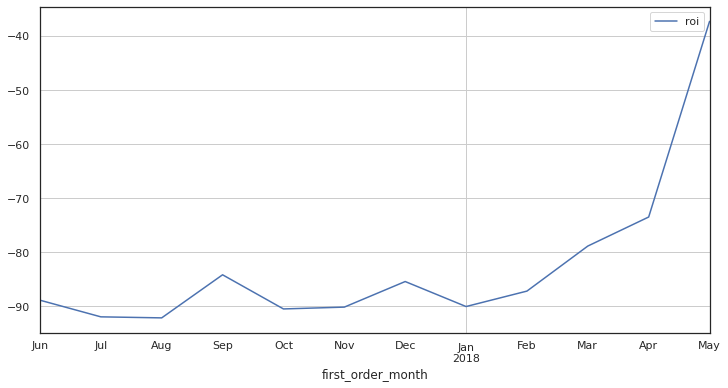

In [239]:
output = report_.pivot_table(
    index='first_order_month', values='roi', aggfunc='mean').plot(grid = True, figsize = (12, 6)) # form a new pivot table


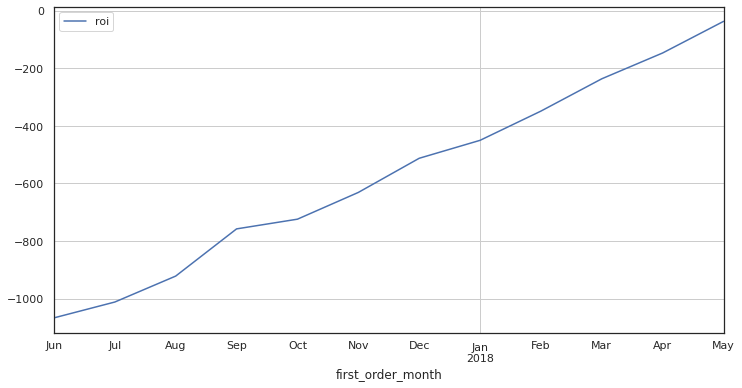

In [240]:
output = report_.pivot_table(
    index='first_order_month', values='roi', aggfunc='sum').plot(grid = True, figsize = (12, 6)) # form a new pivot table


###### Conclusion

When ROI calculations yield a positive figure, it means that total returns exceed total costs. Where as when ROI calculations yield a negative figure, it means that total costs exceed total return.

From the above calculations ROI of the cohort is negative. A negative return occurs when a company experiences a financial loss or investors experience a loss in the value of their investments during a specific period of time. In other words, the business or individual loses money on either their business or their investment.

In [241]:
# find first source per user in visits
first_visits = visits.groupby('uid').agg({'source_id': 'min'}).reset_index()
first_visits.columns = ['uid', 'source_id']
first_visits.head() 

,uid,source_id
0,11863502262781,3
1,49537067089222,2
2,297729379853735,3
3,313578113262317,2
4,325320750514679,5


In [242]:
# find first order month and first order day in orders
first_orders = orders.groupby('uid').agg({'order_month': 'min'}).reset_index()
first_orders.columns = ['uid', 'first_order_month']
first_orders.head() 

,uid,first_order_month
0,313578113262317,2018-01-01
1,1575281904278712,2017-06-01
2,2429014661409475,2017-10-01
3,2464366381792757,2018-01-01
4,2551852515556206,2017-11-01


In [243]:
# find first source per user in visits
visits_uid = visits[['source_id', 'first_activity_month', 'uid']]
visits_uid.head()

,source_id,first_activity_month,uid
0,4,2017-12-01,16879256277535980062
1,2,2018-02-01,104060357244891740
2,5,2017-07-01,7459035603376831527
3,9,2018-03-01,16174680259334210214
4,3,2017-12-01,9969694820036681168


In [244]:
# find first order month and first order day in orders
orders_first_order = orders[['order_date', 'order_month', 'uid', 'revenue']]
orders_first_order.head()

,order_date,order_month,uid,revenue
0,2017-06-01,2017-06-01,10329302124590727494,17.00
1,2017-06-01,2017-06-01,11627257723692907447,0.55
2,2017-06-01,2017-06-01,17903680561304213844,0.37
3,2017-06-01,2017-06-01,16109239769442553005,0.55
4,2017-06-01,2017-06-01,14200605875248379450,0.37


In [245]:
# merge tables
visits_orders_uid = pd.merge(visits_uid, orders_first_order, on='uid')
visits_orders_uid

,source_id,first_activity_month,uid,order_date,order_month,revenue
0,9,2018-03-01,16174680259334210214,2018-03-09,2018-03-01,2.33
1,4,2018-03-01,16174680259334210214,2018-03-09,2018-03-01,2.33
2,5,2017-09-01,16007536194108375387,2017-09-04,2017-09-01,2.44
3,5,2017-09-01,16007536194108375387,2017-10-28,2017-10-01,1.53
4,5,2017-09-01,16007536194108375387,2017-10-28,2017-10-01,1.53
...,...,...,...,...,...,...
761802,3,2017-12-01,6752020629696526518,2017-12-04,2017-12-01,4.15
761803,4,2017-11-01,11750532881998794555,2017-11-20,2017-11-01,3.67
761804,4,2017-11-01,11202626539189016002,2017-11-29,2017-11-01,3.05
761805,10,2018-04-01,12734910664455613822,2018-04-23,2018-04-01,0.49


In [246]:
# Group new table by source id and first order day  and count uid
visits_by_source = (visits_orders_uid.groupby(['source_id', 'order_date', 'revenue'], as_index=False).agg({'uid': 'count'}))
visits_by_source.head()

,source_id,order_date,revenue,uid
0,1,2017-06-01,0.15,1
1,1,2017-06-01,0.24,5
2,1,2017-06-01,0.37,3
3,1,2017-06-01,0.61,30
4,1,2017-06-01,0.73,9


In [247]:
visits_by_source = visits.groupby('source_id')['uid'].count()
visits_by_source

source_id
1      34121
2      47626
3      85610
4     101794
5      66905
6          6
7         36
9      13277
10     10025
Name: uid, dtype: int64

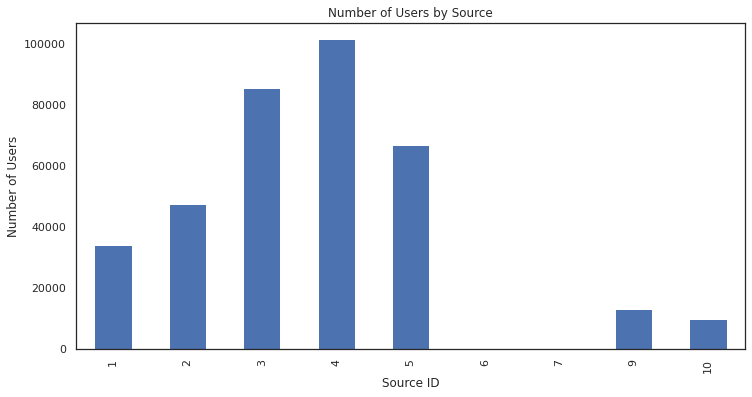

In [248]:
visits_by_source .plot(kind = 'bar', figsize = (12,6))
plt.title('Number of Users by Source')
plt.xlabel('Source ID')
plt.ylabel('Number of Users')
plt.show()

In [249]:
# 
costs_source = costs.groupby(['source_id'])['costs'].sum().reset_index()
costs_source

,source_id,costs
0,1,20833.27
1,2,42806.04
2,3,141321.63
3,4,61073.60
4,5,51757.10
5,9,5517.49
6,10,5822.49


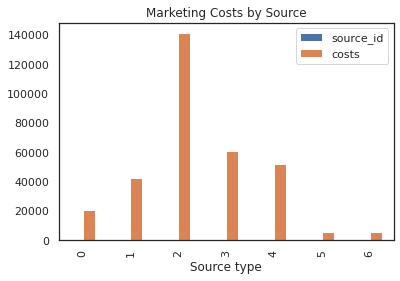

In [250]:
costs_source.plot(kind = 'bar')
plt.title('Marketing Costs by Source')
plt.xlabel('Source type')
plt.show()

In [251]:
# calculate cac per source
visits_costs_merge['cac'] = visits_costs_merge['costs'] / visits_costs_merge['uid']
visits_costs_merge['cac']

0        75.200000
1        15.040000
2        25.066667
3         2.506667
4         8.355556
           ...    
65683     8.800000
65684    17.600000
65685     5.866667
65686    17.600000
65687     8.800000
Name: cac, Length: 65688, dtype: float64

In [252]:
# plot a graph by month per source
visits_costs_merge_pivot= visits_costs_merge.pivot_table(
    index='month', 
    columns='source_id', 
    values='cac', 
    aggfunc='mean')


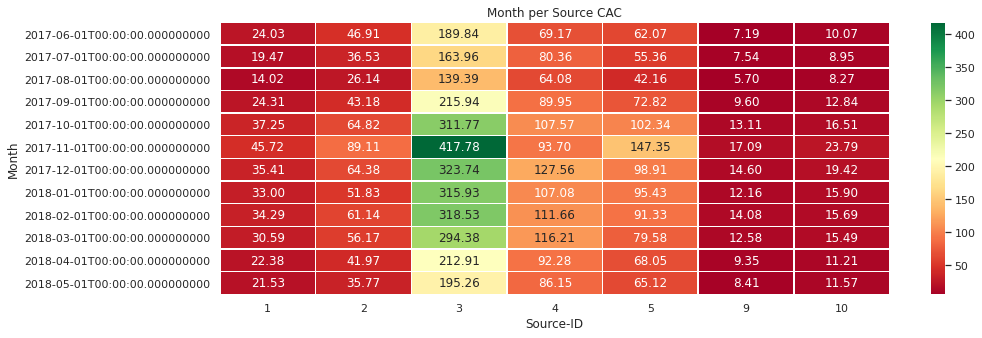

In [253]:
plt.figure(figsize=(15, 5))
plt.title('Month per Source CAC')
sns.heatmap(visits_costs_merge_pivot, annot=True, fmt=".2f", linewidths=.5, cmap = 'RdYlGn')
plt.xlabel('Source-ID')
plt.ylabel('Month')
plt.show()

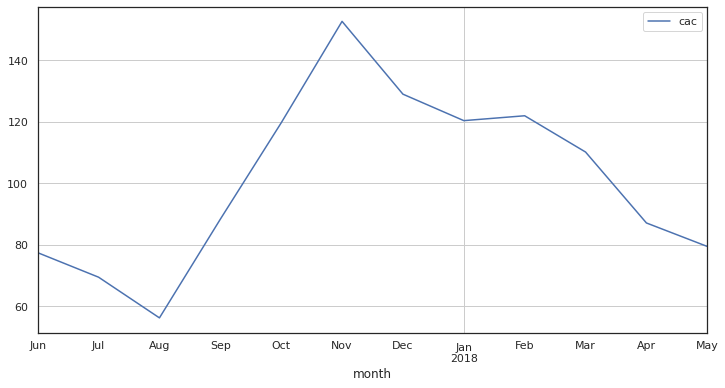

In [254]:
visits_costs_merge_pivot= visits_costs_merge.pivot_table(
    index='month', 
    values='cac', 
    aggfunc='mean').plot(grid = True, figsize = (12, 6))


CAC is maximum on November 2017.

In [255]:
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   buy_ts                50415 non-null  datetime64[ns]
 1   revenue               50415 non-null  float64       
 2   uid                   50415 non-null  uint64        
 3   order_month           50415 non-null  datetime64[ns]
 4   order_year            50415 non-null  datetime64[ns]
 5   order_week            50415 non-null  datetime64[ns]
 6   order_date            50415 non-null  datetime64[ns]
 7   order_month_activity  50415 non-null  datetime64[ns]
dtypes: datetime64[ns](6), float64(1), uint64(1)
memory usage: 3.1 MB


In [256]:
first_orders = orders.groupby('uid').agg({'buy_ts': 'min'}).reset_index()
first_orders.columns = ['uid', 'first_buy_ts']
first_orders['first_order_dt'] = first_orders['first_buy_ts'].dt.date
first_orders['first_order_dt'].head()

0    2018-01-03
1    2017-06-03
2    2017-10-11
3    2018-01-28
4    2017-11-24
Name: first_order_dt, dtype: object

In [257]:
first_orders['first_order_dt'] = first_orders['first_buy_ts'].dt.date
first_orders['first_order_dt'].head()


0    2018-01-03
1    2017-06-03
2    2017-10-11
3    2018-01-28
4    2017-11-24
Name: first_order_dt, dtype: object

In [258]:
sources = visits.sort_values('start_ts').groupby('uid').first()
sources = sources[['source_id']]
sources_orders = pd.merge(first_orders, sources, left_on='uid', right_index=True)
sources_orders.head()


,uid,first_buy_ts,first_order_dt,source_id
0,313578113262317,2018-01-03 21:51:00,2018-01-03,2
1,1575281904278712,2017-06-03 10:13:00,2017-06-03,10
2,2429014661409475,2017-10-11 18:33:00,2017-10-11,3
3,2464366381792757,2018-01-28 15:54:00,2018-01-28,5
4,2551852515556206,2017-11-24 10:14:00,2017-11-24,5


In [259]:
sources

,source_id
uid,
11863502262781,3
49537067089222,2
297729379853735,3
313578113262317,2
325320750514679,5
...,...
18446403737806311543,5
18446424184725333426,4
18446556406699109058,3


In [260]:
buyers_daily = sources_orders.groupby(['source_id', 'first_order_dt']).agg({'uid': 'count'}).reset_index()
buyers_daily.rename(columns={'uid': 'n_buyers'}, inplace=True)
buyers_daily['first_order_dt'] = pd.to_datetime(buyers_daily['first_order_dt'])
costs_ = pd.merge(buyers_daily, costs, left_on=['source_id', 'first_order_dt'], right_on=['source_id', 'dt'])
costs_['cac'] = costs_['costs']/costs_['n_buyers']
costs_['cac']


0        5.371429
1        8.892857
2        5.218571
3       18.333333
4        3.171111
          ...    
2428     4.960000
2429     2.126000
2430     1.617143
2431     6.630000
2432     0.502857
Name: cac, Length: 2433, dtype: float64

In [261]:
costs_

,source_id,first_order_dt,n_buyers,dt,costs,month,cac
0,1,2017-06-01,14,2017-06-01,75.20,2017-06-01,5.371429
1,1,2017-06-02,7,2017-06-02,62.25,2017-06-01,8.892857
2,1,2017-06-03,7,2017-06-03,36.53,2017-06-01,5.218571
3,1,2017-06-04,3,2017-06-04,55.00,2017-06-01,18.333333
4,1,2017-06-05,18,2017-06-05,57.08,2017-06-01,3.171111
...,...,...,...,...,...,...,...
2428,10,2018-05-27,2,2018-05-27,9.92,2018-05-01,4.960000
2429,10,2018-05-28,10,2018-05-28,21.26,2018-05-01,2.126000
2430,10,2018-05-29,7,2018-05-29,11.32,2018-05-01,1.617143
2431,10,2018-05-30,5,2018-05-30,33.15,2018-05-01,6.630000


In [262]:
costs_ = pd.merge(buyers_daily, costs, left_on=['source_id', 'first_order_dt'], right_on=['source_id', 'dt'])
costs_['cac'] = costs_['costs']/costs_['n_buyers']
costs_['cac'] 

0        5.371429
1        8.892857
2        5.218571
3       18.333333
4        3.171111
          ...    
2428     4.960000
2429     2.126000
2430     1.617143
2431     6.630000
2432     0.502857
Name: cac, Length: 2433, dtype: float64

In [263]:
costs_1 = costs_[costs_['source_id'] == 5]['cac'].sum()
costs_1

3026.233245317447

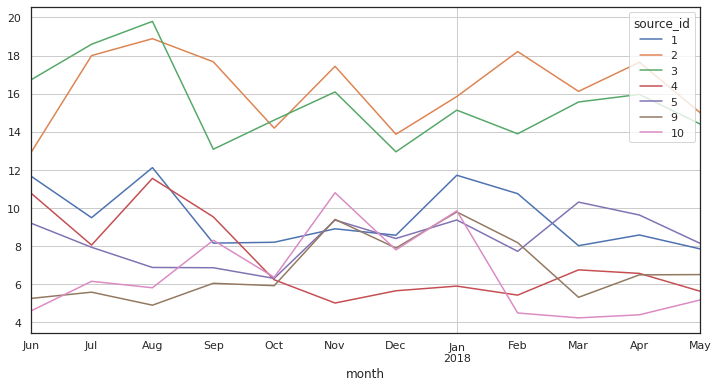

In [264]:
# Pivot and graph
pivot_table_costs_= costs_.pivot_table(
    index='month', 
    columns='source_id',
    values='cac', 
    aggfunc='mean').plot(grid = True, figsize = (12, 6))

In [265]:
orders_ = pd.merge(orders,first_orders, on='uid')
orders_

,buy_ts,revenue,uid,order_month,order_year,order_week,order_date,order_month_activity,first_buy_ts,first_order_dt
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:10:00,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:25:00,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:27:00,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:29:00,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 07:58:00,2017-06-01
...,...,...,...,...,...,...,...,...,...,...
50410,2018-05-31 23:50:00,4.64,12296626599487328624,2018-05-01,2018-01-01,2018-05-31,2018-05-31,2018-05-01,2018-05-31 23:50:00,2018-05-31
50411,2018-05-31 23:50:00,5.80,11369640365507475976,2018-05-01,2018-01-01,2018-05-31,2018-05-31,2018-05-01,2018-05-31 23:50:00,2018-05-31
50412,2018-05-31 23:54:00,0.30,1786462140797698849,2018-05-01,2018-01-01,2018-05-31,2018-05-31,2018-05-01,2018-05-31 23:54:00,2018-05-31
50413,2018-05-31 23:56:00,3.67,3993697860786194247,2018-05-01,2018-01-01,2018-05-31,2018-05-31,2018-05-01,2018-05-31 23:56:00,2018-05-31


In [266]:
get_source = visits[["uid", "source_id"]]
get_source

,uid,source_id
0,16879256277535980062,4
1,104060357244891740,2
2,7459035603376831527,5
3,16174680259334210214,9
4,9969694820036681168,3
...,...,...
359395,18363291481961487539,2
359396,18370831553019119586,1
359397,18387297585500748294,4
359398,18388616944624776485,5


In [267]:
orders_ = orders_.merge(get_source, on= "uid")
orders_

,buy_ts,revenue,uid,order_month,order_year,order_week,order_date,order_month_activity,first_buy_ts,first_order_dt,source_id
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:10:00,2017-06-01,1
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:25:00,2017-06-01,2
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:27:00,2017-06-01,2
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 00:29:00,2017-06-01,2
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01 07:58:00,2017-06-01,3
...,...,...,...,...,...,...,...,...,...,...,...
761802,2018-05-31 23:56:00,3.67,3993697860786194247,2018-05-01,2018-01-01,2018-05-31,2018-05-31,2018-05-01,2018-05-31 23:56:00,2018-05-31,4
761803,2018-05-31 23:56:00,3.67,3993697860786194247,2018-05-01,2018-01-01,2018-05-31,2018-05-31,2018-05-01,2018-05-31 23:56:00,2018-05-31,5
761804,2018-05-31 23:56:00,3.67,3993697860786194247,2018-05-01,2018-01-01,2018-05-31,2018-05-31,2018-05-01,2018-05-31 23:56:00,2018-05-31,3
761805,2018-05-31 23:56:00,3.67,3993697860786194247,2018-05-01,2018-01-01,2018-05-31,2018-05-31,2018-05-01,2018-05-31 23:56:00,2018-05-31,4


In [268]:
cohort_ltv_size = orders_.groupby(['source_id'], as_index=False).agg({'uid':'nunique'}).\
                 rename(columns={'uid':'n_buyers', 'source_id': 'source_id'})
source_revenue = orders_.groupby('source_id').agg({'revenue': 'sum'}).reset_index()
source_ltv_table = cohort_ltv_size.merge(source_revenue, on='source_id')
margin_rate = 0.5

source_ltv_table['gp'] = source_ltv_table['revenue'] * margin_rate

source_ltv_table['ltv'] = source_ltv_table['gp'] / source_ltv_table['n_buyers']
source_ltv_table['ltv']

0    160.983481
1    180.574210
2     10.713851
3     17.424057
4     58.166460
5      0.610000
6      6.505952
7      4.122738
Name: ltv, dtype: float64

In [269]:
source_ltv_table

,source_id,n_buyers,revenue,gp,ltv
0,1,7138,2.298200e+06,1.149100e+06,160.983481
1,2,7305,2.638189e+06,1.319095e+06,180.574210
2,3,13846,2.966880e+05,1.483440e+05,10.713851
3,4,14253,4.966902e+05,2.483451e+05,17.424057
4,5,10156,1.181477e+06,5.907386e+05,58.166460
5,7,1,1.220000e+00,6.100000e-01,0.610000
6,9,2793,3.634225e+04,1.817112e+04,6.505952
7,10,1773,1.461923e+04,7.309615e+03,4.122738


In [270]:
source_ltv_table['ltv'] = source_ltv_table['revenue'] / source_ltv_table['n_buyers']
source_ltv_table

,source_id,n_buyers,revenue,gp,ltv
0,1,7138,2.298200e+06,1.149100e+06,321.966961
1,2,7305,2.638189e+06,1.319095e+06,361.148420
2,3,13846,2.966880e+05,1.483440e+05,21.427702
3,4,14253,4.966902e+05,2.483451e+05,34.848114
4,5,10156,1.181477e+06,5.907386e+05,116.332920
5,7,1,1.220000e+00,6.100000e-01,1.220000
6,9,2793,3.634225e+04,1.817112e+04,13.011905
7,10,1773,1.461923e+04,7.309615e+03,8.245477


In [271]:
source_ltv_table

,source_id,n_buyers,revenue,gp,ltv
0,1,7138,2.298200e+06,1.149100e+06,321.966961
1,2,7305,2.638189e+06,1.319095e+06,361.148420
2,3,13846,2.966880e+05,1.483440e+05,21.427702
3,4,14253,4.966902e+05,2.483451e+05,34.848114
4,5,10156,1.181477e+06,5.907386e+05,116.332920
5,7,1,1.220000e+00,6.100000e-01,1.220000
6,9,2793,3.634225e+04,1.817112e+04,13.011905
7,10,1773,1.461923e+04,7.309615e+03,8.245477


In [272]:
source_total = costs_.merge(source_ltv_table, on = 'source_id')
source_total

,source_id,first_order_dt,n_buyers_x,dt,costs,month,cac,n_buyers_y,revenue,gp,ltv
0,1,2017-06-01,14,2017-06-01,75.20,2017-06-01,5.371429,7138,2.298200e+06,1149100.085,321.966961
1,1,2017-06-02,7,2017-06-02,62.25,2017-06-01,8.892857,7138,2.298200e+06,1149100.085,321.966961
2,1,2017-06-03,7,2017-06-03,36.53,2017-06-01,5.218571,7138,2.298200e+06,1149100.085,321.966961
3,1,2017-06-04,3,2017-06-04,55.00,2017-06-01,18.333333,7138,2.298200e+06,1149100.085,321.966961
4,1,2017-06-05,18,2017-06-05,57.08,2017-06-01,3.171111,7138,2.298200e+06,1149100.085,321.966961
...,...,...,...,...,...,...,...,...,...,...,...
2428,10,2018-05-27,2,2018-05-27,9.92,2018-05-01,4.960000,1773,1.461923e+04,7309.615,8.245477
2429,10,2018-05-28,10,2018-05-28,21.26,2018-05-01,2.126000,1773,1.461923e+04,7309.615,8.245477
2430,10,2018-05-29,7,2018-05-29,11.32,2018-05-01,1.617143,1773,1.461923e+04,7309.615,8.245477
2431,10,2018-05-30,5,2018-05-30,33.15,2018-05-01,6.630000,1773,1.461923e+04,7309.615,8.245477


In [273]:
source_total = costs_.merge(source_ltv_table, on = 'source_id')
source_total['cac'] = source_total['costs'] / source_total['n_buyers_x']
source_total['romi'] = source_total['ltv'] / source_total['cac']
source_total

,source_id,first_order_dt,n_buyers_x,dt,costs,month,cac,n_buyers_y,revenue,gp,ltv,romi
0,1,2017-06-01,14,2017-06-01,75.20,2017-06-01,5.371429,7138,2.298200e+06,1149100.085,321.966961,59.940658
1,1,2017-06-02,7,2017-06-02,62.25,2017-06-01,8.892857,7138,2.298200e+06,1149100.085,321.966961,36.205120
2,1,2017-06-03,7,2017-06-03,36.53,2017-06-01,5.218571,7138,2.298200e+06,1149100.085,321.966961,61.696379
3,1,2017-06-04,3,2017-06-04,55.00,2017-06-01,18.333333,7138,2.298200e+06,1149100.085,321.966961,17.561834
4,1,2017-06-05,18,2017-06-05,57.08,2017-06-01,3.171111,7138,2.298200e+06,1149100.085,321.966961,101.531277
...,...,...,...,...,...,...,...,...,...,...,...,...
2428,10,2018-05-27,2,2018-05-27,9.92,2018-05-01,4.960000,1773,1.461923e+04,7309.615,8.245477,1.662394
2429,10,2018-05-28,10,2018-05-28,21.26,2018-05-01,2.126000,1773,1.461923e+04,7309.615,8.245477,3.878399
2430,10,2018-05-29,7,2018-05-29,11.32,2018-05-01,1.617143,1773,1.461923e+04,7309.615,8.245477,5.098793
2431,10,2018-05-30,5,2018-05-30,33.15,2018-05-01,6.630000,1773,1.461923e+04,7309.615,8.245477,1.243662


In [274]:
source_total = costs_.merge(source_ltv_table, on = 'source_id')
source_total['romi'] = source_total['ltv'] / source_total['cac']
source_total['romi']

0        59.940658
1        36.205120
2        61.696379
3        17.561834
4       101.531277
           ...    
2428      1.662394
2429      3.878399
2430      5.098793
2431      1.243662
2432     16.397255
Name: romi, Length: 2433, dtype: float64

In [275]:
source_total

,source_id,first_order_dt,n_buyers_x,dt,costs,month,cac,n_buyers_y,revenue,gp,ltv,romi
0,1,2017-06-01,14,2017-06-01,75.20,2017-06-01,5.371429,7138,2.298200e+06,1149100.085,321.966961,59.940658
1,1,2017-06-02,7,2017-06-02,62.25,2017-06-01,8.892857,7138,2.298200e+06,1149100.085,321.966961,36.205120
2,1,2017-06-03,7,2017-06-03,36.53,2017-06-01,5.218571,7138,2.298200e+06,1149100.085,321.966961,61.696379
3,1,2017-06-04,3,2017-06-04,55.00,2017-06-01,18.333333,7138,2.298200e+06,1149100.085,321.966961,17.561834
4,1,2017-06-05,18,2017-06-05,57.08,2017-06-01,3.171111,7138,2.298200e+06,1149100.085,321.966961,101.531277
...,...,...,...,...,...,...,...,...,...,...,...,...
2428,10,2018-05-27,2,2018-05-27,9.92,2018-05-01,4.960000,1773,1.461923e+04,7309.615,8.245477,1.662394
2429,10,2018-05-28,10,2018-05-28,21.26,2018-05-01,2.126000,1773,1.461923e+04,7309.615,8.245477,3.878399
2430,10,2018-05-29,7,2018-05-29,11.32,2018-05-01,1.617143,1773,1.461923e+04,7309.615,8.245477,5.098793
2431,10,2018-05-30,5,2018-05-30,33.15,2018-05-01,6.630000,1773,1.461923e+04,7309.615,8.245477,1.243662


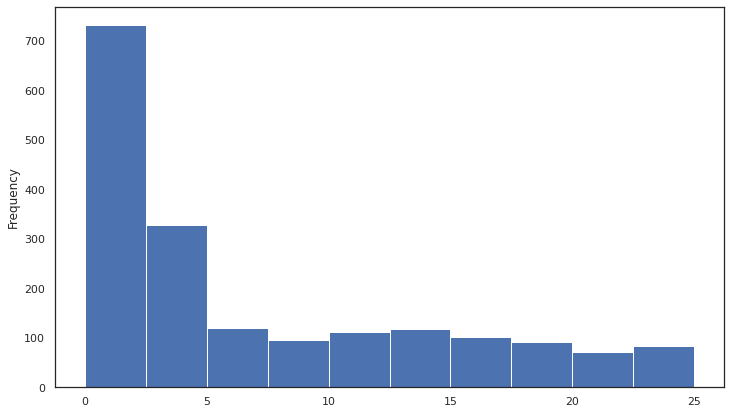

In [276]:
source_total['romi'].plot(kind='hist', bins=10, range = (0, 25), figsize=(12,7))
plt.show()


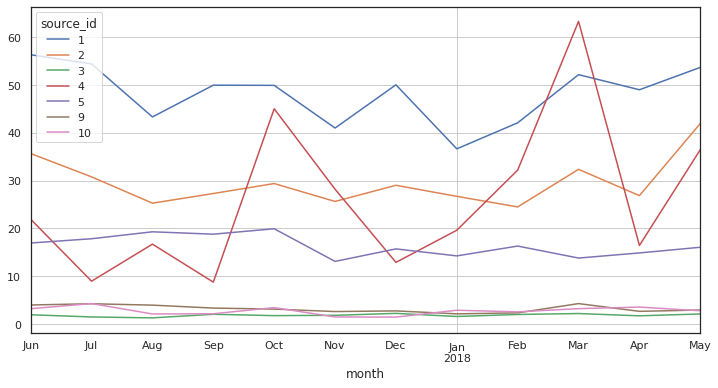

In [277]:
source_total_pivot = source_total.pivot_table(
    index='month', 
    columns='source_id',
    values='romi', 
    aggfunc='mean').plot(grid = True, figsize = (12, 6))

In [278]:
source_total

,source_id,first_order_dt,n_buyers_x,dt,costs,month,cac,n_buyers_y,revenue,gp,ltv,romi
0,1,2017-06-01,14,2017-06-01,75.20,2017-06-01,5.371429,7138,2.298200e+06,1149100.085,321.966961,59.940658
1,1,2017-06-02,7,2017-06-02,62.25,2017-06-01,8.892857,7138,2.298200e+06,1149100.085,321.966961,36.205120
2,1,2017-06-03,7,2017-06-03,36.53,2017-06-01,5.218571,7138,2.298200e+06,1149100.085,321.966961,61.696379
3,1,2017-06-04,3,2017-06-04,55.00,2017-06-01,18.333333,7138,2.298200e+06,1149100.085,321.966961,17.561834
4,1,2017-06-05,18,2017-06-05,57.08,2017-06-01,3.171111,7138,2.298200e+06,1149100.085,321.966961,101.531277
...,...,...,...,...,...,...,...,...,...,...,...,...
2428,10,2018-05-27,2,2018-05-27,9.92,2018-05-01,4.960000,1773,1.461923e+04,7309.615,8.245477,1.662394
2429,10,2018-05-28,10,2018-05-28,21.26,2018-05-01,2.126000,1773,1.461923e+04,7309.615,8.245477,3.878399
2430,10,2018-05-29,7,2018-05-29,11.32,2018-05-01,1.617143,1773,1.461923e+04,7309.615,8.245477,5.098793
2431,10,2018-05-30,5,2018-05-30,33.15,2018-05-01,6.630000,1773,1.461923e+04,7309.615,8.245477,1.243662


In [281]:
source_total['roi'] = (source_total['revenue'] - source_total['costs']) * 100 / source_total['costs']
source_total['roi']

0       3.056017e+06
1       3.691788e+06
2       6.291168e+06
3       4.178446e+06
4       4.026179e+06
            ...     
2428    1.472713e+05
2429    6.866402e+04
2430    1.290451e+05
2431    4.400024e+04
2432    8.296381e+04
Name: roi, Length: 2433, dtype: float64

In [280]:
source_total

,source_id,first_order_dt,n_buyers_x,dt,costs,month,cac,n_buyers_y,revenue,gp,ltv,romi
0,1,2017-06-01,14,2017-06-01,75.20,2017-06-01,5.371429,7138,2.298200e+06,1149100.085,321.966961,59.940658
1,1,2017-06-02,7,2017-06-02,62.25,2017-06-01,8.892857,7138,2.298200e+06,1149100.085,321.966961,36.205120
2,1,2017-06-03,7,2017-06-03,36.53,2017-06-01,5.218571,7138,2.298200e+06,1149100.085,321.966961,61.696379
3,1,2017-06-04,3,2017-06-04,55.00,2017-06-01,18.333333,7138,2.298200e+06,1149100.085,321.966961,17.561834
4,1,2017-06-05,18,2017-06-05,57.08,2017-06-01,3.171111,7138,2.298200e+06,1149100.085,321.966961,101.531277
...,...,...,...,...,...,...,...,...,...,...,...,...
2428,10,2018-05-27,2,2018-05-27,9.92,2018-05-01,4.960000,1773,1.461923e+04,7309.615,8.245477,1.662394
2429,10,2018-05-28,10,2018-05-28,21.26,2018-05-01,2.126000,1773,1.461923e+04,7309.615,8.245477,3.878399
2430,10,2018-05-29,7,2018-05-29,11.32,2018-05-01,1.617143,1773,1.461923e+04,7309.615,8.245477,5.098793
2431,10,2018-05-30,5,2018-05-30,33.15,2018-05-01,6.630000,1773,1.461923e+04,7309.615,8.245477,1.243662


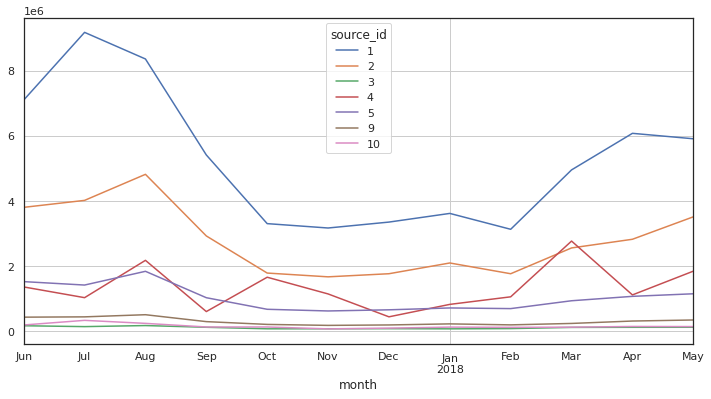

In [283]:
source_total_roi_pivot = source_total.pivot_table(
    index='month', 
    columns='source_id',
    values='roi', 
    aggfunc='mean').plot(grid = True, figsize = (12, 6))

In [284]:
#start from first order month
first_orders = orders.groupby('uid').agg({'buy_ts': 'min'}).reset_index()
first_orders.columns = ['uid', 'first_order_ts']
first_orders['first_order_month'] = first_orders['first_order_ts'].astype('datetime64[M]')

In [285]:
#find first source
users = visits.sort_values('start_ts').groupby('uid').first()
users = users[['source_id']]

#merge
buyers = pd.merge(first_orders, users, left_on='uid', right_index=True)

In [286]:
#we need new ltv

for source, df in buyers.groupby('source_id'):

    #number of buyers
    cohort_sizes = df.groupby('first_order_month').agg({'uid': 'nunique'}).reset_index()
    cohort_sizes.rename(columns={'uid': 'n_buyers_x'}, inplace=True)

    #sum of revenue
    cohorts = pd.merge(orders, df, how='inner', on='uid')\
                .groupby(['first_order_month', 'order_month'])\
                .agg({'revenue': ['sum', 'count']}).reset_index()

    #age calculation
    cohorts['age_month'] = ((cohorts['order_month'] - cohorts['first_order_month']) / np.timedelta64(1,'M')).round()
    cohorts.columns = ['first_order_month', 'order_month', 'revenue', 'n_orders', 'age_month']

    #calculate ltv
    cohorts_report = pd.merge(cohort_sizes, cohorts, on = 'first_order_month')
    cohorts_report['ltv'] = cohorts_report['revenue'] / cohorts_report['n_buyers_x']


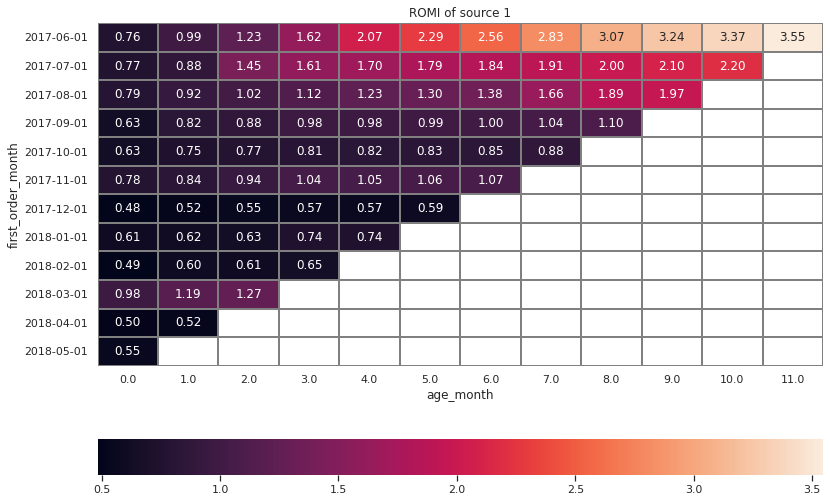

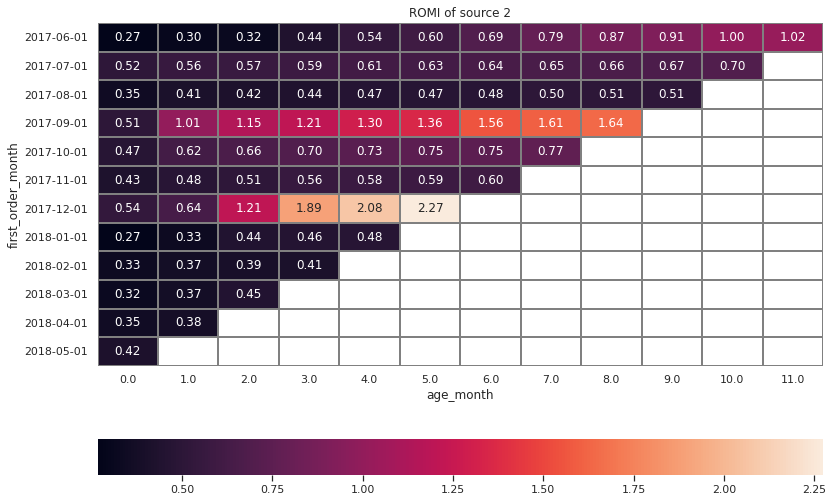

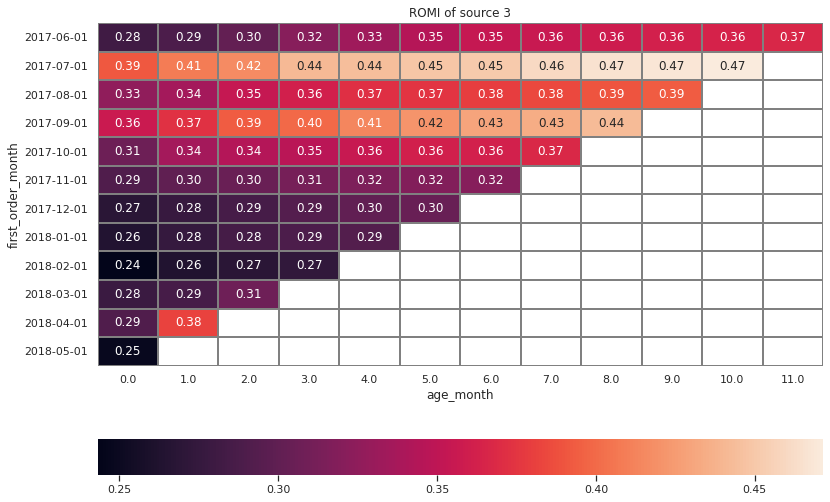

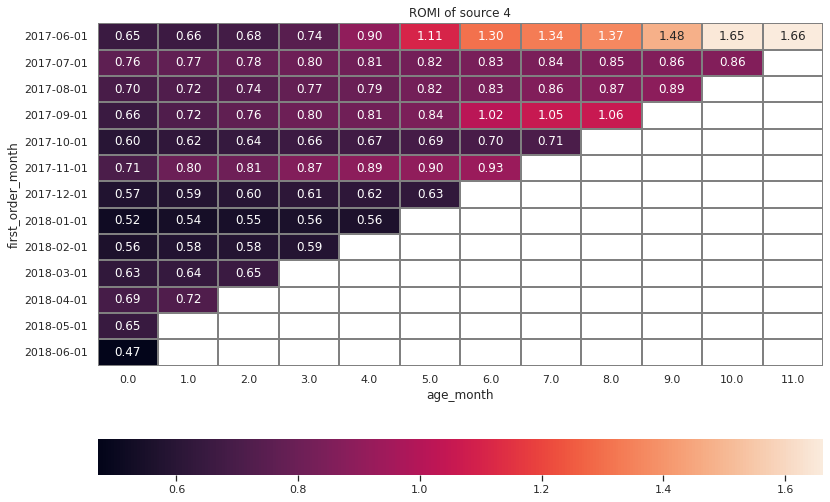

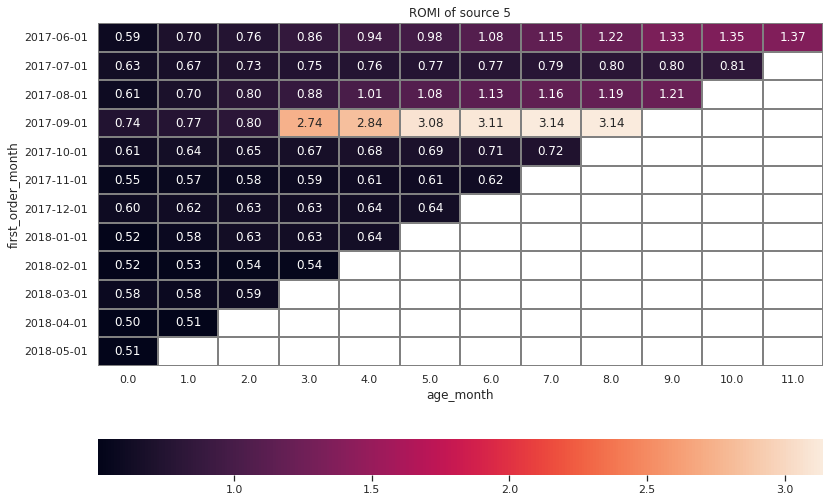

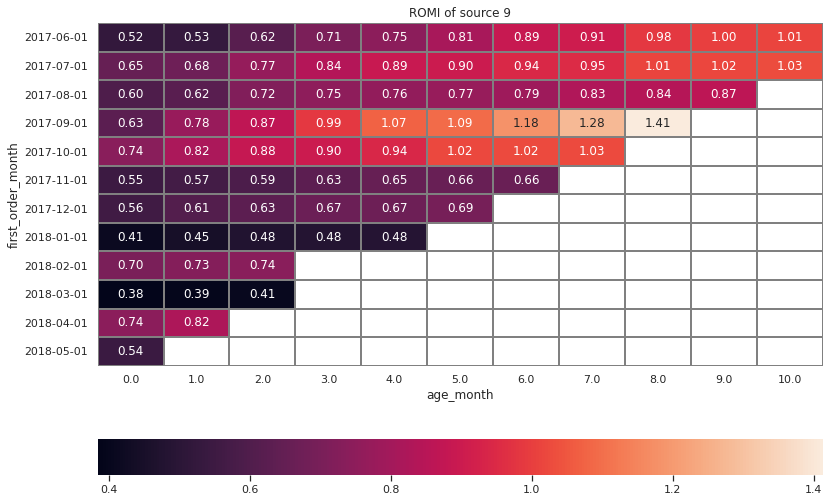

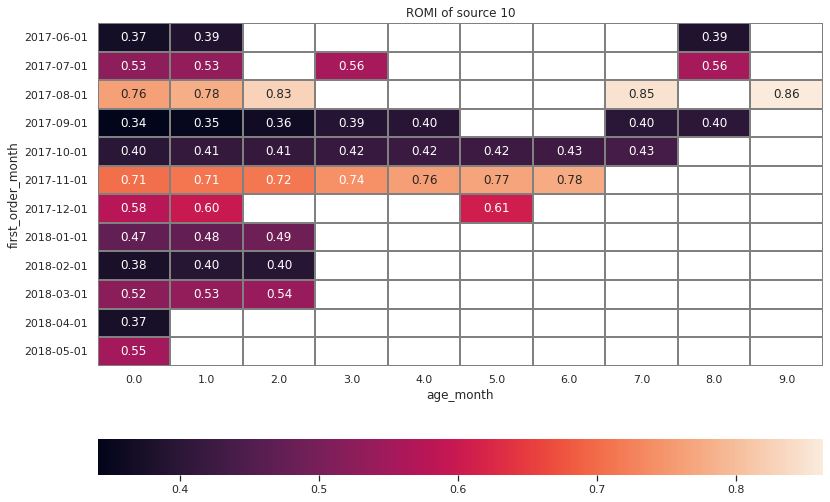

In [287]:
for source, df in buyers.groupby('source_id'):
    
    #we have values in 7 source, but it is not much
    if source == 7:
        continue

    #find number of byuers
    cohort_sizes = df.groupby('first_order_month').agg({'uid': 'nunique'}).reset_index()
    cohort_sizes.rename(columns={'uid': 'n_buyers_x'}, inplace=True)

    #count and sum revenue
    cohorts = pd.merge(orders, df, how='inner', on='uid')\
                .groupby(['first_order_month', 'order_month'])\
                .agg({'revenue': ['sum', 'count']}).reset_index()

    #calculate age
    cohorts['age_month'] = ((cohorts['order_month'] - cohorts['first_order_month']) / np.timedelta64(1,'M')).round()
    cohorts.columns = ['first_order_month', 'order_month', 'revenue', 'n_orders', 'age_month']

    #merge
    cohorts_report = pd.merge(cohort_sizes, cohorts, on = 'first_order_month')

    #take cac from our dataset cac per source
    cac = costs_.groupby('source_id').agg({'cac': 'mean'})['cac'][source]

    #calculate romi
    cohorts_report['romi'] = cohorts_report['revenue'] / cohorts_report['n_buyers_x'] / cac

    cohorts_age = cohorts_report.pivot_table(
        index='first_order_month', 
        columns='age_month', 
        values='romi', 
        aggfunc='sum'
    ).cumsum(axis=1)

    plt.figure(figsize=(13, 9))
    sns.heatmap(cohorts_age, annot=True, fmt='.2f', linewidths=1, linecolor='grey', cbar_kws= {'orientation': 'horizontal'} 
            ).set(title =('ROMI of source {}'.format(source)), yticklabels = cohorts_age.index.astype('str'))
    plt.show()

    

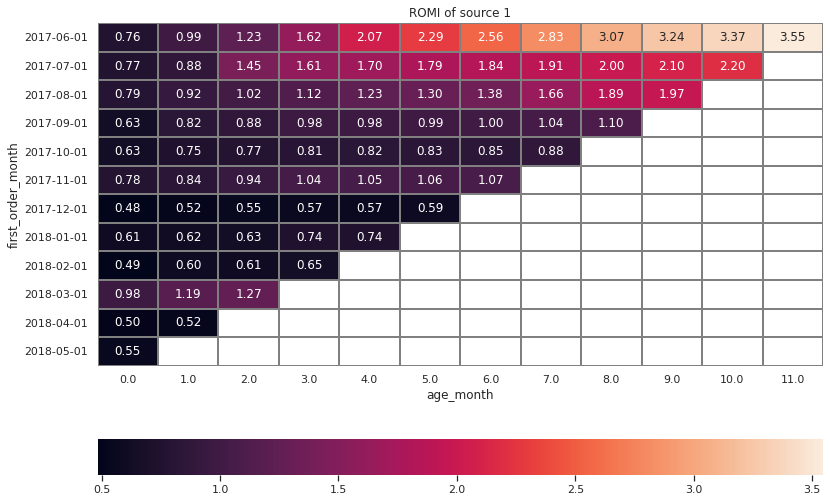

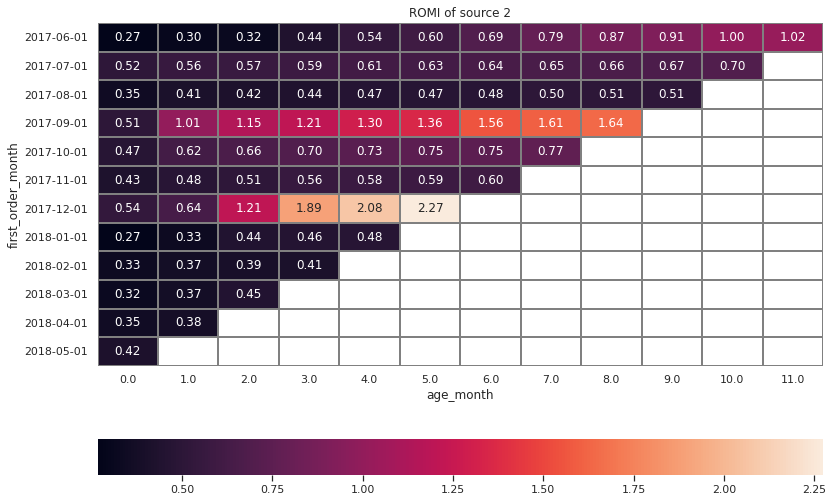

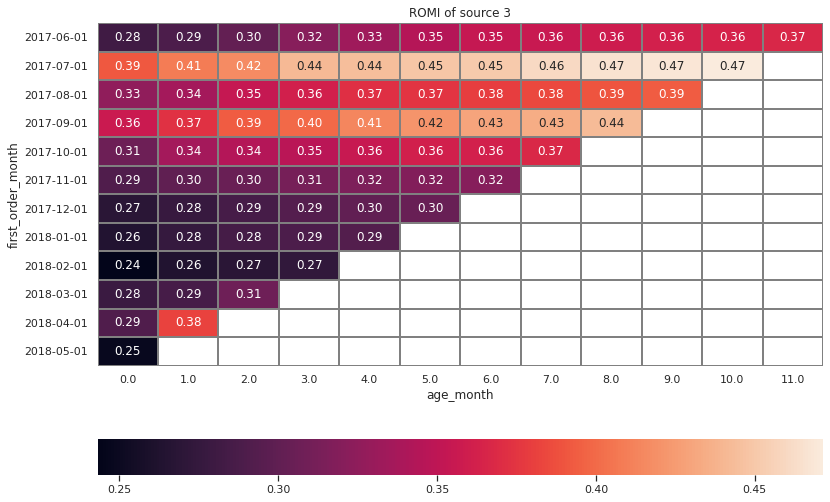

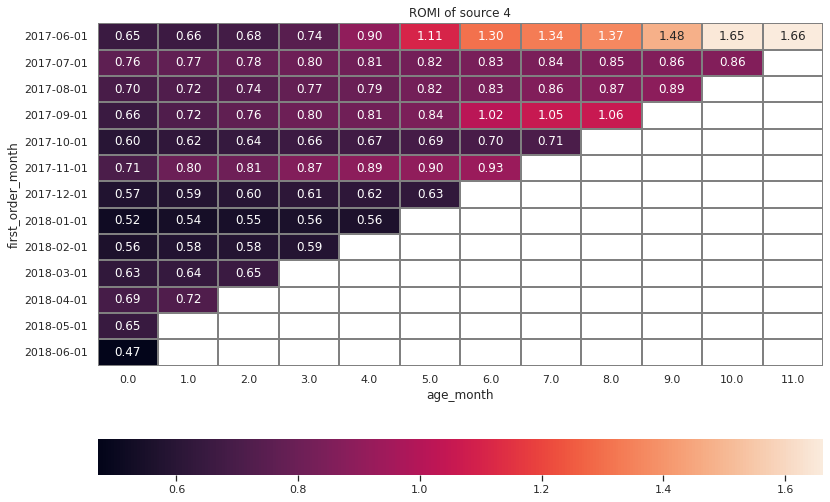

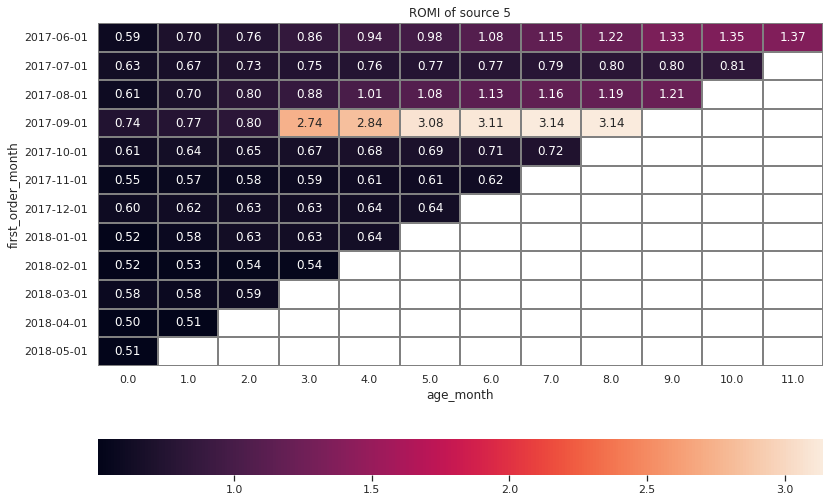

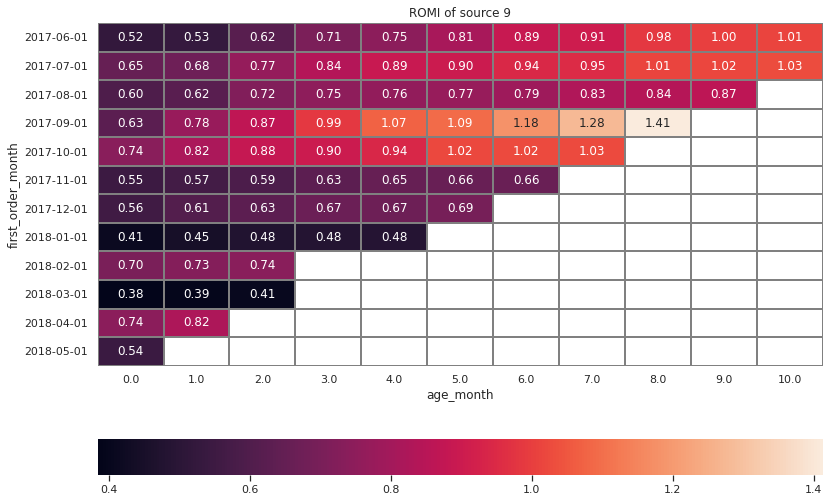

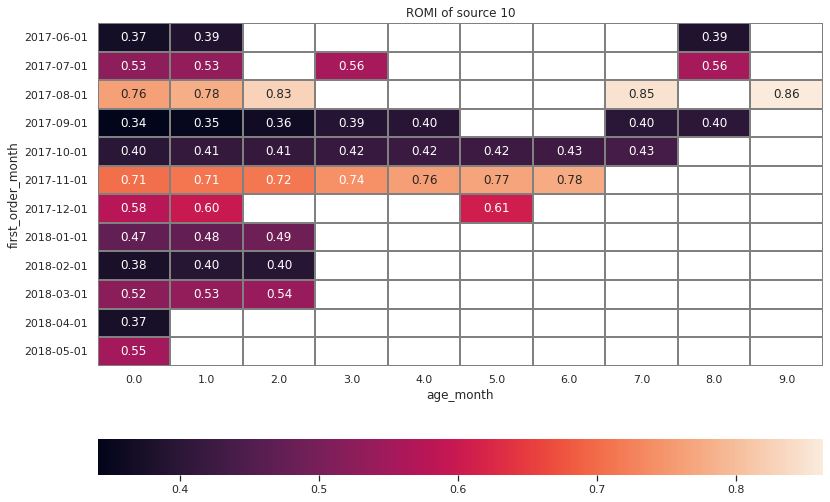

In [289]:
for source, df in buyers.groupby('source_id'):
    
    #we have values in 7 source, but it is not much
    if source == 7:
        continue

    #find number of byuers
    cohort_sizes = df.groupby('first_order_month').agg({'uid': 'nunique'}).reset_index()
    cohort_sizes.rename(columns={'uid': 'n_buyers_x'}, inplace=True)

    #count and sum revenue
    cohorts = pd.merge(orders, df, how='inner', on='uid')\
                .groupby(['first_order_month', 'order_month'])\
                .agg({'revenue': ['sum', 'count']}).reset_index()

    #calculate age
    cohorts['age_month'] = ((cohorts['order_month'] - cohorts['first_order_month']) / np.timedelta64(1,'M')).round()
    cohorts.columns = ['first_order_month', 'order_month', 'revenue', 'n_orders', 'age_month']

    #merge
    cohorts_report = pd.merge(cohort_sizes, cohorts, on = 'first_order_month')

    #take cac from our dataset cac per source
    cac = costs_.groupby('source_id').agg({'cac': 'mean'})['cac'][source]

    #calculate romi
    cohorts_report['romi'] = cohorts_report['revenue'] / cohorts_report['n_buyers_x'] / cac

    cohorts_age = cohorts_report.pivot_table(
        index='first_order_month', 
        columns='age_month', 
        values='romi', 
        aggfunc='sum'
    ).cumsum(axis=1)

    plt.figure(figsize=(13, 9))
    sns.heatmap(cohorts_age, annot=True, fmt='.2f', linewidths=1, linecolor='grey', cbar_kws= {'orientation': 'horizontal'} 
            ).set(title =('ROMI of source {}'.format(source)), yticklabels = cohorts_age.index.astype('str'))
    plt.show()


In [290]:
source_total

,source_id,first_order_dt,n_buyers_x,dt,costs,month,cac,n_buyers_y,revenue,gp,ltv,romi,roi
0,1,2017-06-01,14,2017-06-01,75.20,2017-06-01,5.371429,7138,2.298200e+06,1149100.085,321.966961,59.940658,3.056017e+06
1,1,2017-06-02,7,2017-06-02,62.25,2017-06-01,8.892857,7138,2.298200e+06,1149100.085,321.966961,36.205120,3.691788e+06
2,1,2017-06-03,7,2017-06-03,36.53,2017-06-01,5.218571,7138,2.298200e+06,1149100.085,321.966961,61.696379,6.291168e+06
3,1,2017-06-04,3,2017-06-04,55.00,2017-06-01,18.333333,7138,2.298200e+06,1149100.085,321.966961,17.561834,4.178446e+06
4,1,2017-06-05,18,2017-06-05,57.08,2017-06-01,3.171111,7138,2.298200e+06,1149100.085,321.966961,101.531277,4.026179e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2428,10,2018-05-27,2,2018-05-27,9.92,2018-05-01,4.960000,1773,1.461923e+04,7309.615,8.245477,1.662394,1.472713e+05
2429,10,2018-05-28,10,2018-05-28,21.26,2018-05-01,2.126000,1773,1.461923e+04,7309.615,8.245477,3.878399,6.866402e+04
2430,10,2018-05-29,7,2018-05-29,11.32,2018-05-01,1.617143,1773,1.461923e+04,7309.615,8.245477,5.098793,1.290451e+05
2431,10,2018-05-30,5,2018-05-30,33.15,2018-05-01,6.630000,1773,1.461923e+04,7309.615,8.245477,1.243662,4.400024e+04


In [291]:
source_total['cac'] = (source_total['costs'] / source_total['n_buyers_x']).round(2)
source_total['ltv'] = (source_total['revenue'] / source_total['n_buyers_x']).round(2)


In [292]:
source_total_ltv = (source_total.groupby('source_id').agg({'ltv': 'mean'})).reset_index()
source_total_ltv

,source_id,ltv
0,1,467424.408089
1,2,447895.922376
2,3,15102.031983
3,4,26021.132597
4,5,83116.935840
5,9,17288.122914
6,10,6452.625344


In [293]:
source_total_cac = (source_total.groupby('source_id').agg({'cac': 'mean'})).reset_index()
source_total_cac

,source_id,cac
0,1,9.489695
1,2,16.287072
2,3,15.580358
3,4,7.271934
4,5,8.336860
5,9,6.842483
6,10,6.555656


In [294]:
(source_total
 .groupby('source_id')
 .agg(
     {'cac': 'mean',
      'ltv': 'mean'
     })
 .assign(romi = lambda x : x['ltv'] / x['cac'])
).reset_index()

,source_id,cac,ltv,romi
0,1,9.489695,467424.408089,49255.997560
1,2,16.287072,447895.922376,27500.088858
2,3,15.580358,15102.031983,969.299413
3,4,7.271934,26021.132597,3578.296181
4,5,8.336860,83116.935840,9969.813669
5,9,6.842483,17288.122914,2526.586006
6,10,6.555656,6452.625344,984.283662


In [296]:
fig = px.bar(source_total, x='source_id', y='romi')
fig.update_xaxes(type='category')
fig.show()

Sources 1 has the highest 'romi', then source 2 and source 4 follow. Source 8 has no 'romi' at all but sources 3, 9 and 10 have very low 'romi'.

# Step 3. Write a conclusion: advise marketing experts how much money to invest and where.


###### What sources/platforms would you recommend? Back up your choice: what metrics did you focus on? Why? What conclusions did you draw after finding the metric values?


 * In the project there were three DataFrames, namely, visits, orders and costs. The visits DataFrame shows the website was visited by 359,400 visitors. The least visitor was 1 and the highest visitirs were 10 and the avaerage number of visitors were 3.75 (almost 4).
 
 * There were 50,415 orders made for the whole year. The lowest order was zero and the highest purchase was 2,633 dollars but the average amount of money paid for the order was 4.99 (approximately 5 dollars).
 
 * The number of costs performed in the website was 2,542. The minimum, maximum and average costs were 0.54, 1788.28 and 129.5 respectively.
 
 * The average number of visitors in a day, week and month were 907, 5,716 and 23,228 respectively.
 
 * The highest order was done between November 2017 to January 2018. This may be due to holidays, like Thanks Giving, Christmas and New Year, many customers ordered goods for the holidays and for gifts. Where as the lowest order was done between June 2017 and August 2018, that is on summer. This may be many people were focusing on vacation than ordering goods.
 
 * The average session per day was 987.
 
 * The average sessions per day per user is 987.
 
 * The average number of visitors in a day was 907.
 
 * The average sessions per week per user is 6781.
 
 * The average number of visitors in a week was 5724.
 
 * The average sessions per month per user is 29,950.
 
 * The average number of visitors in a month was 23,228..
 
 * The session per secon was from 0 to 84,480 which is from 0 to 1408 minutes and the average session length (asl) was 60 seconds which is equivalent to 1 minute. Purchases are dome mainly with in 1 minute.
 
 * The average price for a purchase is 4.99 (approximately 5 dollars). 
 
 * The first order or purchase was on 2017-06-01 and the last order or purchase was done on 2018-06-01.
 
 * In 2017 there were 27,467 purchases or orders where as in the next year (2018) there were 22,948 purchases or orders. That means the average order per was 25,207.
 
 * The ordering time ranges from 0 to 363 days. The average ordering time was 17 days. At zero day (first day) the ordering time was 0.118 hour.
 
 * The orders per month ranged from 1 to 6218 and the average order per month was 3878.
 
 * The orders per week ranged from 1 to 1894 and the average order per week was 800.
 
 * The orders per day ranged from 1 to 814 and the average order per day was 138.
 
 * The average revenue is 3190.
 
 * The average customers per buyers is 1.15.
 
 * The total marketing cost was 329,131.62.
 
 * As it is seen from the heatmap on September 2017 cohort was succesful.
 
 * Cohort decrease from month to month.
 
 * The cohort has None visitors after their first vsit on May 2018.
 
 * On April 2018 the cohort back after one month.
 
 * The highest cohort is on June 2017. It goes upto month 11.
 
 * When ROI calculations yield a positive figure, it means that total returns exceed total costs. Where as when ROI calculations yield a negative figure, it means that total costs exceed total return.
 
 * From the above calculations ROI of the cohort is negative. A negative return occurs when a company experiences a financial loss or investors experience a loss in the value of their investments during a specific period of time. In other words, the business or individual loses money on either their business or their investment.
 
 * It's usually a bad sign if ROI is negative. This means that the company is selling cheaper than it buys, even though every business's philosophy is "buy cheap, sell high". There is room for improvement,
 
      * It urgently needs to reconsider either its prices or its range of goods and services.
      
      * Improve business metrics.
      
      * But, Sometimes companies sell goods at prices lower than the prime cost in order to get customers involved in purchasing services and support.
      
      
   I would recommend the marketing experts to invest more in sources 1, 2 and 4 and to make purther survey and study specially on sources 3, 9 and 10.